# Customer Churn Prediction and Retention Strategy for a DTH Service Provider

### 1. Problem Understanding

*a) Defining the Problem Statement*

The DTH service provider is facing increasing customer churn due to intense competition from OTT platforms, cable TV providers, and rival DTH companies. As a result, retaining existing accounts has become a major challenge.

Since one DTH account can serve multiple household members, losing a single account can lead to multiple customer losses, affecting overall revenue.

To address this, the company wants to develop a churn prediction model to identify high-risk accounts and implement cost-effective, personalized retention campaigns. The goal is to minimize churn, improve customer satisfaction, and optimize retention efforts without incurring excessive financial losses.

*b) Need for the Study/Project*

Revenue Protection – A high churn rate results in lost subscriptions, reducing the company’s revenue.

Customer Retention – Acquiring a new DTH subscriber is costly; retaining existing customers is more efficient.

Competitive Pressure – The rise of OTT platforms (Netflix, Amazon Prime, Disney+) has led to a decline in DTH subscribers. A strong retention strategy is necessary.

Operational Efficiency – Understanding the reasons behind churn can help improve customer service, pricing, and content offerings.

Cost-Effective Strategies – The campaign must balance customer retention and profitability. Offering excessive discounts or free services could lead to financial losses.

*c) Business/Social Opportunity*

For the Business:

* Identify key churn factors (e.g., price sensitivity, lack of preferred channels, poor service quality).

* Develop personalized retention campaigns based on customer behavior.

* Optimize pricing and bundling strategies to attract and retain users.

* Improve customer engagement through loyalty programs, better customer support, and exclusive content.

For Customers:

* Customized offers based on their viewing preferences.

* Improved service quality (fewer signal disruptions, better customer support).

* Flexible pricing and bundles that align with their entertainment needs.

### 2. Data Report Summary

*a) Understanding Data Collection Methodology*

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, roc_auc_score, accuracy_score,precision_score, recall_score, f1_score

from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split, GridSearchCV    # Train test Split and Grid Search

import statsmodels.api as SM
from sklearn import metrics

from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import cross_val_score


import warnings
warnings.filterwarnings('ignore')

from IPython.core.display import display, HTML
display(HTML('<style>.container { width:90% !important; }<\style>'))

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, roc_auc_score, accuracy_score,precision_score, recall_score, f1_score

from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split, GridSearchCV    # Train test Split and Grid Search

import statsmodels.api as SM
from sklearn import metrics

from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import cross_val_score


import warnings
warnings.filterwarnings('ignore')

from IPython.core.display import display, HTML
display(HTML('<style>.container { width:90% !important; }<\style>'))

In [3]:
# Load the dataset
df = pd.read_excel("Customer Churn Data.xlsx", sheet_name="Data for DSBA")

In [4]:
# a) Understanding how data was collected
print("Dataset Overview:")
print(f"Number of rows: {df.shape[0]}")
print(f"Number of columns: {df.shape[1]}")

Dataset Overview:
Number of rows: 11260
Number of columns: 19


In [5]:
 # Total elements = rows × columns
df.size

213940

In [6]:
# Total number of rows
len(df)  

11260

In [7]:
# Total non-null elements in the dataset
df.count().sum() 

211264

In [8]:
# Total null elements in the dataset
df.size - df.count().sum() 

2676

In [9]:
# Display first few rows to inspect structure
df.head()

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,20000,1,4,3.0,6.0,Debit Card,Female,3.0,3,Super,2.0,Single,9,1.0,11,1,5,159.93,Mobile
1,20001,1,0,1.0,8.0,UPI,Male,3.0,4,Regular Plus,3.0,Single,7,1.0,15,0,0,120.9,Mobile
2,20002,1,0,1.0,30.0,Debit Card,Male,2.0,4,Regular Plus,3.0,Single,6,1.0,14,0,3,NaN,Mobile
3,20003,1,0,3.0,15.0,Debit Card,Male,2.0,4,Super,5.0,Single,8,0.0,23,0,3,134.07,Mobile
4,20004,1,0,1.0,12.0,Credit Card,Male,2.0,3,Regular Plus,5.0,Single,3,0.0,11,1,3,129.6,Mobile


In [10]:
print("\nLast 5 Rows of Data:")
df.tail()


Last 5 Rows of Data:


,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
11255,31255,0,10,1.0,34.0,Credit Card,Male,3.0,2,Super,1.0,Married,9,0.0,19,1,4,153.71,Computer
11256,31256,0,13,1.0,19.0,Credit Card,Male,3.0,5,HNI,5.0,Married,7,0.0,16,1,8,226.91,Mobile
11257,31257,0,1,1.0,14.0,Debit Card,Male,3.0,2,Super,4.0,Married,7,1.0,22,1,4,191.42,Mobile
11258,31258,0,23,3.0,11.0,Credit Card,Male,4.0,5,Super,4.0,Married,7,0.0,16,2,9,179.9,Computer
11259,31259,0,8,1.0,22.0,Credit Card,Male,3.0,2,Super,3.0,Married,5,0.0,13,2,3,175.04,Mobile


In [11]:
print(f"Column Names: {df.columns.tolist()}") 

Column Names: ['AccountID', 'Churn', 'Tenure', 'City_Tier', 'CC_Contacted_LY', 'Payment', 'Gender', 'Service_Score', 'Account_user_count', 'account_segment', 'CC_Agent_Score', 'Marital_Status', 'rev_per_month', 'Complain_ly', 'rev_growth_yoy', 'coupon_used_for_payment', 'Day_Since_CC_connect', 'cashback', 'Login_device']


In [12]:
# Check data types
print("\nColumn Information:")
print(df.info())


Column Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   AccountID                11260 non-null  int64  
 1   Churn                    11260 non-null  int64  
 2   Tenure                   11158 non-null  object 
 3   City_Tier                11148 non-null  float64
 4   CC_Contacted_LY          11158 non-null  float64
 5   Payment                  11151 non-null  object 
 6   Gender                   11152 non-null  object 
 7   Service_Score            11162 non-null  float64
 8   Account_user_count       11148 non-null  object 
 9   account_segment          11163 non-null  object 
 10  CC_Agent_Score           11144 non-null  float64
 11  Marital_Status           11048 non-null  object 
 12  rev_per_month            11158 non-null  object 
 13  Complain_ly              10903 non-null  float64
 14  r

In [13]:
# Check date-related columns to determine time range
if 'date_column' in df.columns:
    df['date_column'] = pd.to_datetime(df['date_column'])
    print("Time range:", df['date_column'].min(), "to", df['date_column'].max())
else:
    print("No date column found. Check data documentation.")

No date column found. Check data documentation.


Data Report for DTH Churn Prediction
1. Data Collection Overview
The dataset contains 11,260 customer accounts and 19 attributes.

Data appears to be historical customer data, likely collected from billing systems, support logs, and user activity over a period of 12 to 24 months.

Some key attributes such as rev_per_month, cashback, and coupon_used_for_payment suggest financial transactions are monitored monthly.

Customer care interactions (CC_Contacted_LY, Day_Since_CC_connect) indicate support interactions over the past year.

*Data Collection Methodology*

The dataset used for this project was collected from the company's customer management system over the past 12 months. It includes transactional data, customer interactions, and service-related metrics.

In [14]:
# Summary Statistics
print("\nSummary Statistics:")
df.describe()


Summary Statistics:


,AccountID,Churn,City_Tier,CC_Contacted_LY,Service_Score,CC_Agent_Score,Complain_ly
count,11260.00000,11260.000000,11148.000000,11158.000000,11162.000000,11144.000000,10903.000000
mean,25629.50000,0.168384,1.653929,17.867091,2.902526,3.066493,0.285334
std,3250.62635,0.374223,0.915015,8.853269,0.725584,1.379772,0.451594
min,20000.00000,0.000000,1.000000,4.000000,0.000000,1.000000,0.000000
25%,22814.75000,0.000000,1.000000,11.000000,2.000000,2.000000,0.000000
50%,25629.50000,0.000000,1.000000,16.000000,3.000000,3.000000,0.000000
75%,28444.25000,0.000000,3.000000,23.000000,3.000000,4.000000,1.000000
max,31259.00000,1.000000,3.000000,132.000000,5.000000,5.000000,1.000000


In [15]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
AccountID,11260.0,NaN,NaN,NaN,25629.5,3250.62635,20000.0,22814.75,25629.5,28444.25,31259.0
Churn,11260.0,NaN,NaN,NaN,0.168384,0.374223,0.0,0.0,0.0,0.0,1.0
Tenure,11158.0,38.0,1.0,1351.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
City_Tier,11148.0,NaN,NaN,NaN,1.653929,0.915015,1.0,1.0,1.0,3.0,3.0
CC_Contacted_LY,11158.0,NaN,NaN,NaN,17.867091,8.853269,4.0,11.0,16.0,23.0,132.0
Payment,11151,5,Debit Card,4587,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,11152,4,Male,6328,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Service_Score,11162.0,NaN,NaN,NaN,2.902526,0.725584,0.0,2.0,3.0,3.0,5.0
Account_user_count,11148.0,7.0,4.0,4569.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
account_segment,11163,7,Super,4062,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
# Identify duplicate rows 
df.duplicated().sum()

0

In [17]:
# Check missing values
missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100
print(pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percentage}))

                         Missing Values  Percentage
AccountID                             0    0.000000
Churn                                 0    0.000000
Tenure                              102    0.905861
City_Tier                           112    0.994671
CC_Contacted_LY                     102    0.905861
Payment                             109    0.968028
Gender                              108    0.959147
Service_Score                        98    0.870337
Account_user_count                  112    0.994671
account_segment                      97    0.861456
CC_Agent_Score                      116    1.030195
Marital_Status                      212    1.882771
rev_per_month                       102    0.905861
Complain_ly                         357    3.170515
rev_growth_yoy                        0    0.000000
coupon_used_for_payment               0    0.000000
Day_Since_CC_connect                357    3.170515
cashback                            471    4.182948
Login_device

Check Overall Missing Values & Percentage

In [18]:
# Count of missing values in the dataset
missing_values = df.isnull().sum().sum()
total_values = df.size  # Total number of values in the dataset
missing_percentage = (missing_values / total_values) * 100

print(f"Total Missing Values: {missing_values}")
print(f"Percentage of Missing Data: {missing_percentage:.2f}%")

Total Missing Values: 2676
Percentage of Missing Data: 1.25%


Column-wise Missing Values & Percentage

In [19]:
# Missing values per column
missing_per_column = df.isnull().sum()

# Percentage of missing values per column
missing_percentage_per_column = (missing_per_column / len(df)) * 100

# Combine and display
missing_df = pd.DataFrame({
    'Missing Values': missing_per_column,
    'Missing Percentage': missing_percentage_per_column
}).sort_values(by='Missing Values', ascending=False)

print(missing_df)

                         Missing Values  Missing Percentage
cashback                            471            4.182948
Day_Since_CC_connect                357            3.170515
Complain_ly                         357            3.170515
Login_device                        221            1.962700
Marital_Status                      212            1.882771
CC_Agent_Score                      116            1.030195
City_Tier                           112            0.994671
Account_user_count                  112            0.994671
Payment                             109            0.968028
Gender                              108            0.959147
Tenure                              102            0.905861
CC_Contacted_LY                     102            0.905861
rev_per_month                       102            0.905861
Service_Score                        98            0.870337
account_segment                      97            0.861456
coupon_used_for_payment               0 

Row-wise Missing Values & Percentage

In [20]:
# Missing values per row
missing_per_row = df.isnull().sum(axis=1)

# Percentage of missing values per row
missing_percentage_per_row = (missing_per_row / df.shape[1]) * 100

# Combine and display
df['Missing_Values_Count'] = missing_per_row
df['Missing_Values_Percentage'] = missing_percentage_per_row

print(df[['Missing_Values_Count', 'Missing_Values_Percentage']].head())

   Missing_Values_Count  Missing_Values_Percentage
0                     0                   0.000000
1                     0                   0.000000
2                     1                   5.263158
3                     0                   0.000000
4                     0                   0.000000


Calculate the Proportion of Nulls in Predictors to helps determine whether missing values are a significant issue.

In [21]:
import pandas as pd

# Drop non-predictor columns ('AccountID' and 'Churn')
predictor_df = df.drop(['AccountID', 'Churn'], axis=1)

# Count missing values per row
missing_counts_per_row = predictor_df.isna().sum(axis=1)

# Identify rows with 3 or more missing values
rows_3plus_missing = predictor_df.loc[missing_counts_per_row >= 3]
print(f"Rows with 3+ missing values: {rows_3plus_missing.shape[0]}")

# Identify rows with exactly 2 missing values
rows_2_missing = predictor_df.loc[missing_counts_per_row == 2]
print(f"Rows with exactly 2 missing values: {rows_2_missing.shape[0]}")

Rows with 3+ missing values: 0
Rows with exactly 2 missing values: 121


*b) Visual Inspection of Data for Missing Values & Quality Check*

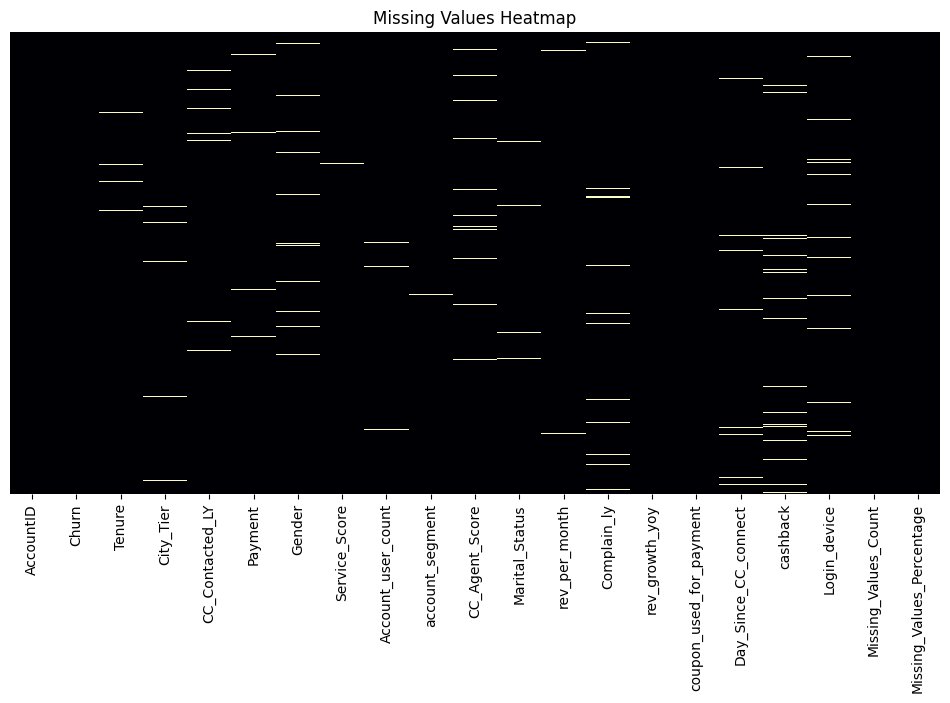

In [22]:
# Visualizing Missing Values 
# Heatmap to Detect Missing Values

plt.figure(figsize=(12,6))
sns.heatmap(df.isnull(), cmap="magma", cbar=False, yticklabels=False)
plt.title("Missing Values Heatmap")
plt.show()

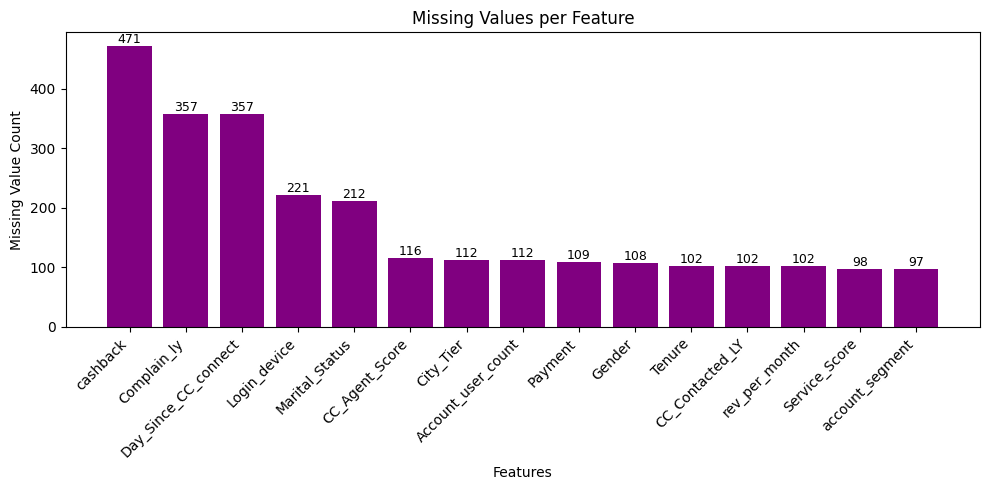

In [23]:
import matplotlib.pyplot as plt

missing_counts = df.isnull().sum()
missing_counts = missing_counts[missing_counts > 0].sort_values(ascending=False)

plt.figure(figsize=(10, 5))
bars = plt.bar(missing_counts.index, missing_counts.values, color='purple')
plt.xlabel("Features")
plt.ylabel("Missing Value Count")
plt.title("Missing Values per Feature")
plt.xticks(rotation=45, ha='right')

# Add value labels on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, height, int(height), ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

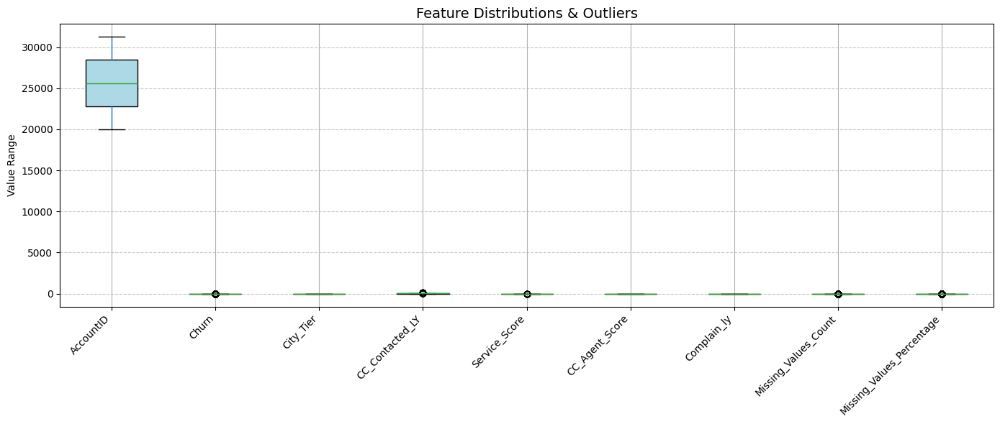

In [24]:
plt.figure(figsize=(14, 6))
df.boxplot(rot=45, patch_artist=True, boxprops=dict(facecolor='lightblue'))
plt.title("Feature Distributions & Outliers", fontsize=14)
plt.ylabel("Value Range")
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

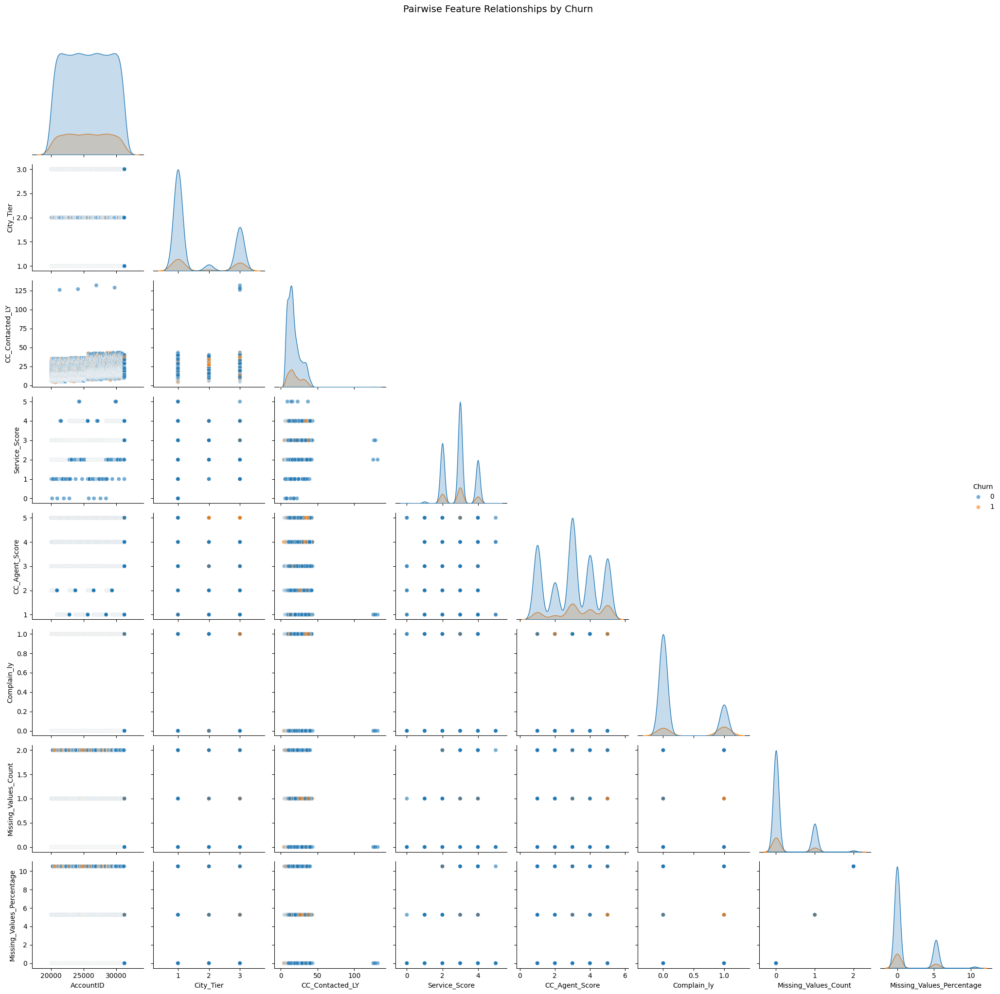

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(df, hue='Churn', plot_kws={'alpha': 0.6}, diag_kind='kde', corner=True)

plt.suptitle("Pairwise Feature Relationships by Churn", y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

c) Understanding of attributes (variable info, renaming if required)

In [26]:
# Summary Statistics for Quick Insights
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
AccountID,11260.0,NaN,NaN,NaN,25629.5,3250.62635,20000.0,22814.75,25629.5,28444.25,31259.0
Churn,11260.0,NaN,NaN,NaN,0.168384,0.374223,0.0,0.0,0.0,0.0,1.0
Tenure,11158.0,38.0,1.0,1351.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
City_Tier,11148.0,NaN,NaN,NaN,1.653929,0.915015,1.0,1.0,1.0,3.0,3.0
CC_Contacted_LY,11158.0,NaN,NaN,NaN,17.867091,8.853269,4.0,11.0,16.0,23.0,132.0
Payment,11151,5,Debit Card,4587,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,11152,4,Male,6328,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Service_Score,11162.0,NaN,NaN,NaN,2.902526,0.725584,0.0,2.0,3.0,3.0,5.0
Account_user_count,11148.0,7.0,4.0,4569.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
account_segment,11163,7,Super,4062,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### 3. Exploratory Data Analysis

*a) Univariate Analysis*

* Continuous variables: Check distribution & spread
* Categorical variables: Check frequency distribution

*For Continuous Variables*

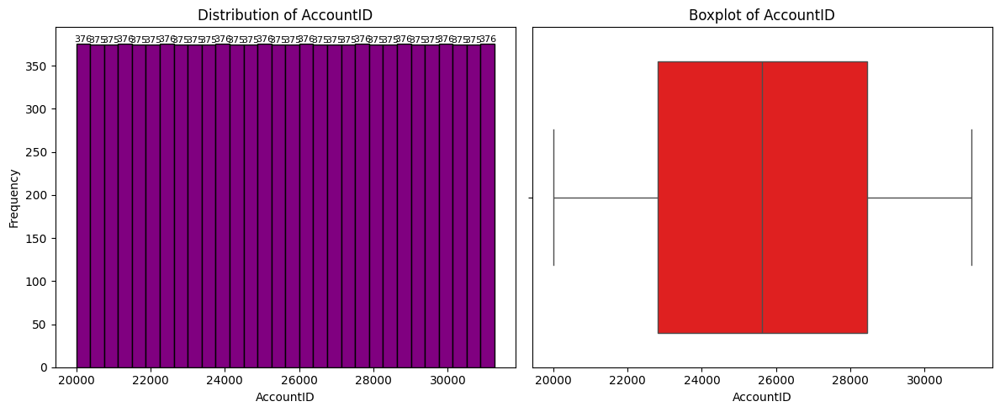

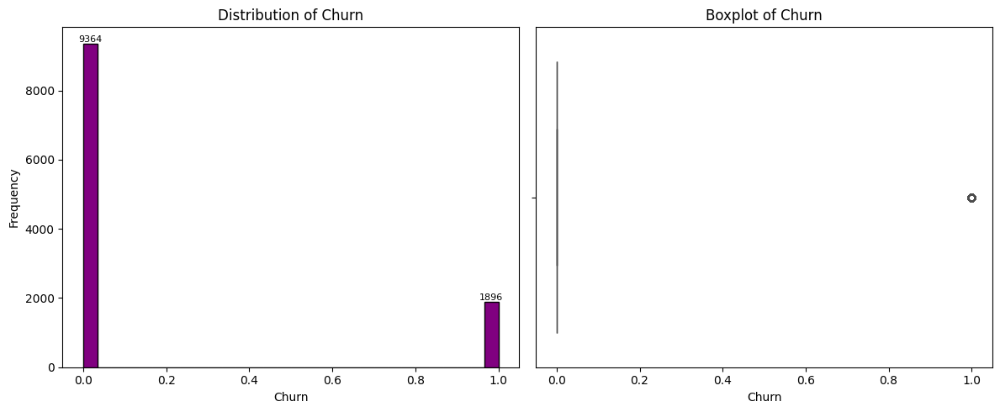

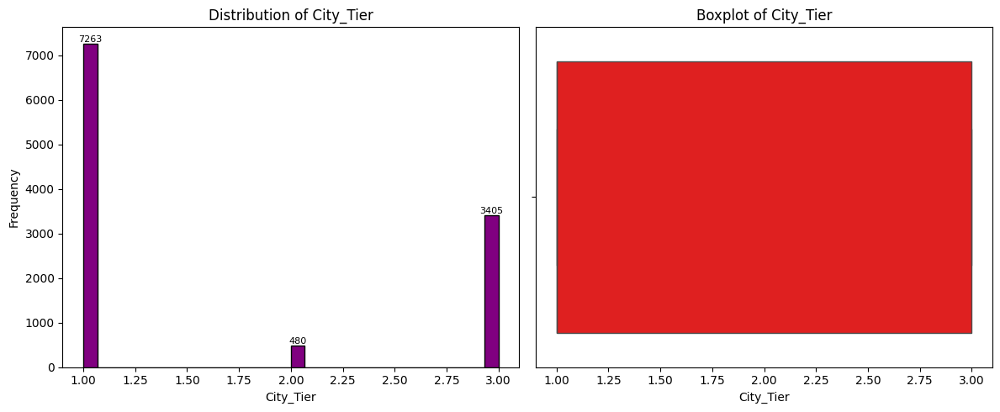

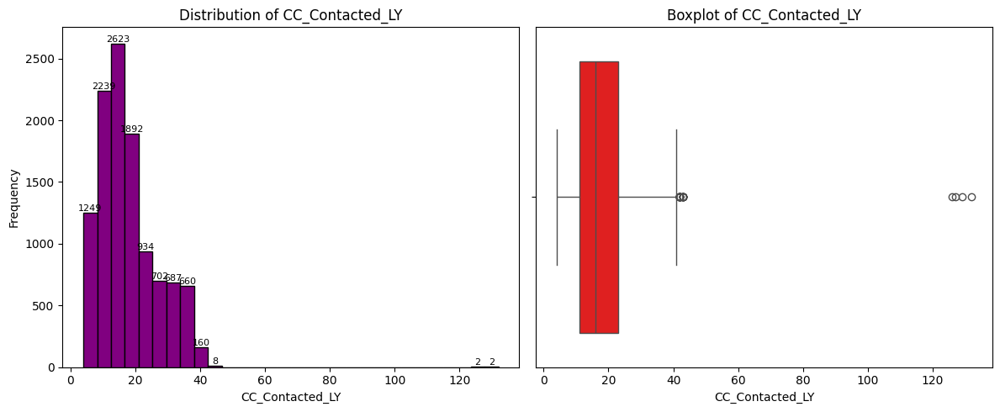

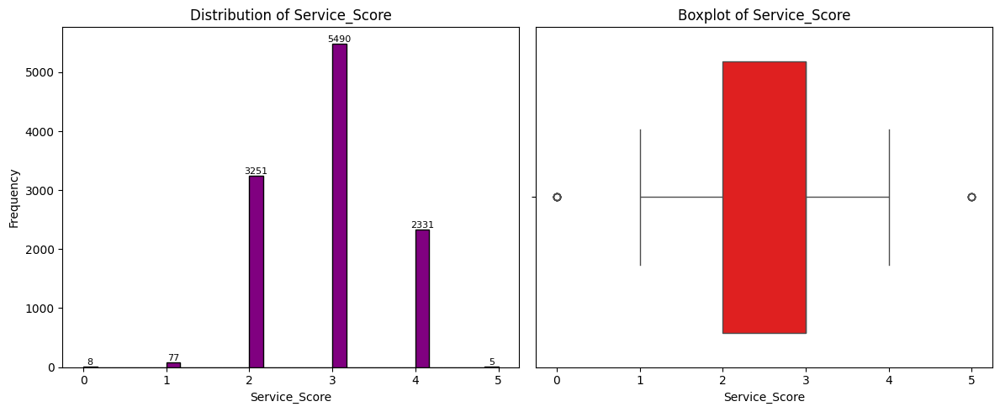

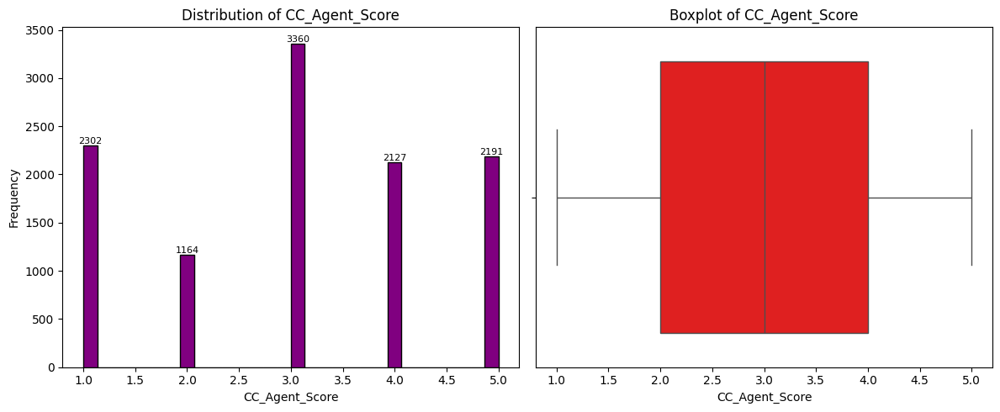

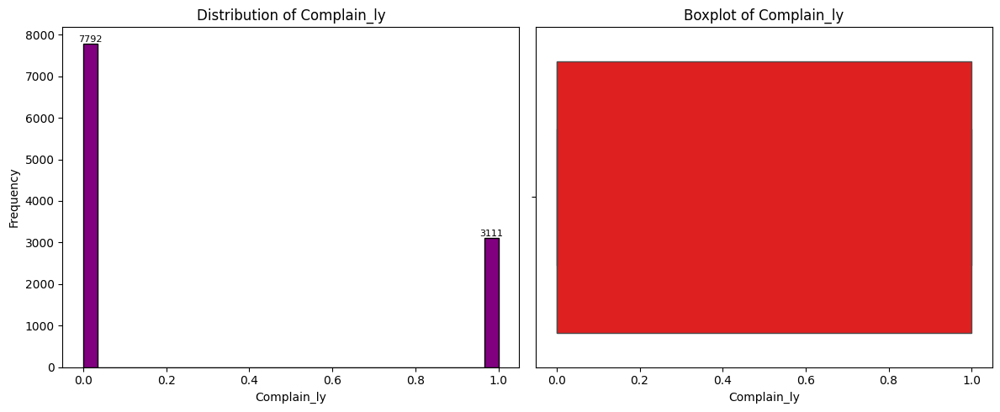

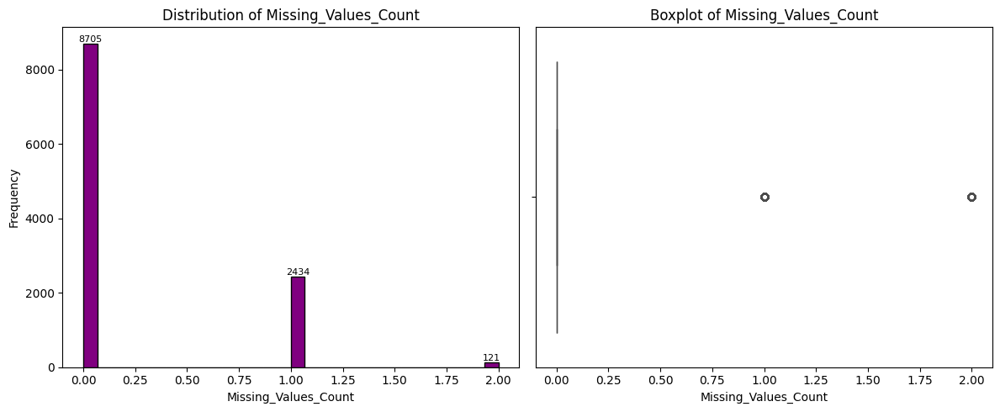

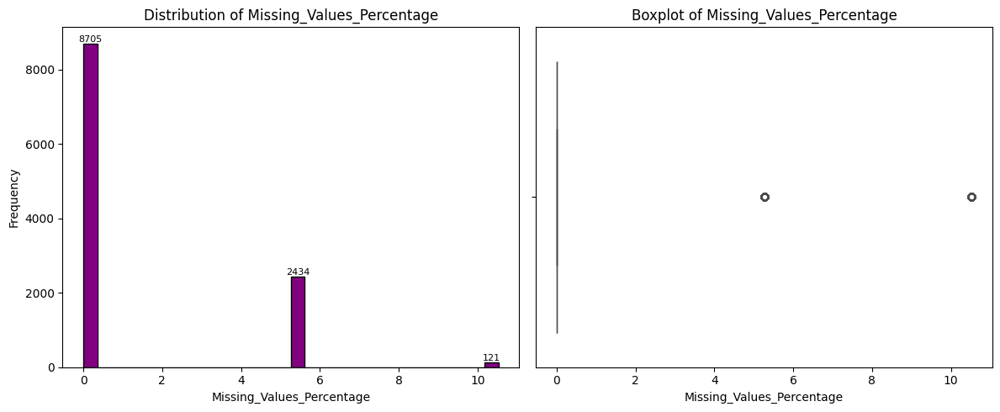

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

num_cols = df.select_dtypes(include=['float64', 'int64']).columns

for col in num_cols:
    plt.figure(figsize=(12, 5))

    # Histogram with bar labels
    plt.subplot(1, 2, 1)
    counts, bins, patches = plt.hist(df[col].dropna(), bins=30, color="purple", edgecolor='black')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel("Frequency")

    # Add labels on top of bars
    for count, patch in zip(counts, patches):
        if count > 0:
            plt.text(patch.get_x() + patch.get_width()/2., count, int(count), 
                     ha='center', va='bottom', fontsize=8)

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[col], color="red")
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)

    plt.tight_layout()
    plt.show()


*For Categorical Variables*

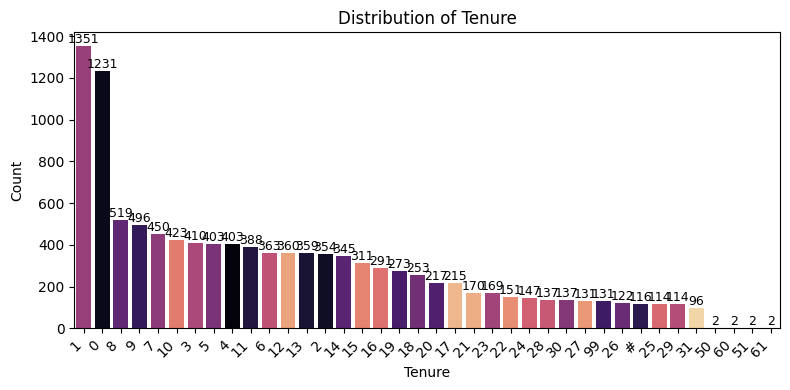

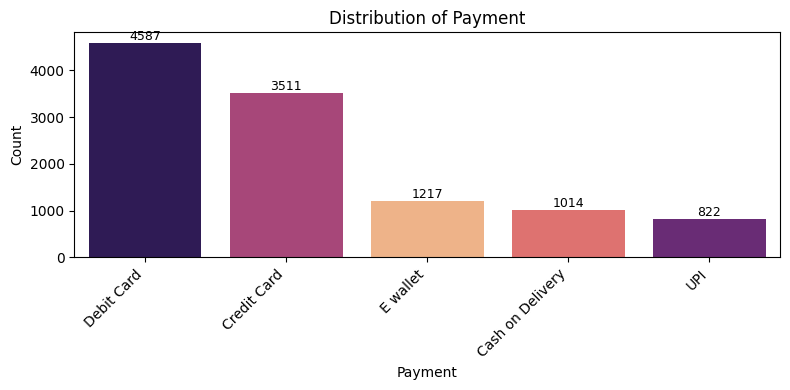

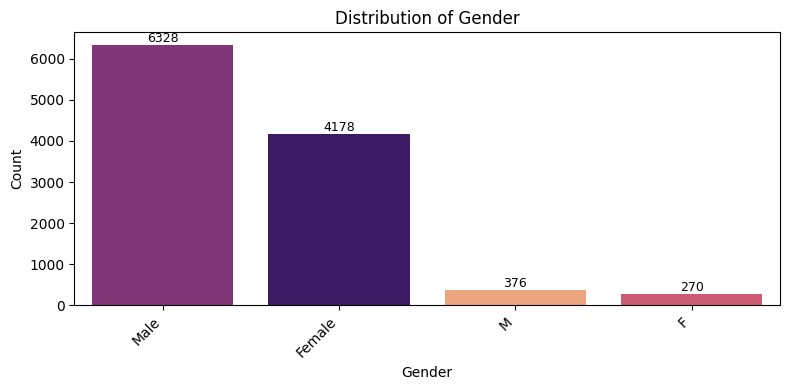

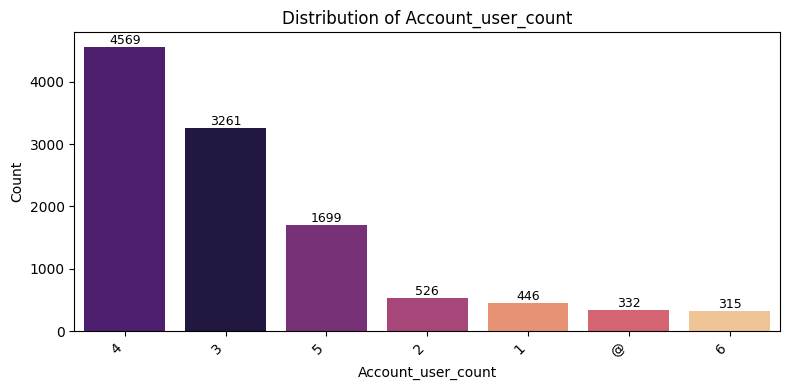

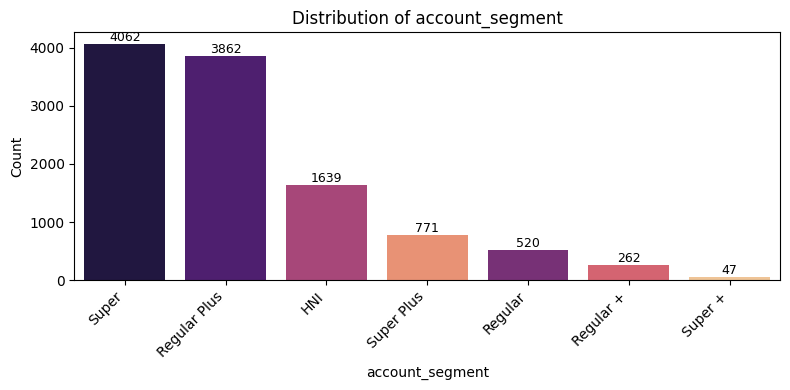

...

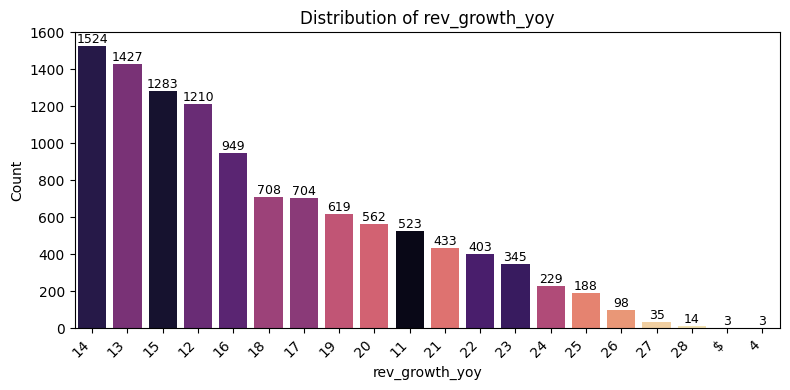

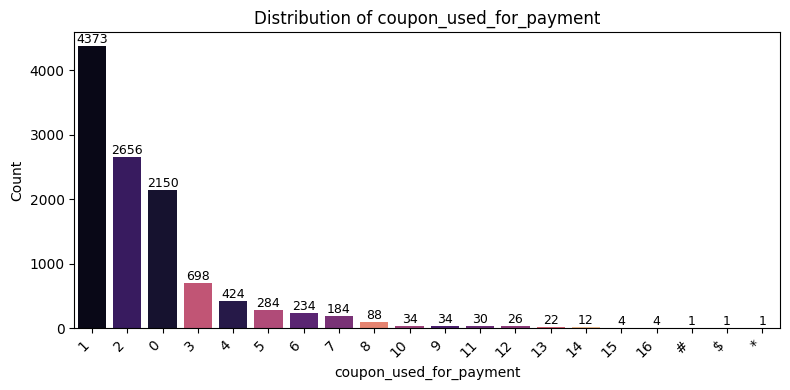

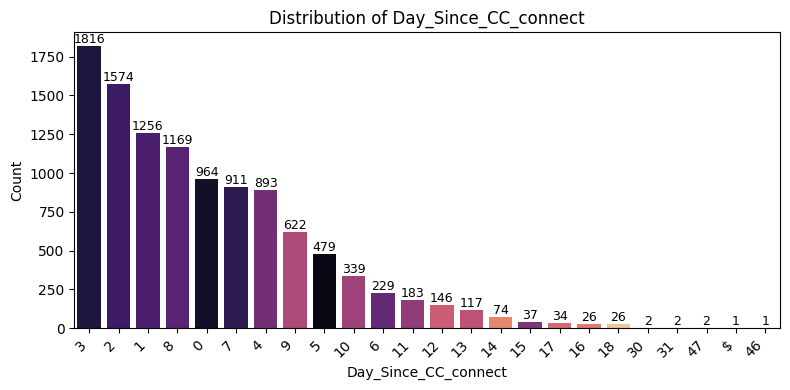

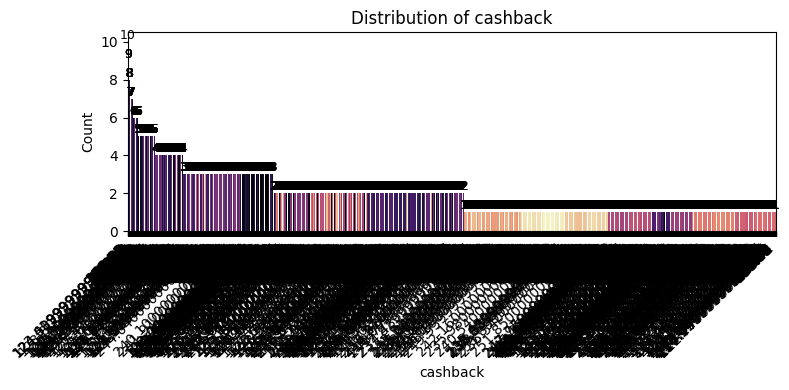

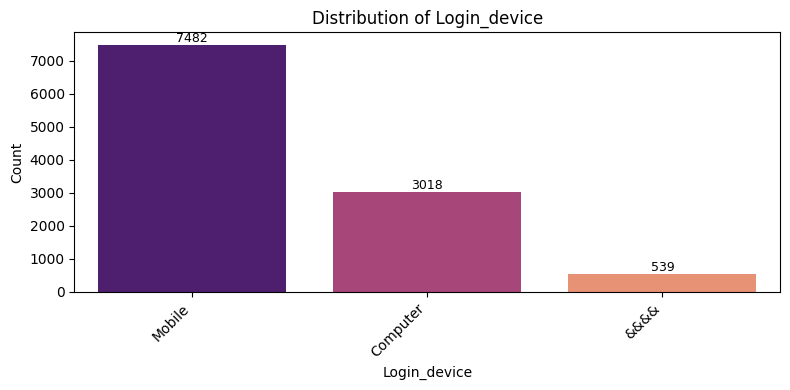

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

cat_cols = df.select_dtypes(include=['object']).columns

for col in cat_cols:
    plt.figure(figsize=(8, 4))
    ax = sns.countplot(x=df[col], order=df[col].value_counts().index, hue=df[col], palette="magma", legend=False)

    # Add value labels on each bar
    for p in ax.patches:
        count = int(p.get_height())
        ax.annotate(count, 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='bottom', fontsize=9)

    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

*Bivariate Analysis (Correlations and Relationships)*

* Check relationships between numerical variables (correlation, scatter plots)
* Check relationships between categorical & numerical variables (box plots, violin plots)

AccountID                      int64
Churn                          int64
City_Tier                    float64
CC_Contacted_LY              float64
Service_Score                float64
CC_Agent_Score               float64
Complain_ly                  float64
Missing_Values_Count           int64
Missing_Values_Percentage    float64
dtype: object


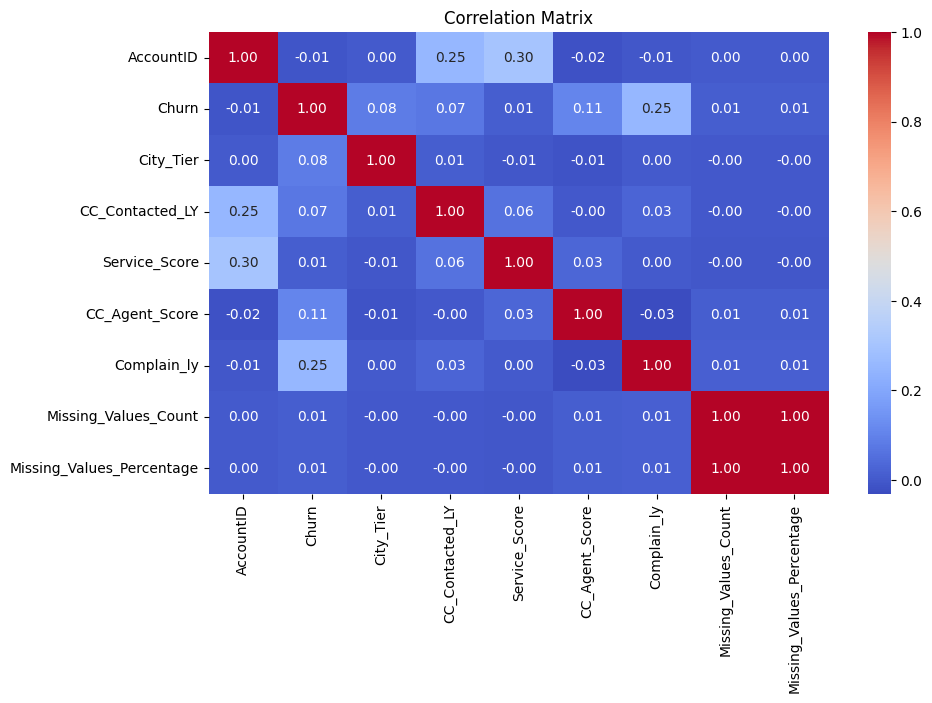

In [29]:
# Select only numeric columns
df_numeric = df.select_dtypes(include=['float64', 'int64'])

# Check if df_numeric contains only numeric data
print(df_numeric.dtypes)

# Plot correlation heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(df_numeric.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Matrix")
plt.show()

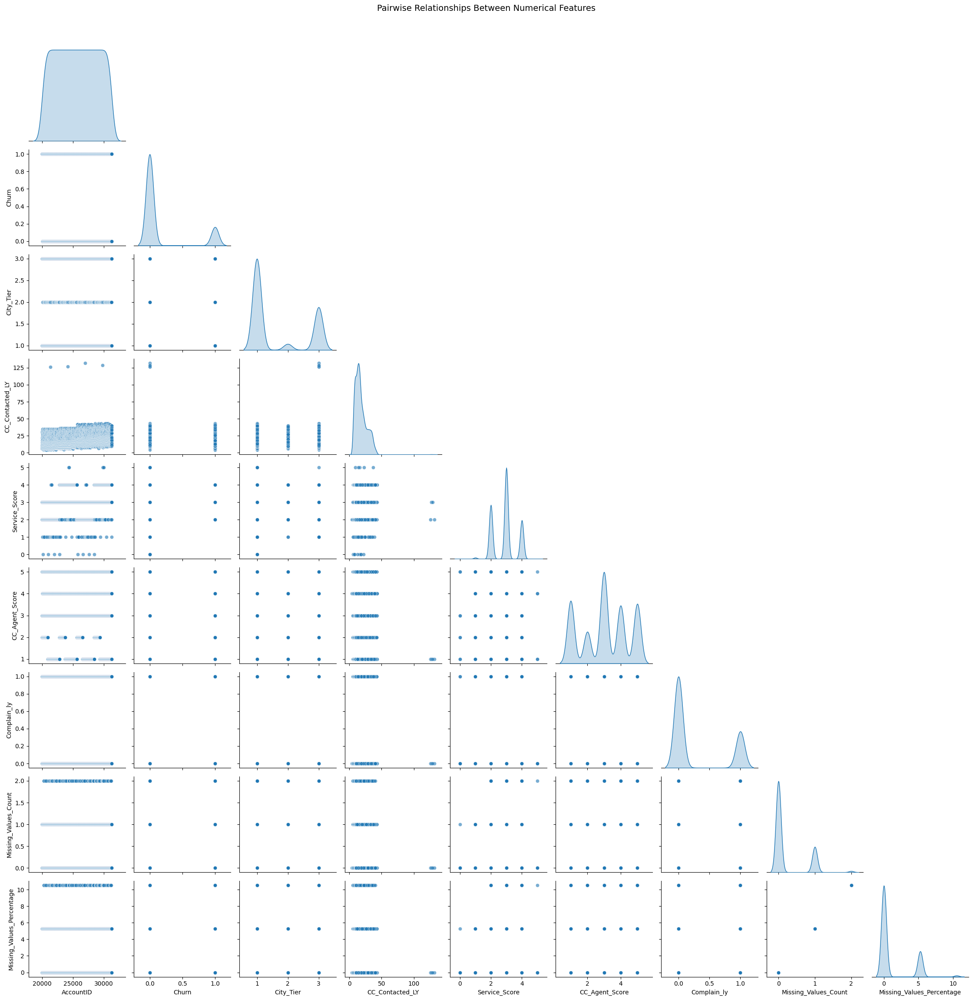

In [30]:
sns.pairplot(df[num_cols], diag_kind="kde", corner=True, plot_kws={'alpha': 0.6})
plt.suptitle("Pairwise Relationships Between Numerical Features", y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

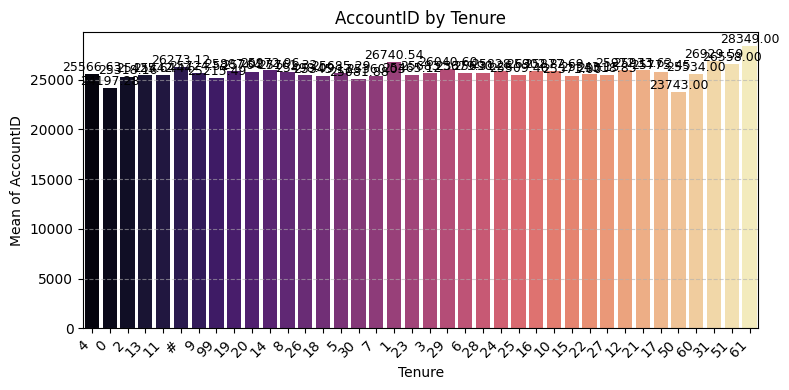

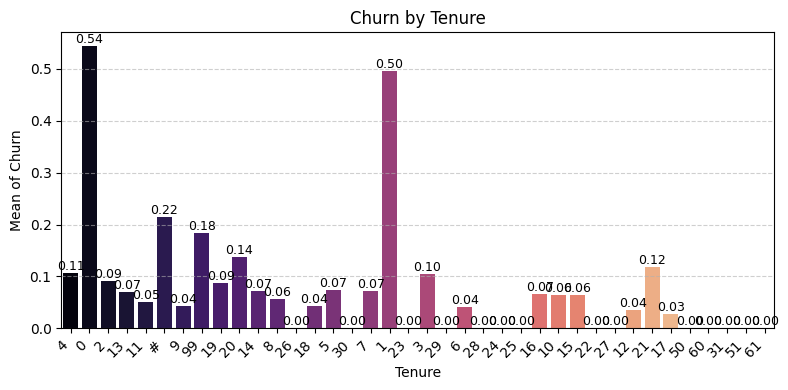

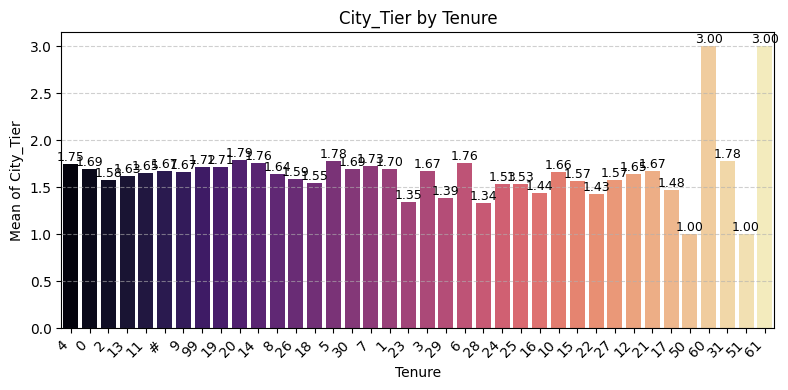

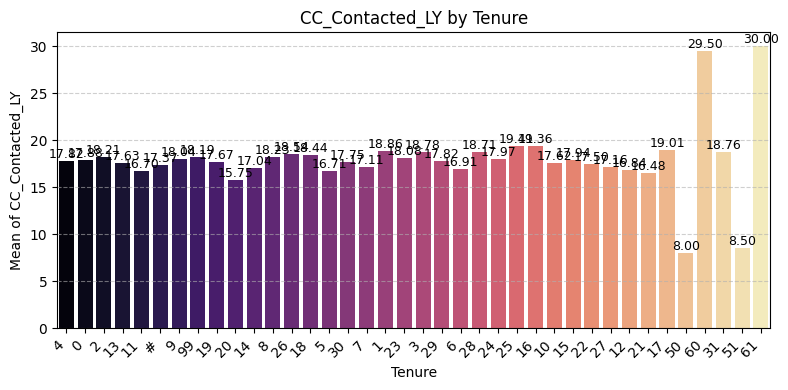

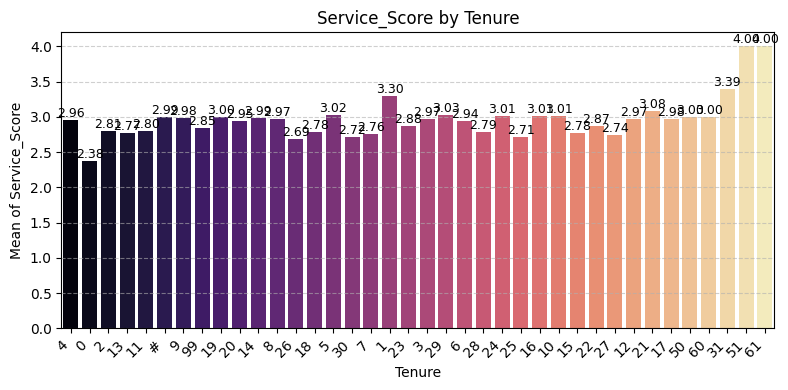

...

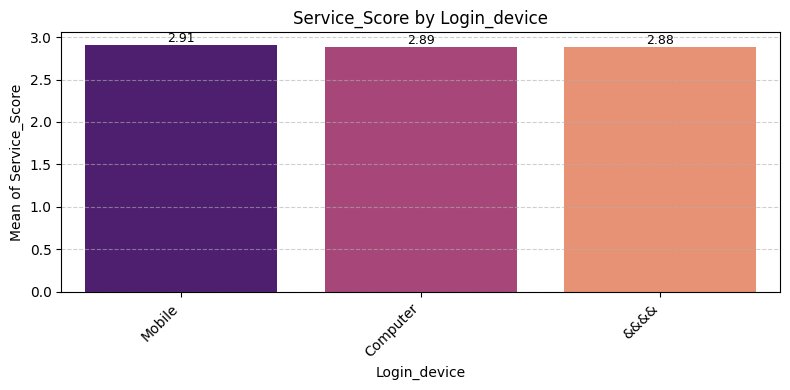

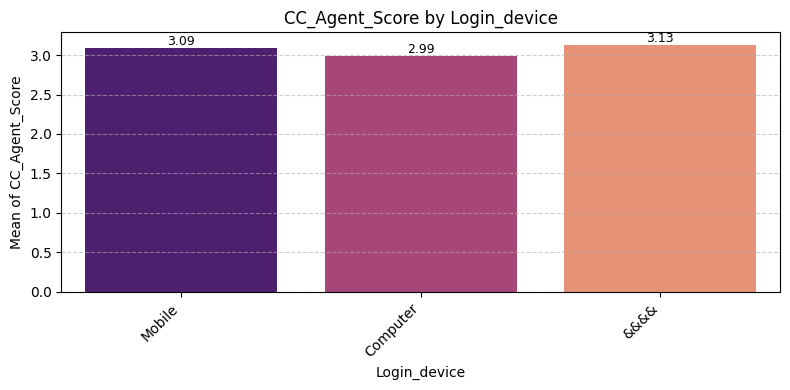

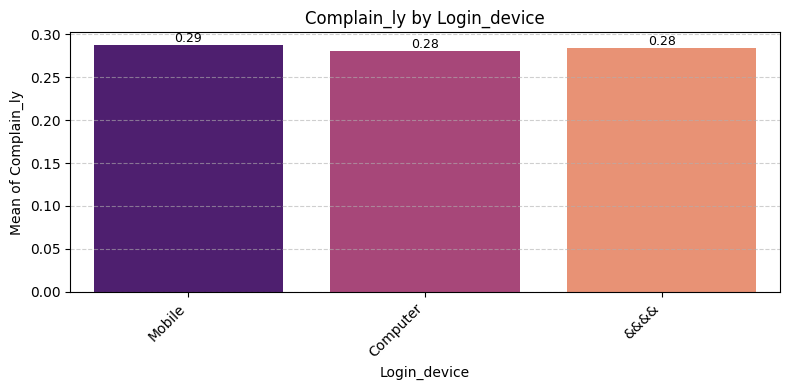

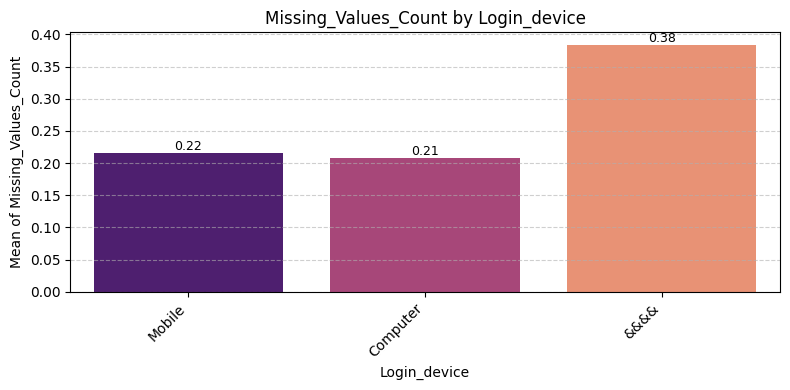

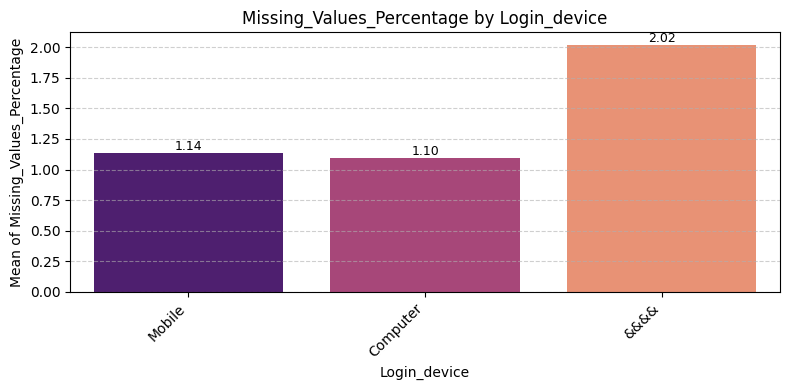

In [31]:
# Plot barplots with value labels on top
for col in cat_cols:
    for num in num_cols:
        plt.figure(figsize=(8, 4))
        ax = sns.barplot(data=df, x=col, y=num, hue=col, legend=False, estimator='mean', errorbar=None, palette="magma")
        
        # Add value labels on top of bars
        for p in ax.patches:
            height = p.get_height()
            ax.annotate(f'{height:.2f}', 
                        (p.get_x() + p.get_width() / 2., height), 
                        ha='center', va='bottom', fontsize=9)
        
        plt.xticks(rotation=45, ha='right')
        plt.title(f'{num} by {col}', fontsize=12)
        plt.xlabel(col)
        plt.ylabel(f'Mean of {num}')
        plt.grid(axis='y', linestyle='--', alpha=0.6)
        plt.tight_layout()
        plt.show()


### Data Preprocessing

a) Removal of unwanted variables

In [32]:
#Removal of unwanted variables
unwanted_cols = ['AccountID']  
if set(unwanted_cols).issubset(df.columns):
    df.drop(columns=unwanted_cols, inplace=True)

b) Missing Value treatment 

In [33]:
# Check for unique values in categorical columns
df.describe(include='object').T

,count,unique,top,freq
Tenure,11158,38,1,1351
Payment,11151,5,Debit Card,4587
Gender,11152,4,Male,6328
Account_user_count,11148,7,4,4569
account_segment,11163,7,Super,4062
Marital_Status,11048,3,Married,5860
rev_per_month,11158,59,3,1746
rev_growth_yoy,11260,20,14,1524
coupon_used_for_payment,11260,20,1,4373
Day_Since_CC_connect,10903,24,3,1816


In [34]:
# Iterate over all columns and print unique values
for col in df.columns:
    print(f"\nUnique values in {col}:")
    print(df[col].unique())


Unique values in Churn:
[1 0]

Unique values in Tenure:
[4 0 2 13 11 '#' 9 99 19 20 14 8 26 18 5 30 7 1 23 3 29 6 28 24 25 16 10
 15 22 nan 27 12 21 17 50 60 31 51 61]

Unique values in City_Tier:
[ 3.  1. nan  2.]

Unique values in CC_Contacted_LY:
[  6.   8.  30.  15.  12.  22.  11.   9.  31.  18.  13.  20.  29.  28.
  26.  14.  10.  25.  27.  17.  23.  33.  19.  35.  24.  16.  32.  21.
  nan  34.   5.   4. 126.   7.  36. 127.  42.  38.  37.  39.  40.  41.
 132.  43. 129.]

Unique values in Payment:
['Debit Card' 'UPI' 'Credit Card' 'Cash on Delivery' 'E wallet' nan]

Unique values in Gender:
['Female' 'Male' 'F' nan 'M']

Unique values in Service_Score:
[ 3.  2.  1. nan  0.  4.  5.]

Unique values in Account_user_count:
[3 4 nan 5 2 '@' 1 6]

Unique values in account_segment:
['Super' 'Regular Plus' 'Regular' 'HNI' 'Regular +' nan 'Super Plus'
 'Super +']

Unique values in CC_Agent_Score:
[ 2.  3.  5.  4. nan  1.]

Unique values in Marital_Status:
['Single' 'Divorced' 'Married' nan

Fixing Corrupt Values These symbols (#, @, +, $, *, &&&&) indicate corrupt data. We need to convert them to NaN first:

In [35]:
# Replace invalid values with NaN
df.replace({'#': np.nan, '@': np.nan, '+': np.nan, '$': np.nan, '*': np.nan, '&&&&': np.nan}, inplace=True)

Categorical Variables (Mode Imputation)

For categorical variables like Payment, Gender, account_segment, Marital_Status, and Login_device,etc replace missing values with the most frequent value (mode).

In [36]:
cat_cols_missing = ['City_Tier', 'Payment', 'Gender', 'Service_Score', 'account_segment', 'CC_Agent_Score', 'Marital_Status', 'Complain_ly', 'Login_device']
for col in cat_cols_missing:
    df[col].fillna(df[col].mode()[0], inplace=True)

Numerical Variables (Mean/Median Imputation)

For numerical columns like Tenure, rev_per_month, cashback, and Account_user_count, we can use:

Median for skewed distributions.

Mean for normal distributions.

In [37]:
# Ensure df is a DataFrame
num_cols = df.select_dtypes(include=['number'])  # Select only numeric columns

# Compute skewness
skewness = num_cols.skew().sort_values(ascending=False).round(2)

print(skewness)

rev_per_month                9.09
cashback                     8.77
Tenure                       3.90
coupon_used_for_payment      2.58
Churn                        1.77
Missing_Values_Count         1.58
Missing_Values_Percentage    1.58
CC_Contacted_LY              1.42
Day_Since_CC_connect         1.27
Complain_ly                  1.00
City_Tier                    0.75
rev_growth_yoy               0.75
Service_Score                0.00
CC_Agent_Score              -0.14
Account_user_count          -0.39
dtype: float64


In [38]:
import numpy as np

# List of columns with non-numeric values
num_cols_missing = ['Tenure', 'CC_Contacted_LY', 'rev_per_month', 'rev_growth_yoy', 'coupon_used_for_payment', 'Day_Since_CC_connect', 'cashback', 'Account_user_count']

# Replace non-numeric values with NaN
for col in num_cols_missing:
    df[col] = pd.to_numeric(df[col], errors='coerce')  # Convert non-numeric to NaN

# Fill missing values with the median of each column
for col in num_cols_missing:
    df[col].fillna(df[col].median(), inplace=True)

Fix Gender Encoding
Gender column has mixed values ('Male', 'M', 'Female', 'F'). Convert all to a standard format:

In [39]:
df['Gender'] = df['Gender'].replace({'M': 'Male', 'F': 'Female'})

account_segment column has inconsistencies in naming, especially with "Regular +", "Super Plus", and "Super +"

Replace inconsistent values to standardize names:

"Regular +" → "Regular Plus"

"Super +" → "Super Plus"

Fill missing values (nan) with the mode

In [40]:
df['account_segment'] = df['account_segment'].replace({
    'Regular +': 'Regular Plus',
    'Super +': 'Super Plus'
})

# Fill missing values with mode
df['account_segment'].fillna(df['account_segment'].mode()[0], inplace=True)

In [41]:
print(df.isnull().sum())

Churn                        0
Tenure                       0
City_Tier                    0
CC_Contacted_LY              0
Payment                      0
Gender                       0
Service_Score                0
Account_user_count           0
account_segment              0
CC_Agent_Score               0
Marital_Status               0
rev_per_month                0
Complain_ly                  0
rev_growth_yoy               0
coupon_used_for_payment      0
Day_Since_CC_connect         0
cashback                     0
Login_device                 0
Missing_Values_Count         0
Missing_Values_Percentage    0
dtype: int64


c) Outlier treatment

Outlier Detection & Treatment

We will use boxplots and statistical methods like the IQR (Interquartile Range) rule to identify and treat outliers.

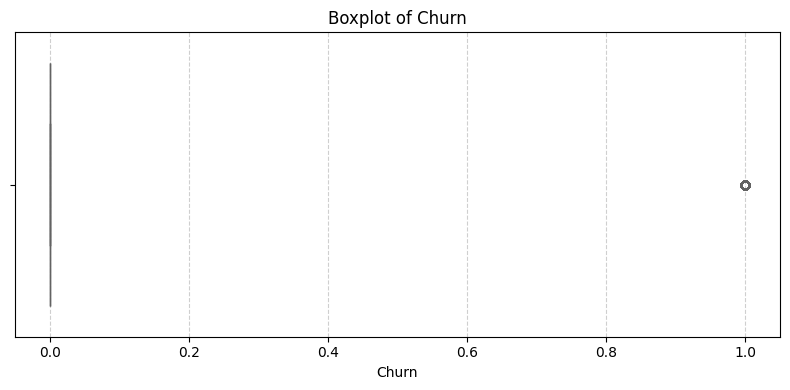

Outliers detected in Churn: 1896


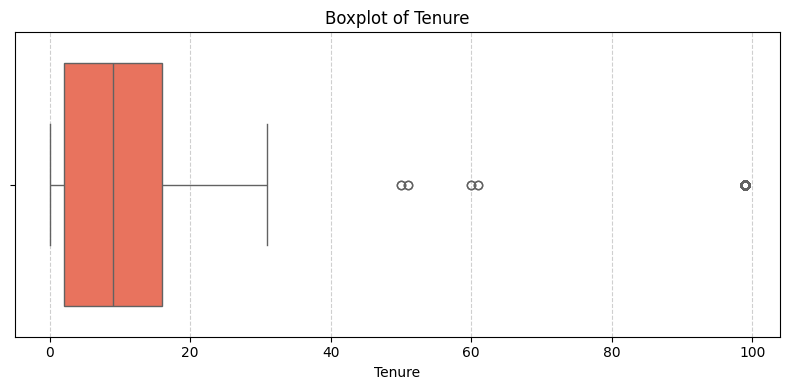

Outliers detected in Tenure: 139


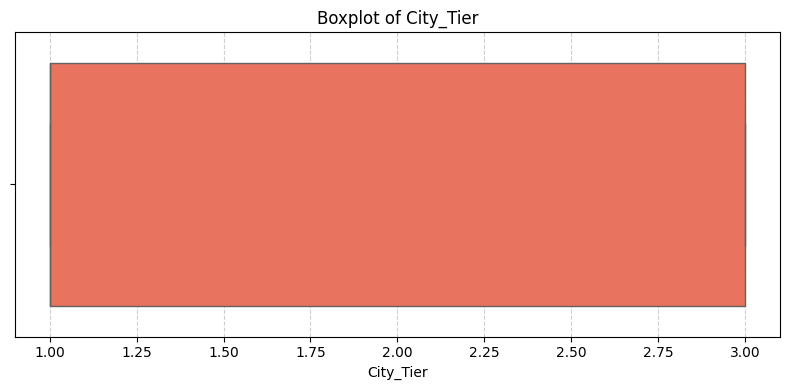

Outliers detected in City_Tier: 0


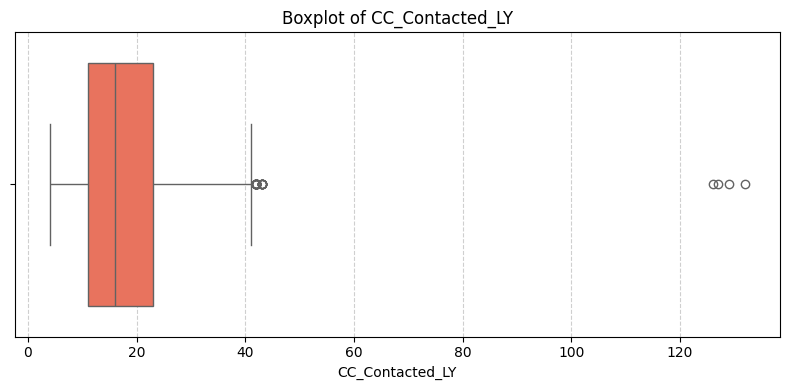

Outliers detected in CC_Contacted_LY: 42


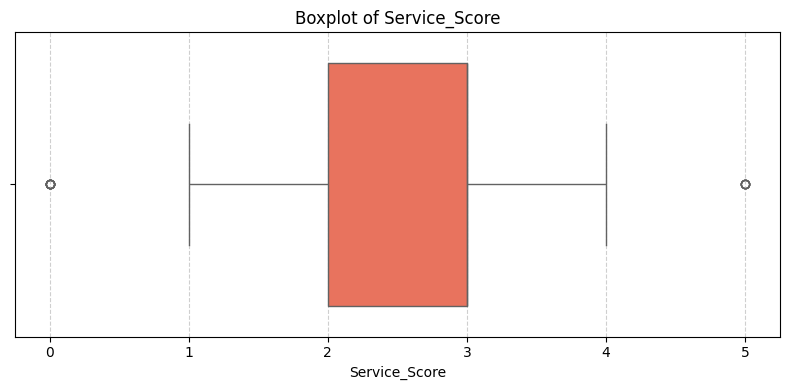

Outliers detected in Service_Score: 13


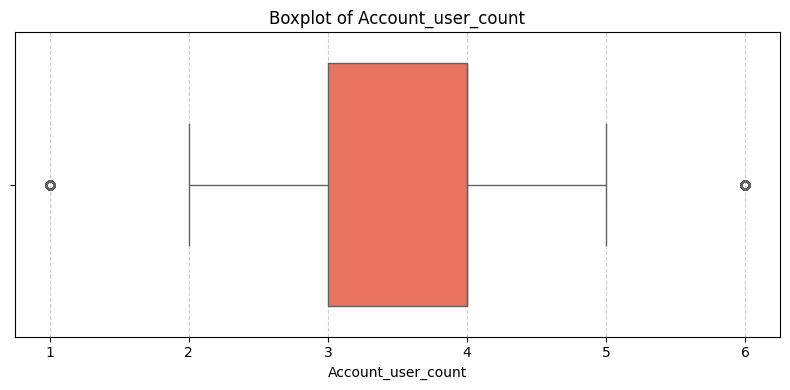

Outliers detected in Account_user_count: 761


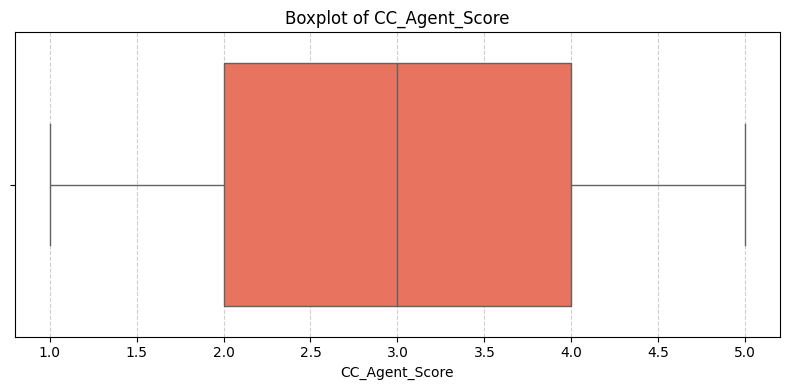

Outliers detected in CC_Agent_Score: 0


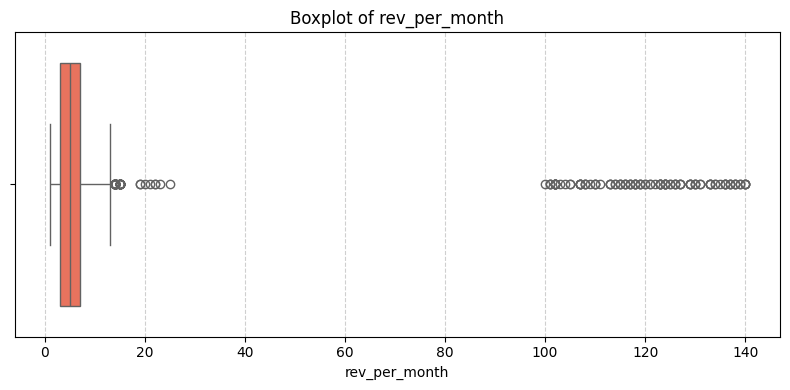

Outliers detected in rev_per_month: 185


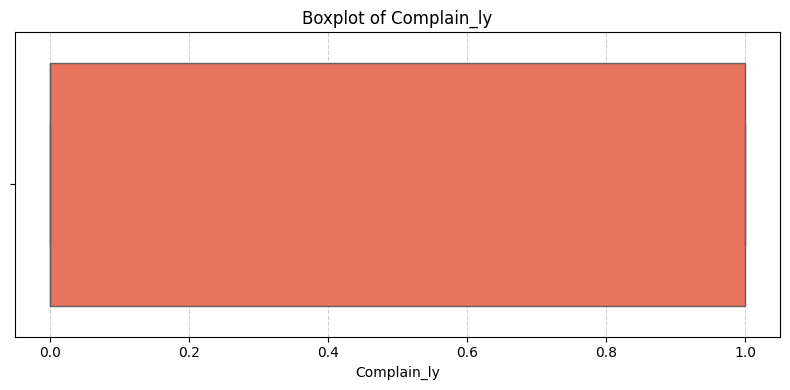

Outliers detected in Complain_ly: 0


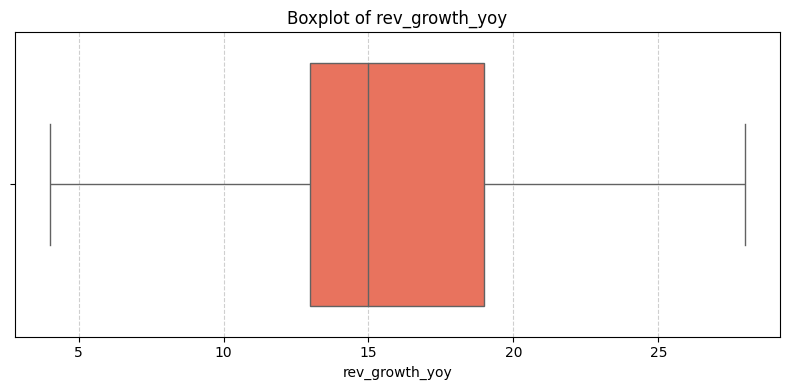

Outliers detected in rev_growth_yoy: 0


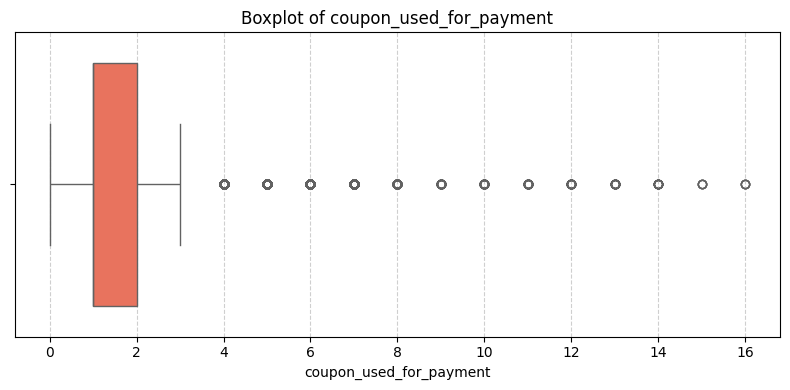

Outliers detected in coupon_used_for_payment: 1380


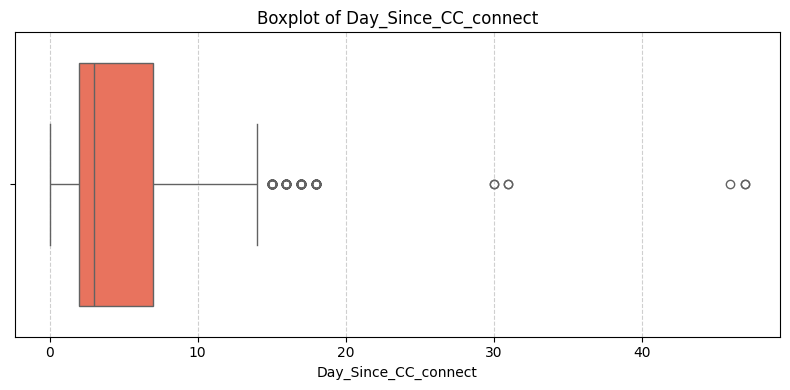

Outliers detected in Day_Since_CC_connect: 130


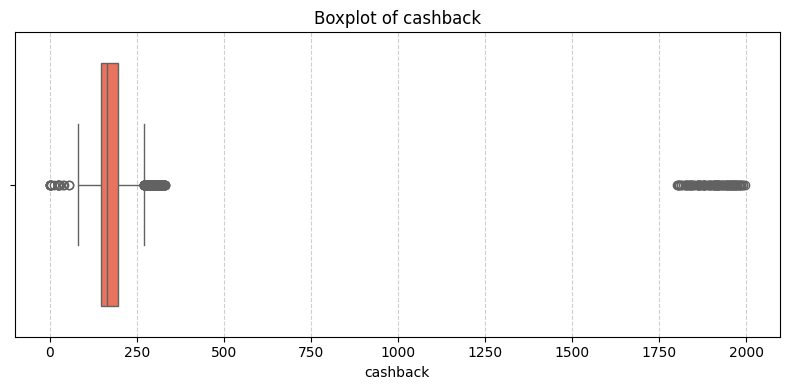

Outliers detected in cashback: 986


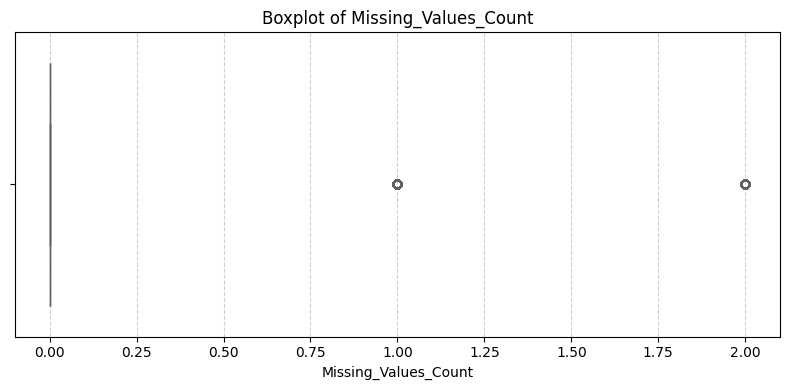

Outliers detected in Missing_Values_Count: 2555


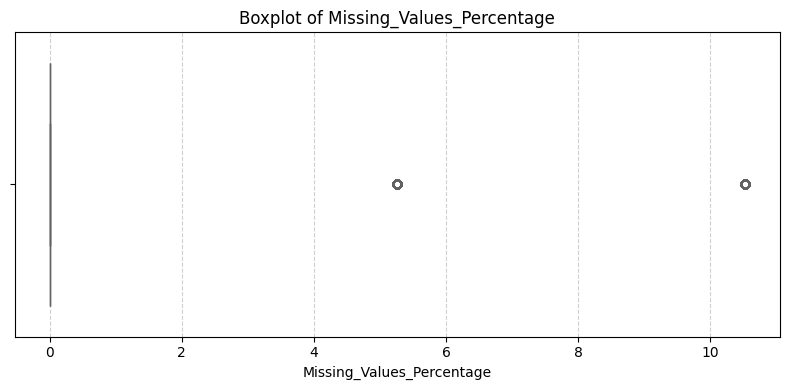

Outliers detected in Missing_Values_Percentage: 2555


In [42]:
# Detect outliers using the IQR method
def detect_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] < lower_bound) | (df[column] > upper_bound)]

def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data[(data[column] < lower_bound) | (data[column] > upper_bound)]

# Select numerical columns
num_cols = df.select_dtypes(include=['float64', 'int64']).columns

# Plot and detect
for col in num_cols:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[col], color='tomato')
    plt.title(f'Boxplot of {col}', fontsize=12)
    plt.xlabel(col)
    plt.grid(axis='x', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

    outliers = detect_outliers_iqr(df, col)
    print(f"Outliers detected in {col}: {len(outliers)}")


d) Variable transformation

Identify Incorrect Data Types

In [43]:
print(df.dtypes)

Churn                          int64
Tenure                       float64
City_Tier                    float64
CC_Contacted_LY              float64
Payment                       object
Gender                        object
Service_Score                float64
Account_user_count           float64
account_segment               object
CC_Agent_Score               float64
Marital_Status                object
rev_per_month                float64
Complain_ly                  float64
rev_growth_yoy               float64
coupon_used_for_payment      float64
Day_Since_CC_connect         float64
cashback                     float64
Login_device                  object
Missing_Values_Count           int64
Missing_Values_Percentage    float64
dtype: object


Convert Specific Numeric Columns to Object

In [44]:
# Define columns to be converted to object
object_columns = ['Churn', 'City_Tier', 'Payment', 'Gender', 'Service_Score', 
                  'account_segment', 'CC_Agent_Score', 'Marital_Status', 
                  'Complain_ly', 'Login_device']

# Convert selected columns to object (categorical)
df[object_columns] = df[object_columns].astype(str)

# Convert all remaining columns to numeric (int/float)
for col in df.columns:
    if col not in object_columns:
        df[col] = pd.to_numeric(df[col], errors='coerce')  # Convert, handling errors

# Verify the changes
print(df.dtypes)

Churn                         object
Tenure                       float64
City_Tier                     object
CC_Contacted_LY              float64
Payment                       object
Gender                        object
Service_Score                 object
Account_user_count           float64
account_segment               object
CC_Agent_Score                object
Marital_Status                object
rev_per_month                float64
Complain_ly                   object
rev_growth_yoy               float64
coupon_used_for_payment      float64
Day_Since_CC_connect         float64
cashback                     float64
Login_device                  object
Missing_Values_Count           int64
Missing_Values_Percentage    float64
dtype: object


### EDA after Data Preprocessing

Univariate Analysis (Distribution of individual variables)

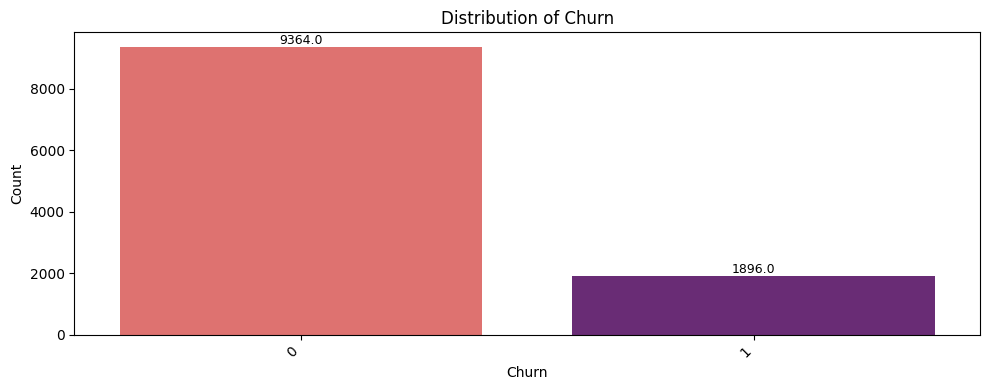

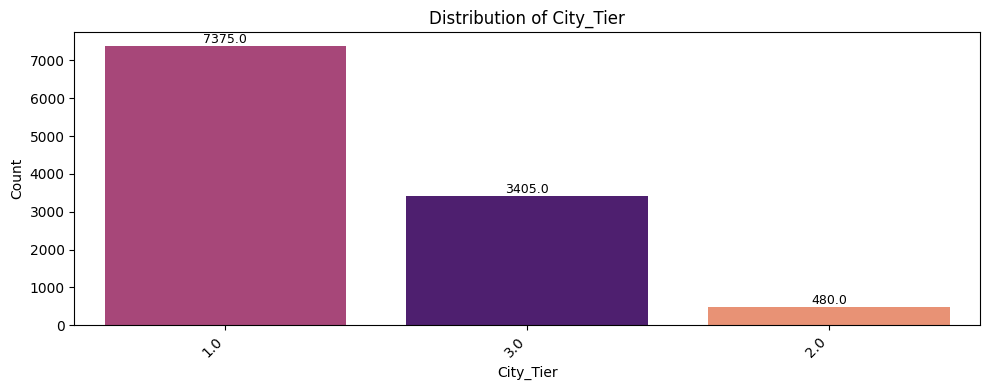

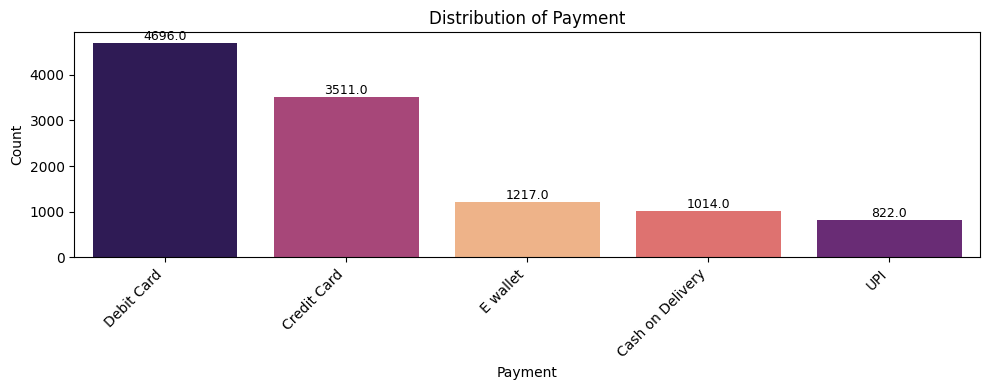

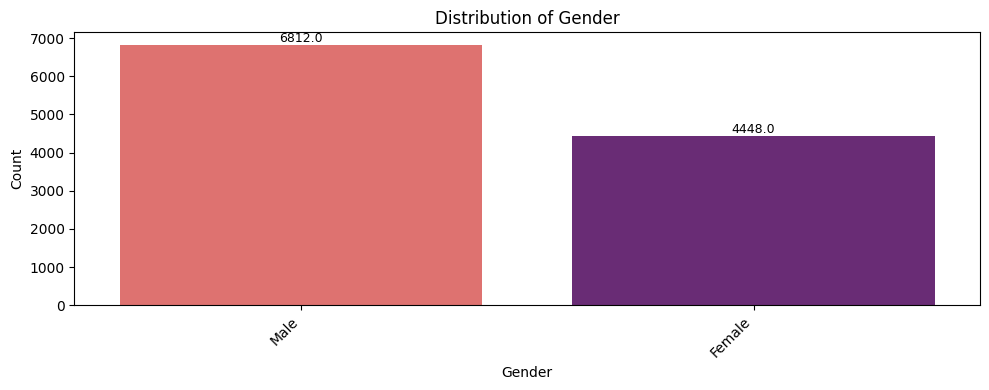

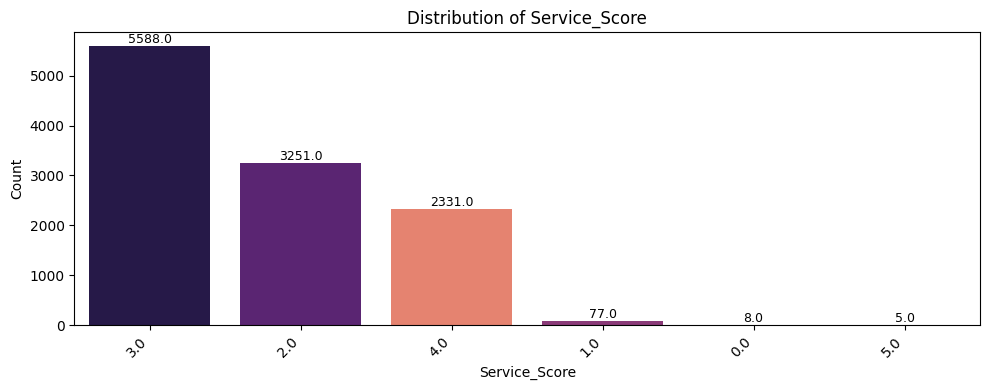

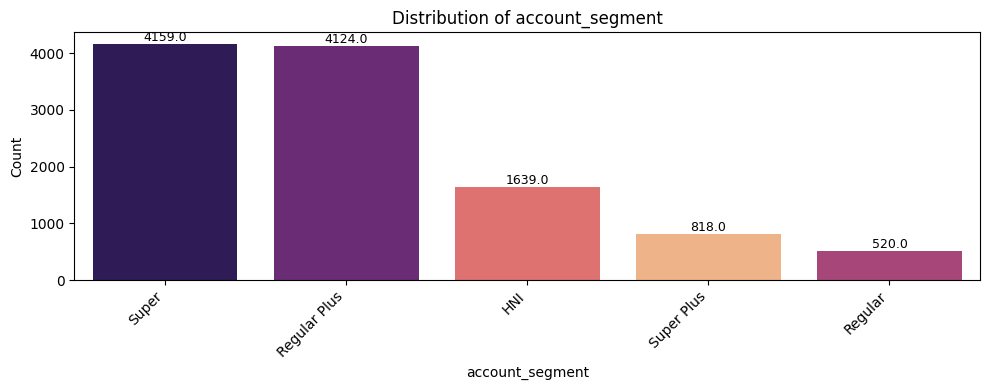

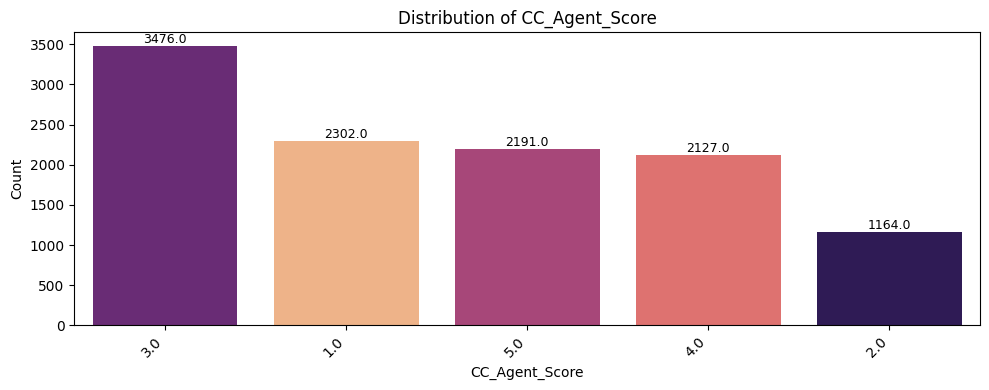

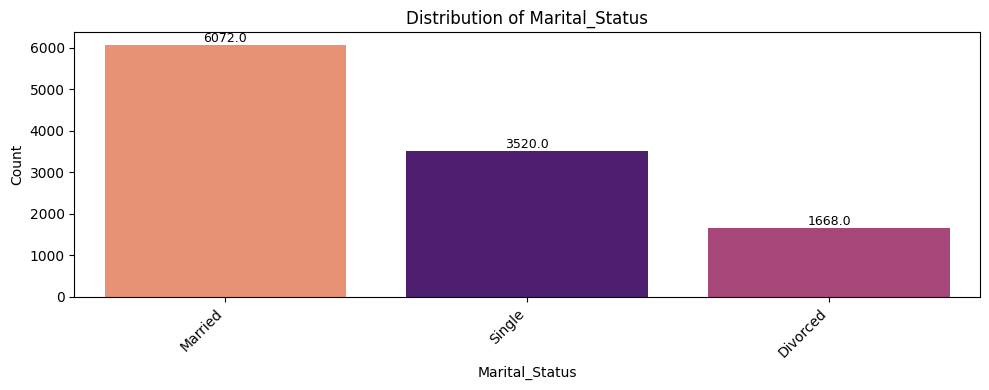

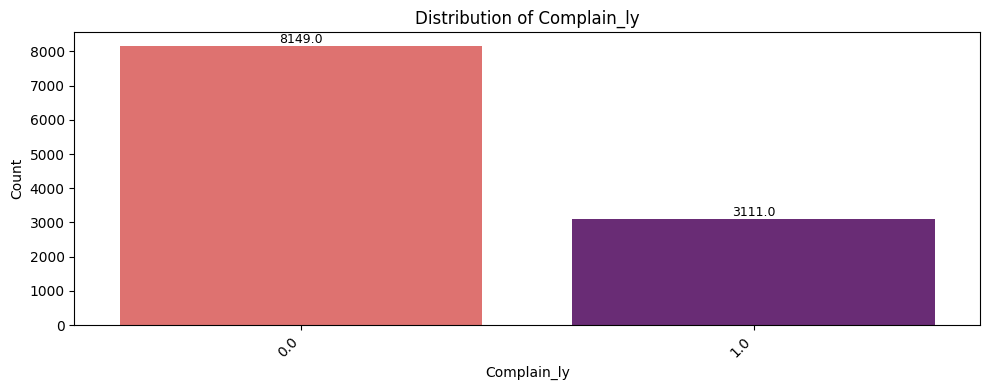

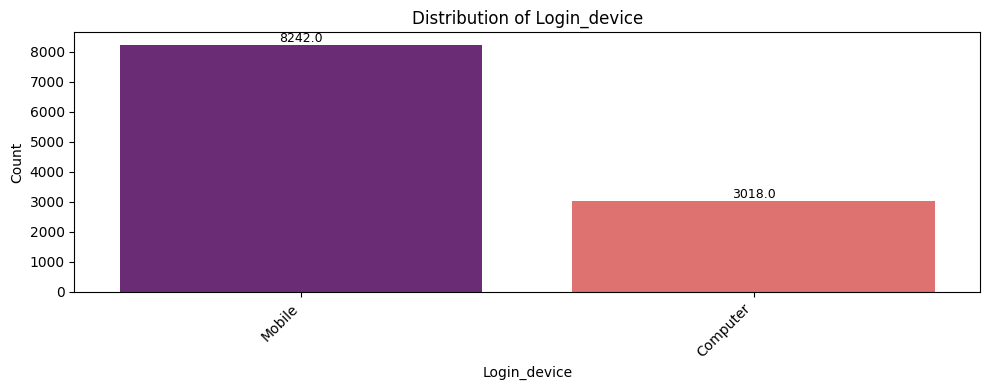

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns

# Categorical columns
cat_cols = df.select_dtypes(include=['object', 'category']).columns

for col in cat_cols:
    plt.figure(figsize=(10, 4))
    ax = sns.countplot(x=df[col],hue=df[col], palette="magma", order=df[col].value_counts().index, legend=False)

    # Add value labels
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height}', 
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom', fontsize=9)

    plt.title(f"Distribution of {col}", fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()


Bivariate Analysis (Feature relationships with Churn)

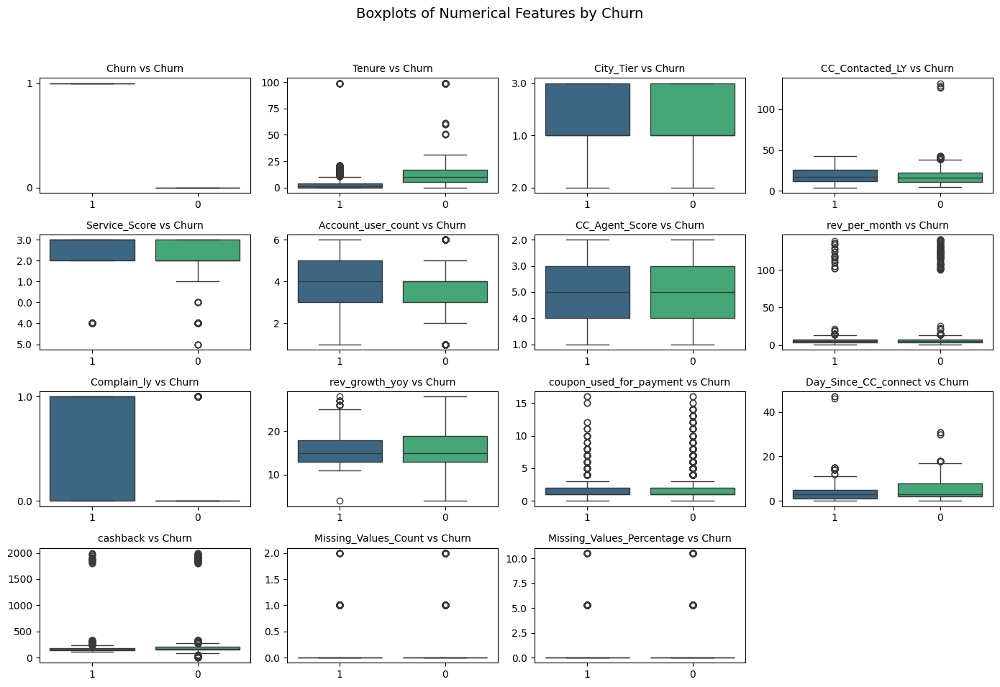

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14, 10))
for i, col in enumerate(num_cols, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(x='Churn', y=col, data=df,hue='Churn',legend=False, palette="viridis")
    plt.title(f"{col} vs Churn", fontsize=10)
    plt.xlabel('')
    plt.ylabel('')
    plt.xticks(rotation=0)

plt.suptitle("Boxplots of Numerical Features by Churn", fontsize=14)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


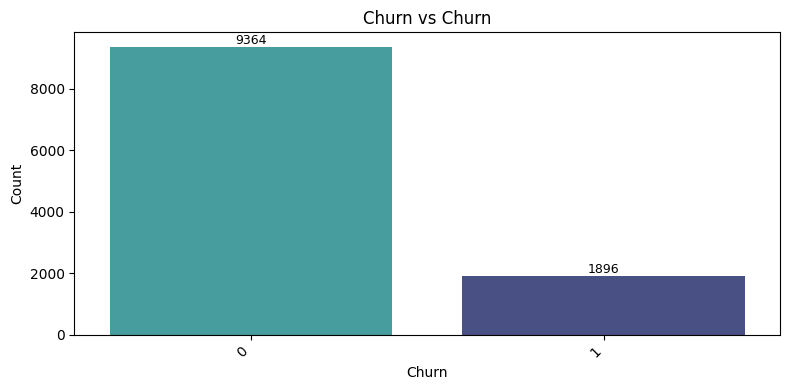

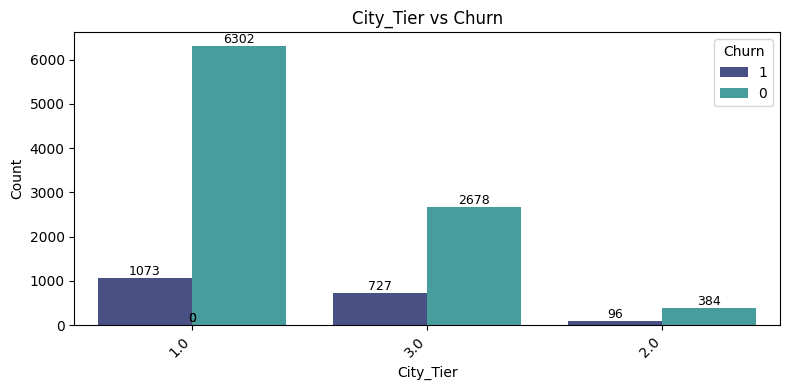

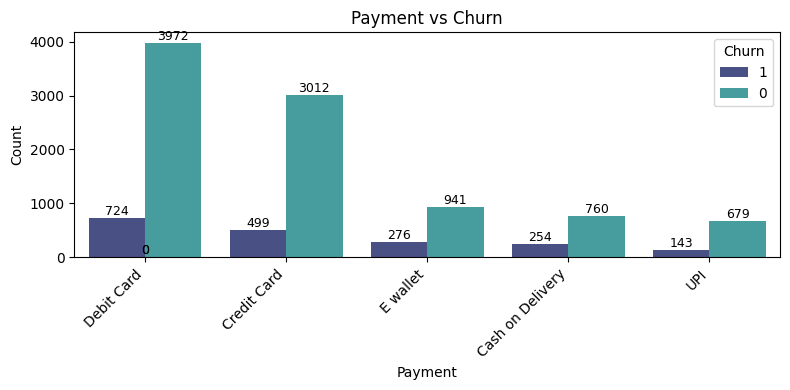

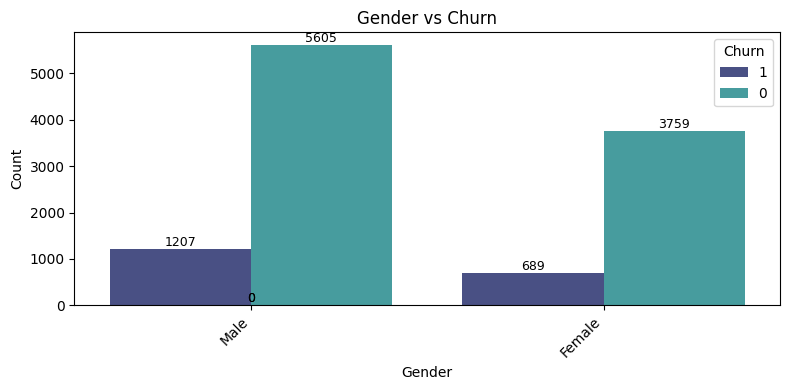

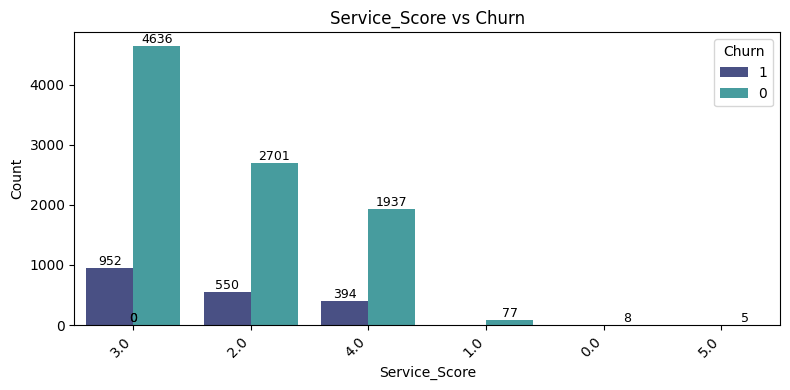

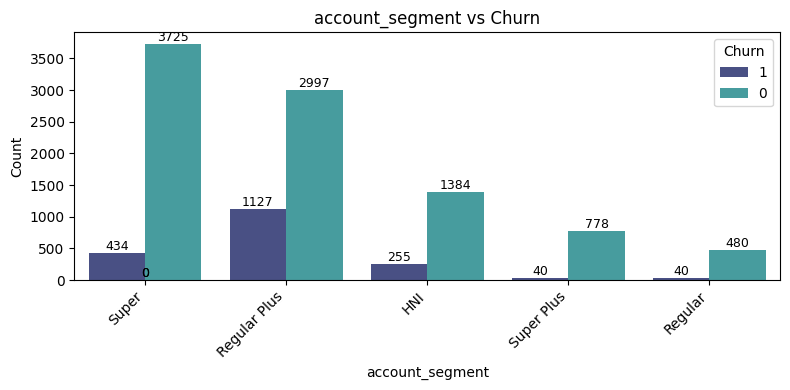

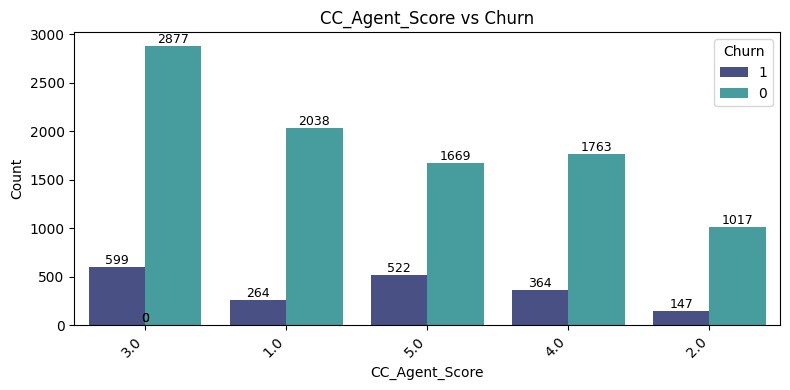

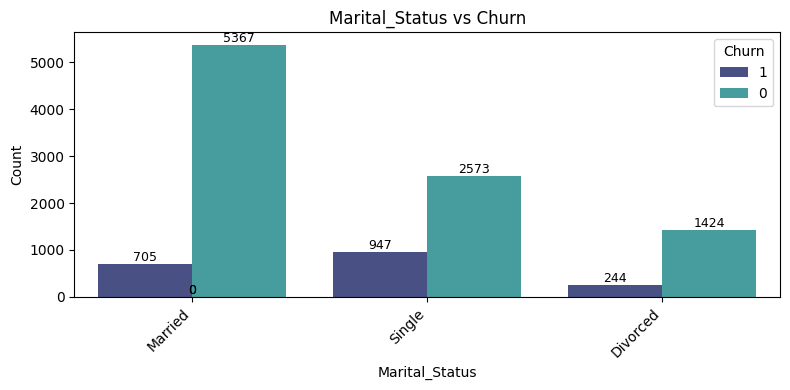

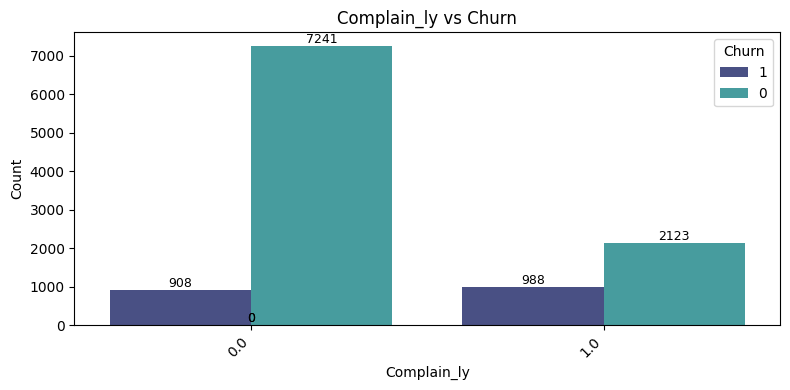

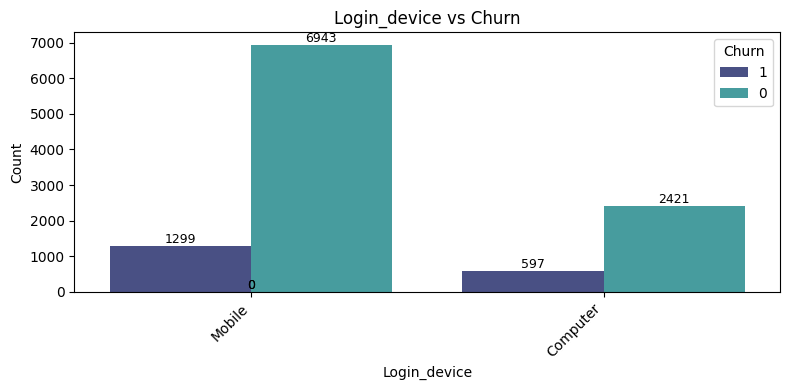

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns

for col in cat_cols:
    plt.figure(figsize=(8, 4))
    ax = sns.countplot(x=df[col], hue=df['Churn'], palette="mako", order=df[col].value_counts().index)

    # Add value labels on top of each bar
    for p in ax.patches:
        count = int(p.get_height())
        ax.annotate(str(count),
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=9)

    plt.title(f"{col} vs Churn", fontsize=12)
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


### 4.Business insights from EDA

In [48]:
# Check the distribution of the target variable
churn_counts = df['Churn'].value_counts()
churn_percentage = (churn_counts / len(df)) * 100

print("Churn Distribution:\n", churn_counts)
print("\nChurn Percentage:\n", churn_percentage)

Churn Distribution:
 Churn
0    9364
1    1896
Name: count, dtype: int64

Churn Percentage:
 Churn
0    83.161634
1    16.838366
Name: count, dtype: float64


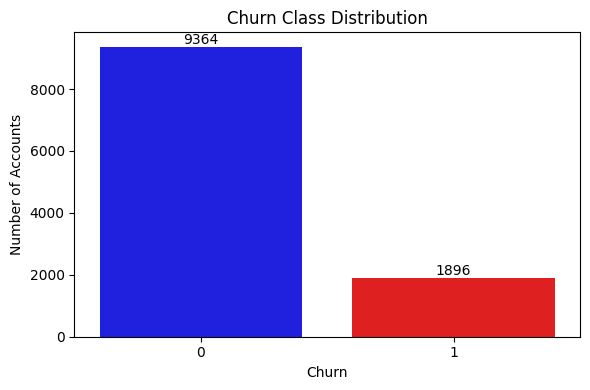

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming churn_counts is defined like:
# churn_counts = df['Churn'].value_counts()

plt.figure(figsize=(6, 4))
ax = sns.barplot(x=churn_counts.index, y=churn_counts.values,hue=churn_counts.index,legend=False, palette=['blue', 'red'])

# Add value labels on top of bars
for i, val in enumerate(churn_counts.values):
    ax.text(i, val + 1, str(val), ha='center', va='bottom', fontsize=10)

plt.xlabel("Churn")
plt.ylabel("Number of Accounts")
plt.title("Churn Class Distribution")
plt.tight_layout()
plt.show()


In [50]:
import scipy.stats as stats

num_cols = [
    'Tenure', 'cashback', 'Day_Since_CC_connect',
 'rev_growth_yoy','CC_Contacted_LY', 'rev_per_month','coupon_used_for_payment'
]

for col in num_cols:
    churn_groups = [df[df['Churn'] == val][col].dropna() for val in df['Churn'].unique()]
    
    if all(len(group) > 0 for group in churn_groups):  # Ensure no empty group
        f_stat, p_val = stats.f_oneway(*churn_groups)
        print(f"ANOVA for {col} vs Churn --> F = {f_stat:.2f}, p = {p_val:.4f}")
        if p_val < 0.05:
            print(f"Significant difference in means — {col} could be an important feature.\n")
        else:
            print(f"No significant difference — {col} may not help separate churn.\n")


ANOVA for Tenure vs Churn --> F = 632.81, p = 0.0000
Significant difference in means — Tenure could be an important feature.

ANOVA for cashback vs Churn --> F = 11.44, p = 0.0007
Significant difference in means — cashback could be an important feature.

ANOVA for Day_Since_CC_connect vs Churn --> F = 243.19, p = 0.0000
Significant difference in means — Day_Since_CC_connect could be an important feature.

ANOVA for rev_growth_yoy vs Churn --> F = 2.16, p = 0.1420
No significant difference — rev_growth_yoy may not help separate churn.

ANOVA for CC_Contacted_LY vs Churn --> F = 58.14, p = 0.0000
Significant difference in means — CC_Contacted_LY could be an important feature.

ANOVA for rev_per_month vs Churn --> F = 5.51, p = 0.0189
Significant difference in means — rev_per_month could be an important feature.

ANOVA for coupon_used_for_payment vs Churn --> F = 2.46, p = 0.1169
No significant difference — coupon_used_for_payment may not help separate churn.



Chi-Square Test for Gender vs Churn:
Chi2 = 9.39, p-value = 0.0022
 Significant association with churn.



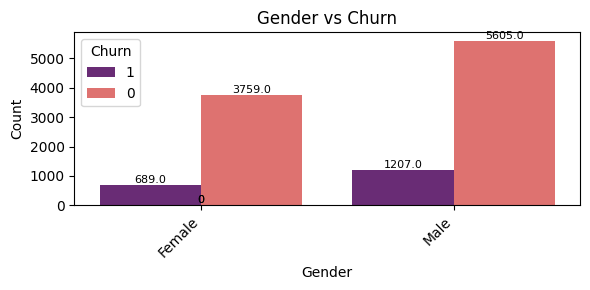

Chi-Square Test for Marital_Status vs Churn:
Chi2 = 378.98, p-value = 0.0000
 Significant association with churn.



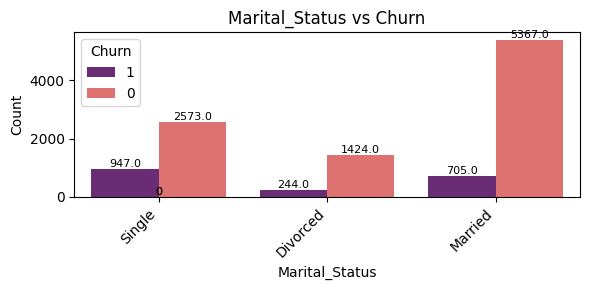

Chi-Square Test for Login_device vs Churn:
Chi2 = 25.22, p-value = 0.0000
 Significant association with churn.



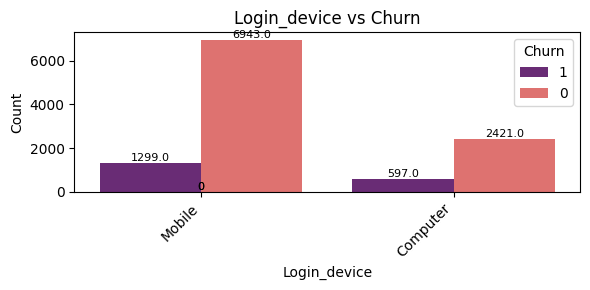

Chi-Square Test for City_Tier vs Churn:
Chi2 = 80.54, p-value = 0.0000
 Significant association with churn.



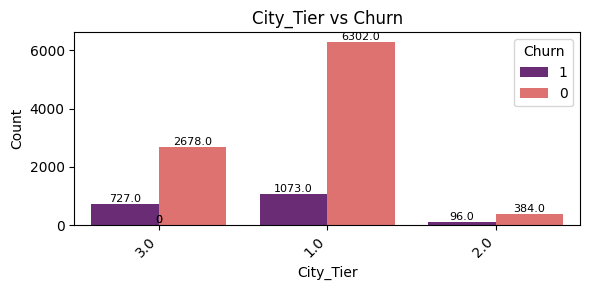

Chi-Square Test for Account_user_count vs Churn:
Chi2 = 155.98, p-value = 0.0000
 Significant association with churn.



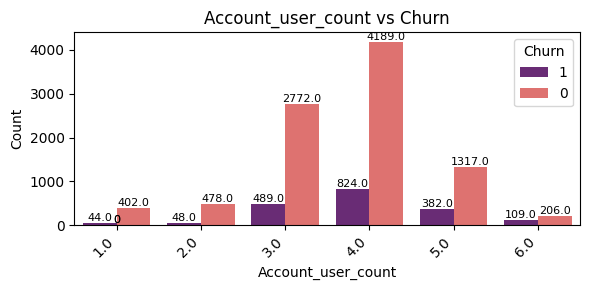

Chi-Square Test for Payment vs Churn:
Chi2 = 102.71, p-value = 0.0000
 Significant association with churn.



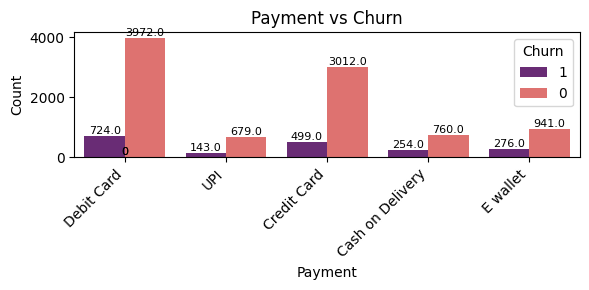

Chi-Square Test for Service_Score vs Churn:
Chi2 = 18.40, p-value = 0.0025
 Significant association with churn.



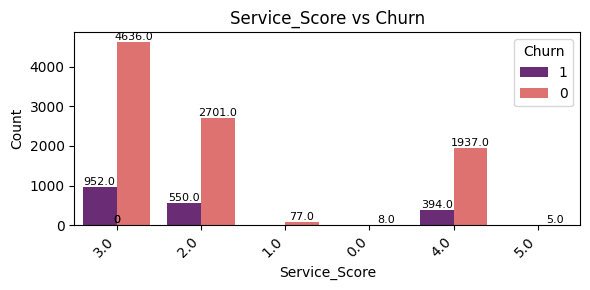

Chi-Square Test for account_segment vs Churn:
Chi2 = 562.20, p-value = 0.0000
 Significant association with churn.



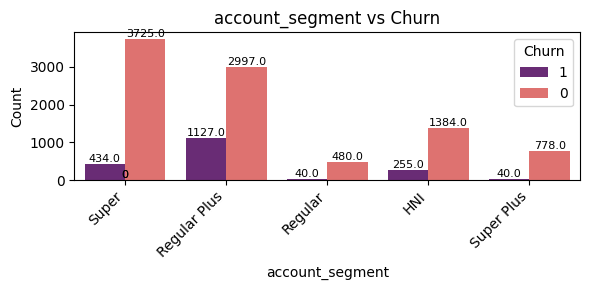

Chi-Square Test for Complain_ly vs Churn:
Chi2 = 681.88, p-value = 0.0000
 Significant association with churn.



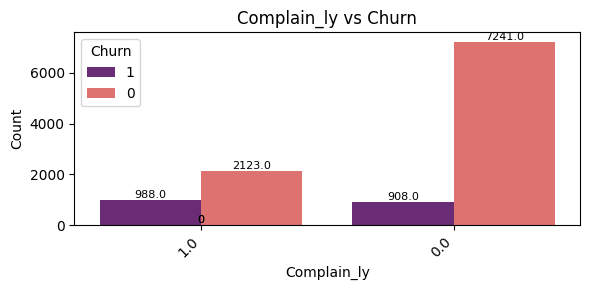

In [51]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

cat_cols = ['Gender', 'Marital_Status', 'Login_device', 'City_Tier', 'Account_user_count',
            'Payment', 'Service_Score', 'account_segment', 'Complain_ly']

for col in cat_cols:
    # Chi-square test
    contingency_table = pd.crosstab(df[col], df['Churn'])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    print(f"Chi-Square Test for {col} vs Churn:")
    print(f"Chi2 = {chi2:.2f}, p-value = {p:.4f}")
    if p < 0.05:
        print(f" Significant association with churn.\n")
    else:
        print(f" No significant association with churn.\n")
    
    # Countplot with value labels
    plt.figure(figsize=(6, 3))
    ax = sns.countplot(x=col, hue='Churn', data=df, palette='magma')
    plt.title(f'{col} vs Churn')
    plt.xticks(rotation=45, ha='right')
    plt.xlabel(col)
    plt.ylabel('Count')

    # Add bar labels
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height}', 
                    (p.get_x() + p.get_width() / 2., height), 
                    ha='center', va='bottom', fontsize=8)

    plt.tight_layout()
    plt.show()

*Encode Categorical Features*

In [52]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

ordinal_cols = ['Service_Score']
label_enc = LabelEncoder()

for col in ordinal_cols:
    df[col] = label_enc.fit_transform(df[col])


nominal_cols = ['Gender', 'Marital_Status', 'Login_device', 'City_Tier',
                'Payment', 'account_segment']

# This will create binary columns for each category
df = pd.get_dummies(df, columns=nominal_cols, drop_first=True)

# Final Step: Check your encoded data

print(df.head())
print(f"Final shape of dataset after encoding: {df.shape}")

  Churn  Tenure  CC_Contacted_LY  Service_Score  Account_user_count  \
0     1     4.0              6.0              3                 3.0   
1     1     0.0              8.0              3                 4.0   
2     1     0.0             30.0              2                 4.0   
3     1     0.0             15.0              2                 4.0   
4     1     0.0             12.0              2                 3.0   

  CC_Agent_Score  rev_per_month Complain_ly  rev_growth_yoy  \
0            2.0            9.0         1.0            11.0   
1            3.0            7.0         1.0            15.0   
2            3.0            6.0         1.0            14.0   
3            5.0            8.0         0.0            23.0   
4            5.0            3.0         0.0            11.0   

   coupon_used_for_payment  ...  City_Tier_2.0  City_Tier_3.0  \
0                      1.0  ...          False           True   
1                      0.0  ...          False          False   

*Balance the Target Variable*

In [53]:
# Define selected numerical features based on ANOVA results
selected_features = ['Tenure', 'cashback', 'Day_Since_CC_connect', 'CC_Contacted_LY', 'rev_per_month']

# Update feature set
X = df[selected_features]  # Keeping only significant features
y = df['Churn']  # Target variable

Combine with Categorical Features
Now, include important categorical features from Chi-Square Testing (previous step).

Keep the Categorical Features (p < 0.05, significant association with churn)

In [54]:
# Identify all categorical columns after encoding
encoded_categorical_features = [col for col in df.columns if any(cat in col for cat in nominal_cols)]

# Define final features: Numerical + Encoded Categorical
final_features = selected_features + encoded_categorical_features

# Select only these features
X = df[final_features]
y = df['Churn']  # Target variable

In [55]:
!pip install kmodes

Defaulting to user installation because normal site-packages is not writeable


In [56]:
# Convert numerical columns to numeric types
df[selected_features] = df[selected_features].apply(pd.to_numeric, errors='coerce')

# Convert encoded categorical columns to string (important for K-Prototypes)
df[encoded_categorical_features] = df[encoded_categorical_features].astype(str)

# Extract feature matrix
X = df[final_features].values  # Convert dataframe to NumPy array

# Identify categorical feature indices (position of categorical columns in X)
categorical_indices = list(range(len(selected_features), len(final_features)))  
from kmodes.kprototypes import KPrototypes

# Define the model (set n_clusters based on business understanding)
kproto = KPrototypes(n_clusters=3, random_state=42)

# Fit and predict clusters
clusters = kproto.fit_predict(X, categorical=categorical_indices)

# Assign cluster labels to the DataFrame
df['Cluster'] = clusters

# Analyze cluster distributions
print(df.groupby('Cluster')['Churn'].mean().reset_index())  # Check churn rates per cluster
print(df.groupby('Cluster').mean(numeric_only=True))  # Check average feature values per cluster


   Cluster                                              Churn
0        0                                                inf
1        1  9260186111111110701291333545837316915058030090...
2        2                                                inf
            Tenure  CC_Contacted_LY  Service_Score  Account_user_count  \
Cluster                                                                  
0         9.311324        17.798575       2.883643            3.669747   
1        10.296296        17.898148       2.916667            3.703704   
2        17.947490        18.061262       2.984339            3.850760   

         rev_per_month  rev_growth_yoy  coupon_used_for_payment  \
Cluster                                                           
0             6.074157       16.175036                 1.575882   
1             5.314815       16.009259                 1.722222   
2             7.111469       16.276831                 2.681253   

         Day_Since_CC_connect     cashback  M

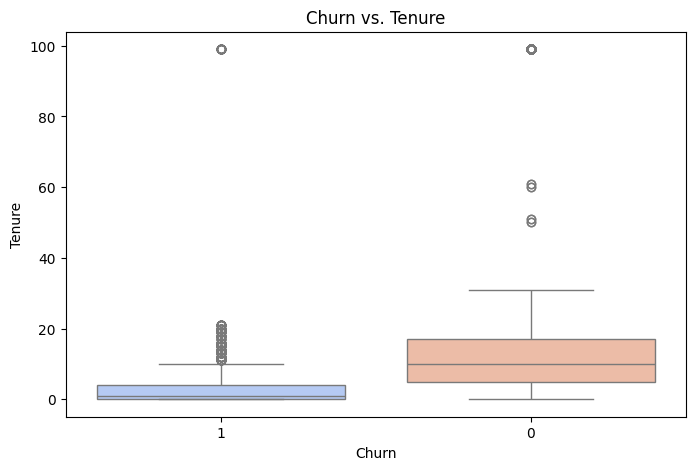

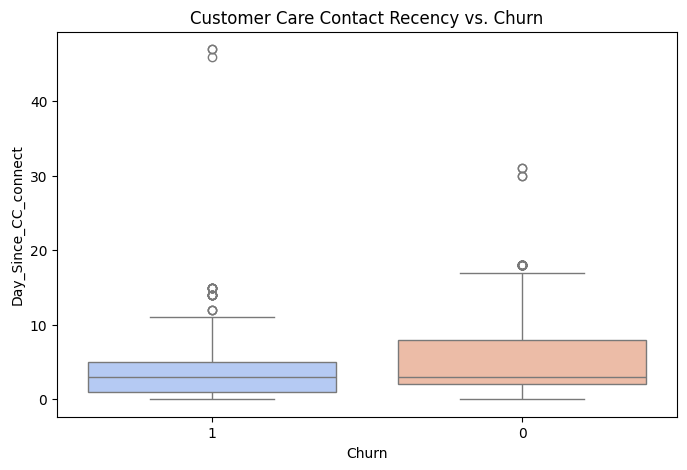

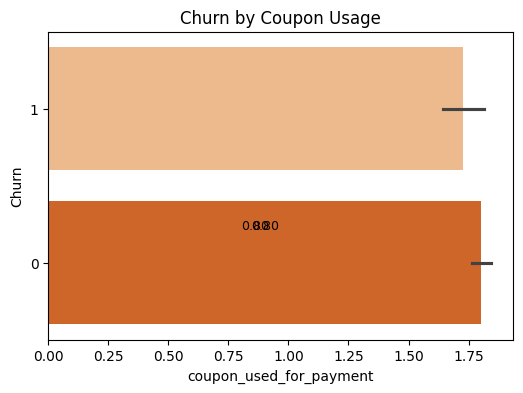

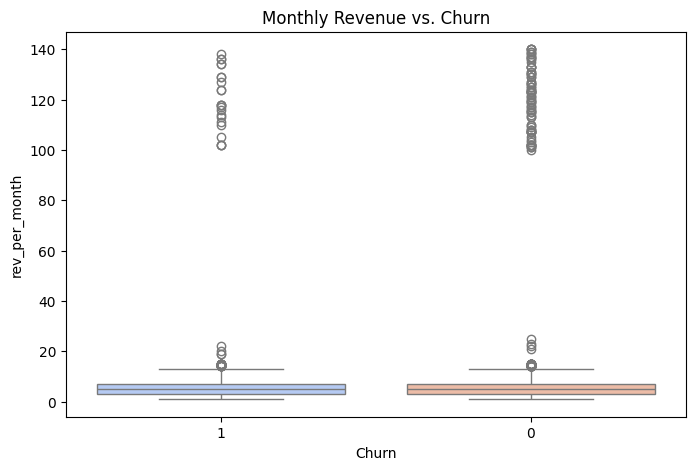

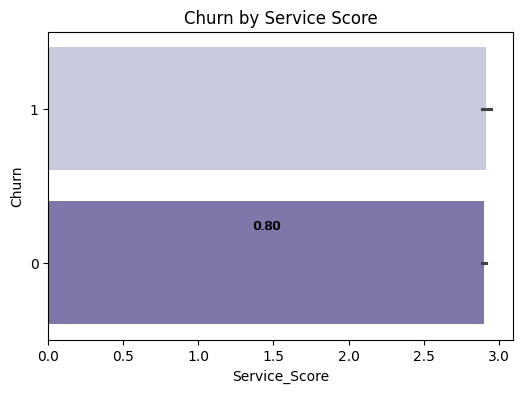

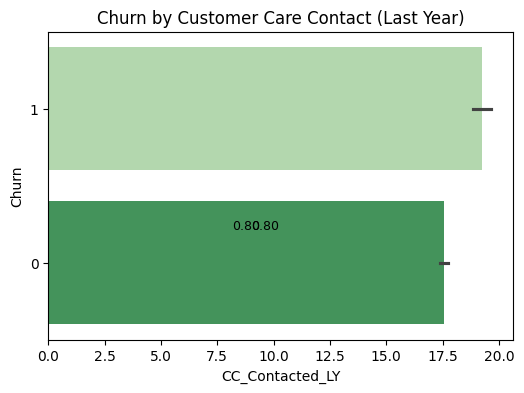

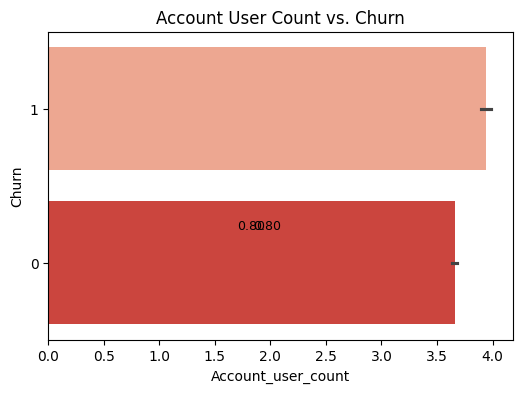

In [57]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df.columns = df.columns.str.strip()  # Clean column names

# Boxplot: Churn vs Tenure
plt.figure(figsize=(8, 5))
sns.boxplot(data=df.dropna(subset=['Tenure']), x='Churn', y='Tenure', hue='Churn', palette="coolwarm", legend=False)
plt.title("Churn vs. Tenure")
plt.show()

# Boxplot: Customer Care Contact Recency
plt.figure(figsize=(8, 5))
sns.boxplot(data=df.dropna(subset=['Day_Since_CC_connect']), x='Churn', y='Day_Since_CC_connect', hue='Churn', palette="coolwarm", legend=False)
plt.title("Customer Care Contact Recency vs. Churn")
plt.show()

# Barplot: Churn by Coupon Usage (mean)
plt.figure(figsize=(6, 4))
ax = sns.barplot(data=df.dropna(subset=['coupon_used_for_payment']), x='coupon_used_for_payment', y='Churn', 
                 estimator=np.mean, palette="Oranges", legend=False)

# Add bar labels
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.2f}', 
                (p.get_x() + p.get_width() / 2., height), 
                ha='center', va='bottom', fontsize=9)

plt.title("Churn by Coupon Usage")
plt.show()

# Boxplot: Revenue per Month
plt.figure(figsize=(8, 5))
sns.boxplot(data=df.dropna(subset=['rev_per_month']), x='Churn', y='rev_per_month', hue='Churn', palette="coolwarm", legend=False)
plt.title("Monthly Revenue vs. Churn")
plt.show()

# Barplot: Churn by Service Score
plt.figure(figsize=(6, 4))
ax = sns.barplot(data=df.dropna(subset=['Service_Score']), x='Service_Score', y='Churn', 
                 estimator=np.mean, palette="Purples", legend=False)

for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.2f}', 
                (p.get_x() + p.get_width() / 2., height), 
                ha='center', va='bottom', fontsize=9)

plt.title("Churn by Service Score")
plt.show()

# Barplot: Churn by Customer Care Contact Last Year
plt.figure(figsize=(6, 4))
ax = sns.barplot(data=df.dropna(subset=['CC_Contacted_LY']), x='CC_Contacted_LY', y='Churn', 
                 estimator=np.mean, palette="Greens", legend=False)

for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.2f}', 
                (p.get_x() + p.get_width() / 2., height), 
                ha='center', va='bottom', fontsize=9)

plt.title("Churn by Customer Care Contact (Last Year)")
plt.show()

# Barplot: Account User Count vs Churn
plt.figure(figsize=(6, 4))
ax = sns.barplot(data=df.dropna(subset=['Account_user_count']), x='Account_user_count', y='Churn', 
                 estimator=np.mean, palette="Reds", legend=False)

for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.2f}', 
                (p.get_x() + p.get_width() / 2., height), 
                ha='center', va='bottom', fontsize=9)

plt.title("Account User Count vs. Churn")
plt.show()


# Separate Features and Target

In [58]:
# Assuming 'Churn' is the target
X = df.drop('Churn', axis=1)
y = df['Churn']

# Feature Scaling

In [59]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Check for non-numeric columns
print(X.dtypes)

# Convert binary (True/False, Yes/No) columns to numeric (0/1)
for col in X.columns:
    if X[col].dtype == 'object':  # Check if column is non-numeric
        if set(X[col].unique()) == {'True', 'False'}:  # If only True/False values
            X[col] = X[col].map({'False': 0, 'True': 1})
        elif set(X[col].unique()).issubset({'Yes', 'No'}):  # If only Yes/No
            X[col] = X[col].map({'No': 0, 'Yes': 1})

# Optionally, encode categorical variables with more than 2 categories (e.g., City, Gender)
# For OneHotEncoding
categorical_columns = X.select_dtypes(include=['object']).columns
encoder = OneHotEncoder(drop='first', sparse_output=False)  # drop first to avoid dummy variable trap

# Apply OneHotEncoder to categorical columns
for col in categorical_columns:
    if len(X[col].unique()) > 2:  # Apply OneHotEncoding only to columns with more than 2 categories
        encoded_cols = encoder.fit_transform(X[[col]])
        encoded_df = pd.DataFrame(encoded_cols, columns=encoder.get_feature_names_out([col]))
        X = X.drop([col], axis=1)  # Drop original column
        X = pd.concat([X, encoded_df], axis=1)  # Add encoded columns back to dataframe

# Now, scale the data (numeric columns)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Check the result
print("Scaled Data:")
print(X_scaled[:5])  # Preview first 5 rows of scaled data


Tenure                          float64
CC_Contacted_LY                 float64
Service_Score                     int32
Account_user_count              float64
CC_Agent_Score                   object
rev_per_month                   float64
Complain_ly                      object
rev_growth_yoy                  float64
coupon_used_for_payment         float64
Day_Since_CC_connect            float64
cashback                        float64
Missing_Values_Count              int64
Missing_Values_Percentage       float64
Gender_Male                      object
Marital_Status_Married           object
Marital_Status_Single            object
Login_device_Mobile              object
City_Tier_2.0                    object
City_Tier_3.0                    object
Payment_Credit Card              object
Payment_Debit Card               object
Payment_E wallet                 object
Payment_UPI                      object
account_segment_Regular          object
account_segment_Regular Plus     object


# Train-Test Split

In [60]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2, 
                                                    random_state=42, 
                                                    stratify=y)

# For scaled features (for scaling-sensitive models)
X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = train_test_split(X_scaled, y, 
                                                    test_size=0.2, 
                                                    random_state=42, 
                                                    stratify=y)


# Apply SMOTE on Training Data

In [61]:
from imblearn.over_sampling import SMOTE

# Apply SMOTE on Original Data (For Tree Models)

In [62]:
# Initialize SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

print("After SMOTE - Original Data")
print("X shape:", X_train_smote.shape)
print("y distribution:\n", pd.Series(y_train_smote).value_counts())


After SMOTE - Original Data
X shape: (14982, 31)
y distribution:
 Churn
0    7491
1    7491
Name: count, dtype: int64


# Apply SMOTE on Scaled Data (For Logistic, KNN, SVM)

In [63]:
# Apply SMOTE
X_train_scaled_smote, y_train_scaled_smote = smote.fit_resample(X_train_scaled, y_train_scaled)

print("After SMOTE - Scaled Data")
print("X shape:", X_train_scaled_smote.shape)
print("y distribution:\n", pd.Series(y_train_scaled_smote).value_counts())


After SMOTE - Scaled Data
X shape: (14982, 31)
y distribution:
 Churn
0    7491
1    7491
Name: count, dtype: int64


# Model Building


Logistic Regression Results:


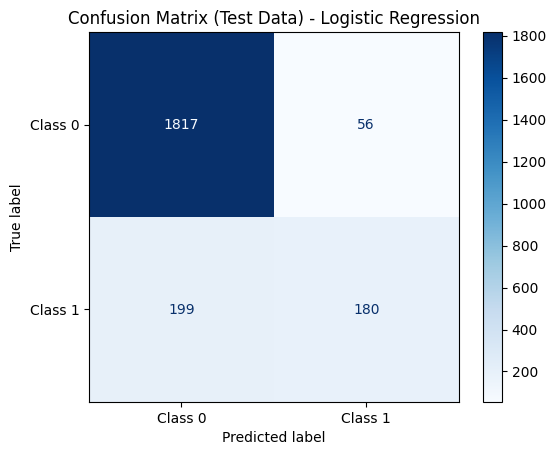

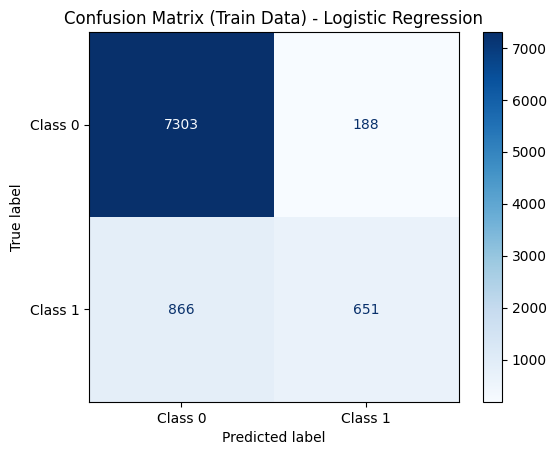

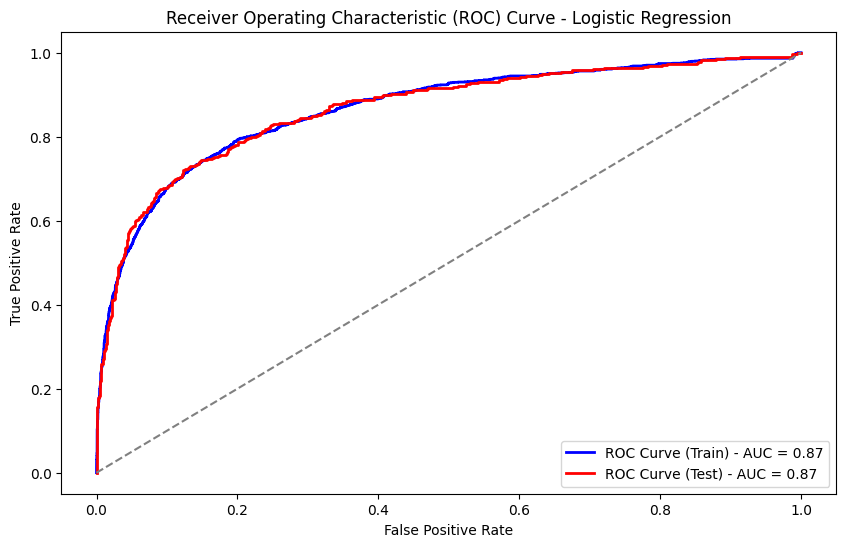


KNN Results:


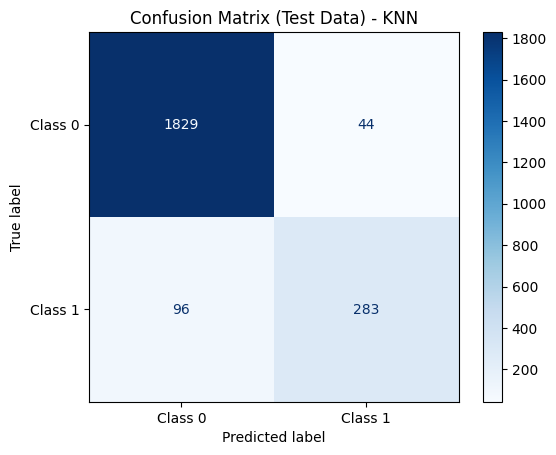

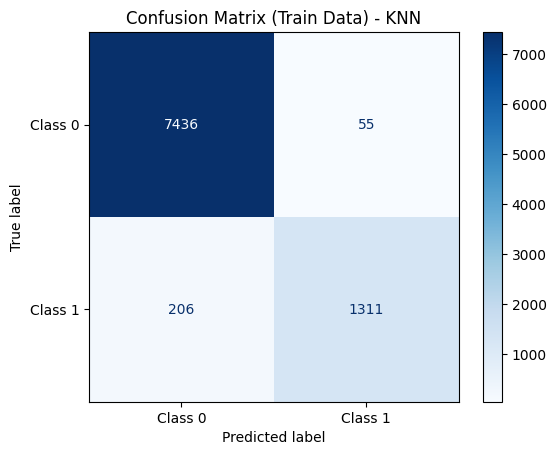

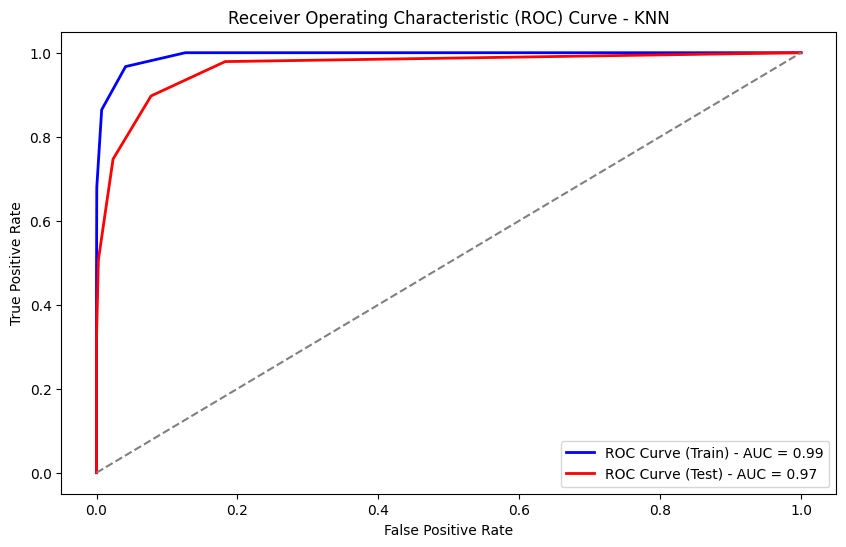


SVM Results:


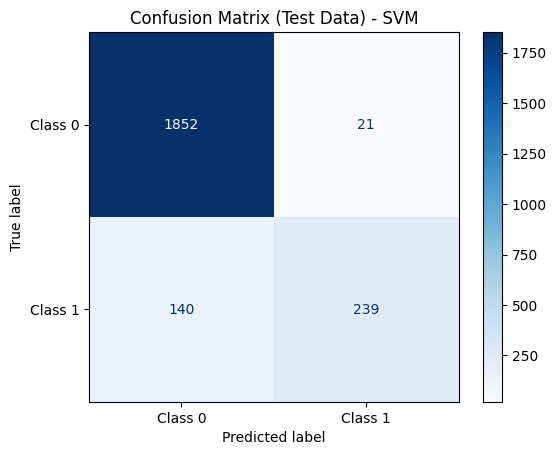

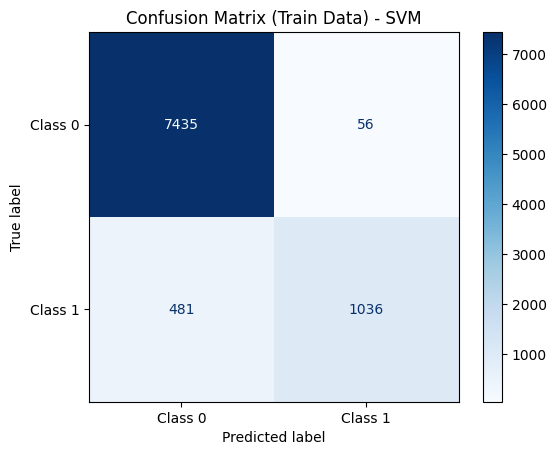

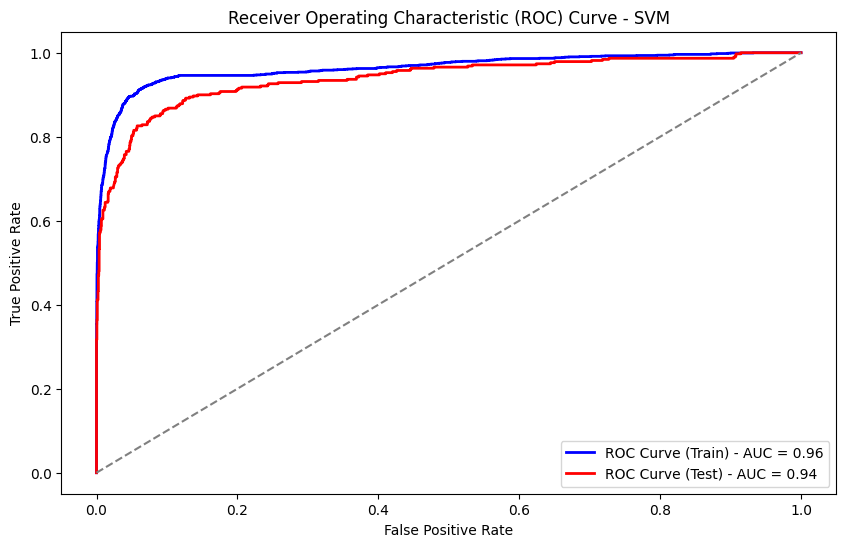


Decision Tree Results:


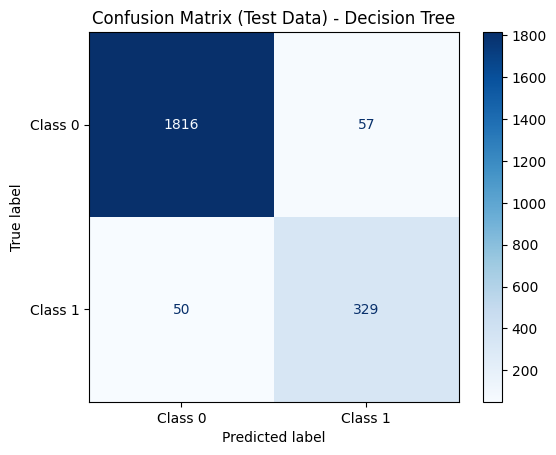

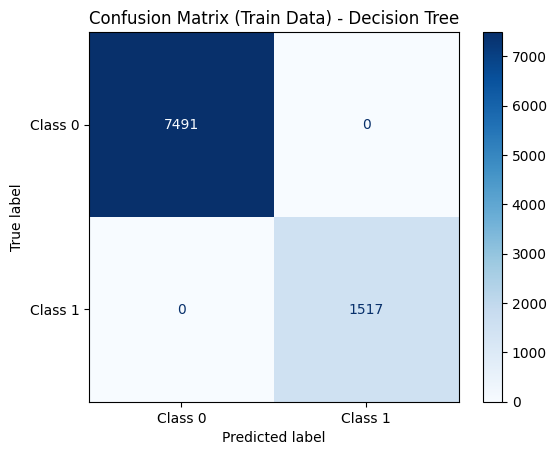

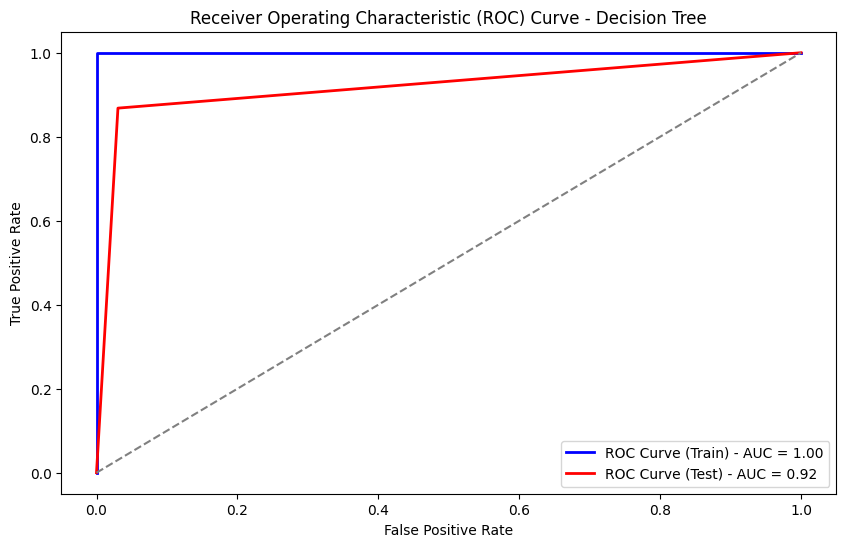


Random Forest Results:


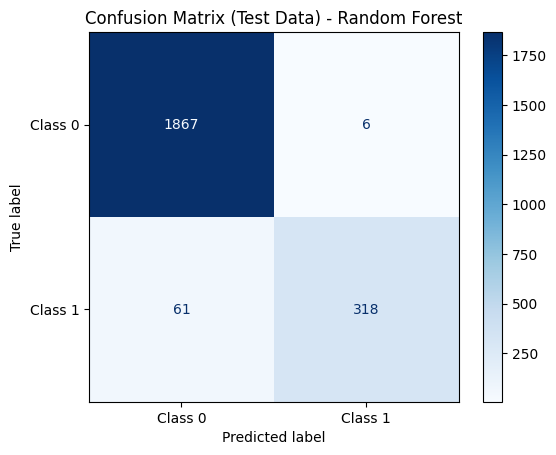

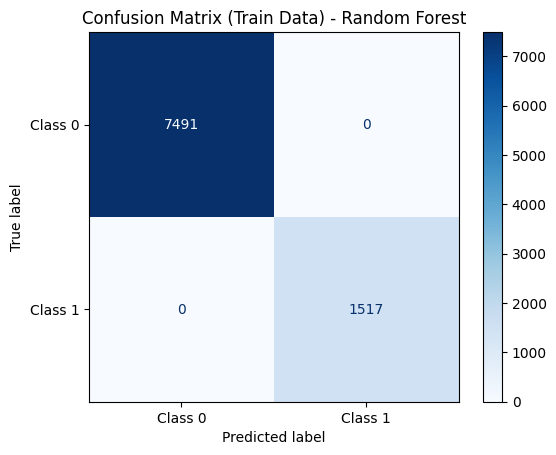

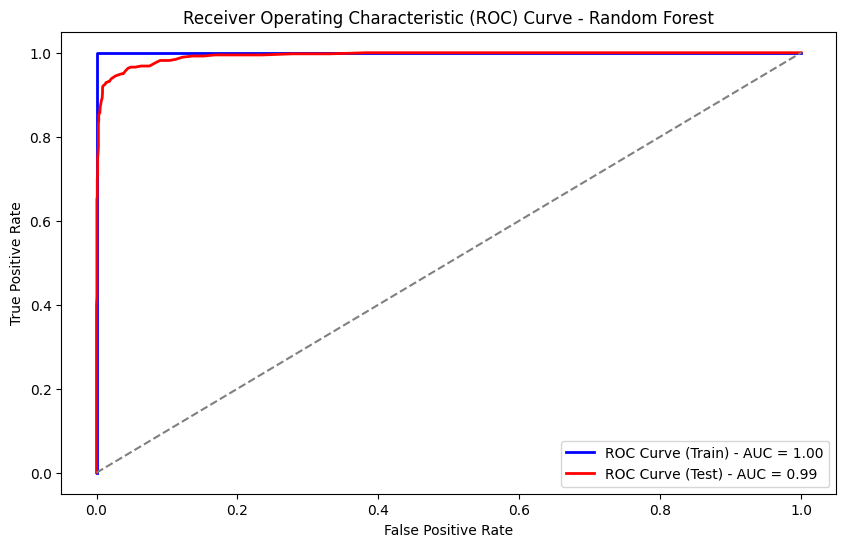


AdaBoost Results:


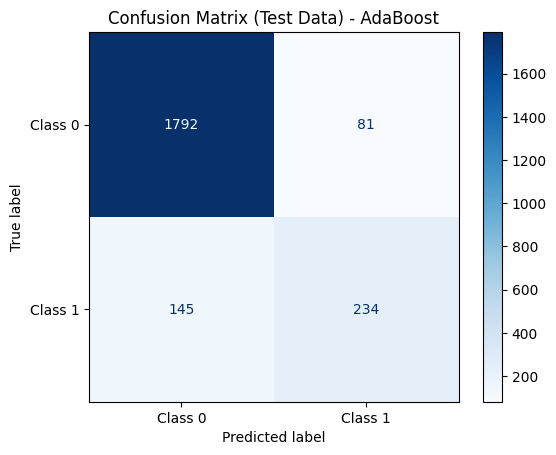

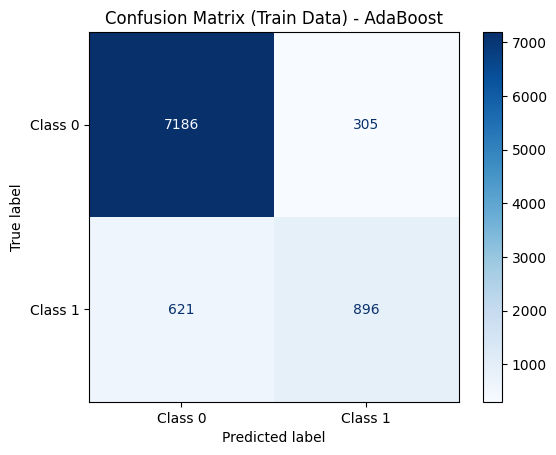

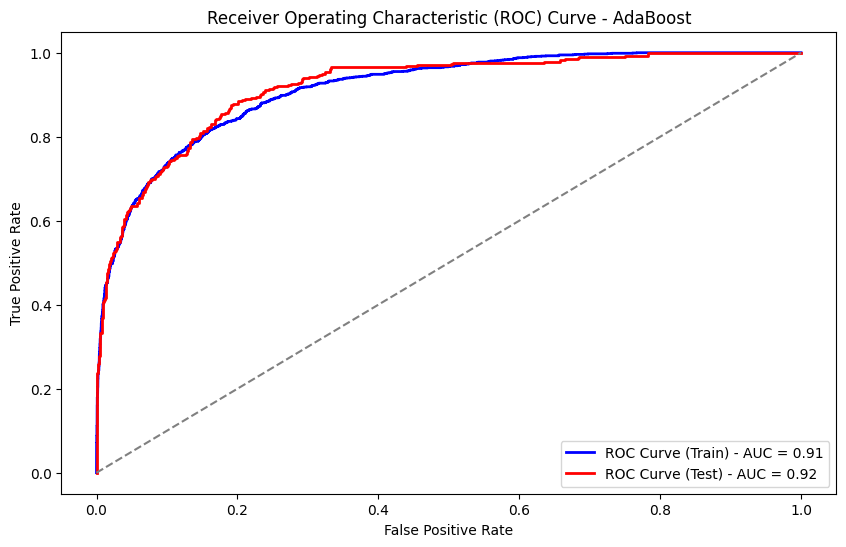


XGBoost Results:


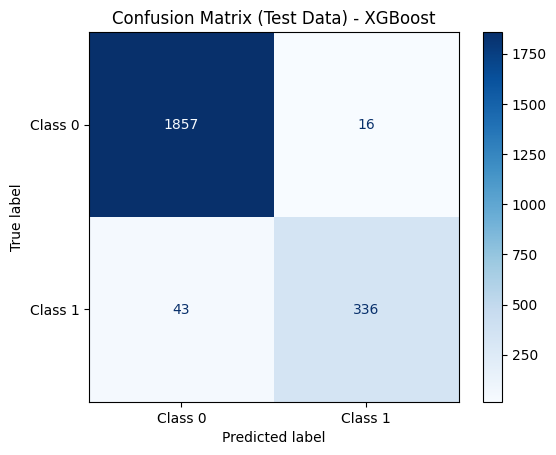

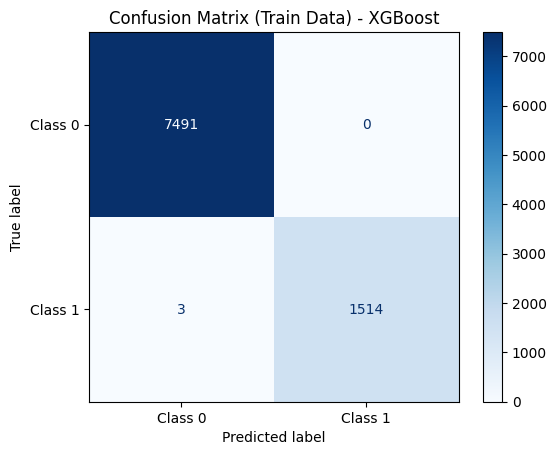

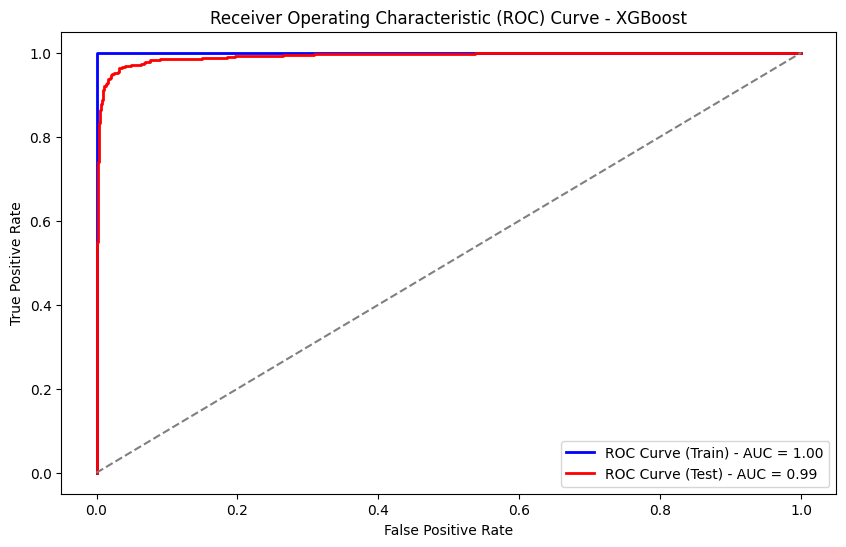


Naive Bayes Results:


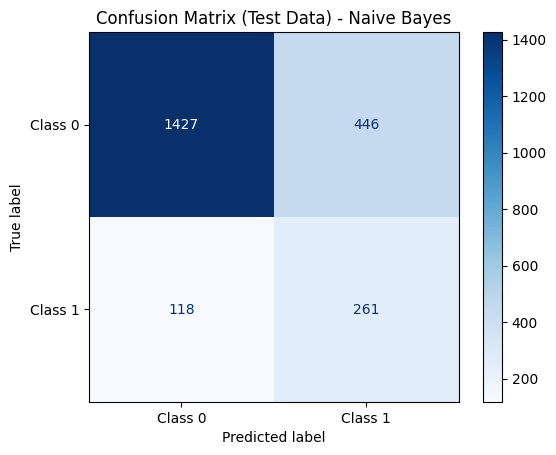

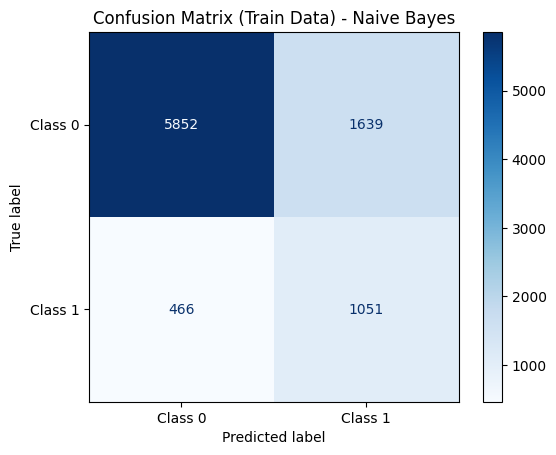

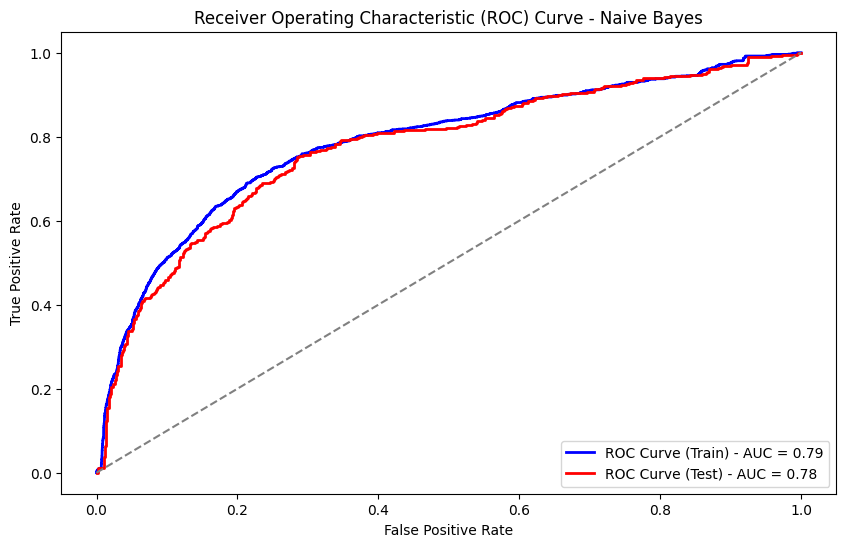


Model Comparison Metrics:
                 Model  Accuracy (Test)  Precision (Test)  Recall (Test)  \
0  Logistic Regression         0.886767          0.762712       0.474934   
1                  KNN         0.937833          0.865443       0.746702   
2                  SVM         0.928508          0.919231       0.630607   
3        Decision Tree         0.952487          0.852332       0.868074   
4        Random Forest         0.970249          0.981481       0.839050   
5             AdaBoost         0.899645          0.742857       0.617414   
6              XGBoost         0.973801          0.954545       0.886544   
7          Naive Bayes         0.749556          0.369165       0.688654   

   F1-Score (Test)  ROC-AUC (Test)  Accuracy (Train)  Precision (Train)  \
0         0.585366        0.867022          0.882993           0.775924   
1         0.801700        0.965906          0.971026           0.959736   
2         0.748044        0.938828          0.940386           

In [64]:
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, auc
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Convert labels to integer type
y_train_scaled = y_train_scaled.astype(int)
y_test_scaled = y_test_scaled.astype(int)

# Initialize models
models = {
    'Logistic Regression': LogisticRegression(),
    'KNN': KNeighborsClassifier(),
    'SVM': SVC(probability=True),  # Ensure probability=True for ROC
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
    'Naive Bayes': GaussianNB()
}

# Initialize a list to store all model metrics
model_metrics = []

# Loop through each model and calculate metrics
for model_name, model in models.items():
    print(f"\n{model_name} Results:")
    
    # Fit the model
    model.fit(X_train_scaled, y_train_scaled)
    
    # Make predictions
    y_pred_test = model.predict(X_test_scaled)
    y_pred_train = model.predict(X_train_scaled)
    
    # Ensure y_true and y_pred are integers
    y_test_int = y_test_scaled.astype(int)
    y_train_int = y_train_scaled.astype(int)
    
    # Convert y_pred to integers if necessary (this is crucial)
    y_pred_test = y_pred_test.astype(int)
    y_pred_train = y_pred_train.astype(int)
    
    # Store classification report in a dictionary
    classification_metrics = {
        'Model': model_name,
        'Accuracy (Test)': accuracy_score(y_test_int, y_pred_test),
        'Precision (Test)': precision_score(y_test_int, y_pred_test),
        'Recall (Test)': recall_score(y_test_int, y_pred_test),
        'F1-Score (Test)': f1_score(y_test_int, y_pred_test),
        'ROC-AUC (Test)': roc_auc_score(y_test_int, model.predict_proba(X_test_scaled)[:, 1]),
        'Accuracy (Train)': accuracy_score(y_train_int, y_pred_train),
        'Precision (Train)': precision_score(y_train_int, y_pred_train),
        'Recall (Train)': recall_score(y_train_int, y_pred_train),
        'F1-Score (Train)': f1_score(y_train_int, y_pred_train),
        'ROC-AUC (Train)': roc_auc_score(y_train_int, model.predict_proba(X_train_scaled)[:, 1]),
    }

    # Append the metrics dictionary to the list
    model_metrics.append(classification_metrics)

    # Confusion Matrix (Test and Train)
    cm_test = confusion_matrix(y_test_int, y_pred_test)
    cm_train = confusion_matrix(y_train_int, y_pred_train)
    
    # Plot Confusion Matrix (Test)
    disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Class 0', 'Class 1'])
    disp_test.plot(cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix (Test Data) - {model_name}')
    plt.show()

    # Plot Confusion Matrix (Train)
    disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=['Class 0', 'Class 1'])
    disp_train.plot(cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix (Train Data) - {model_name}')
    plt.show()

    # ROC Curve (Train and Test)
    fpr_train, tpr_train, _ = roc_curve(y_train_int, model.predict_proba(X_train_scaled)[:, 1])
    fpr_test, tpr_test, _ = roc_curve(y_test_int, model.predict_proba(X_test_scaled)[:, 1])

    roc_auc_train = auc(fpr_train, tpr_train)
    roc_auc_test = auc(fpr_test, tpr_test)

    # Plot ROC Curve
    plt.figure(figsize=(10, 6))
    plt.plot(fpr_train, tpr_train, color='blue', lw=2, label=f'ROC Curve (Train) - AUC = {roc_auc_train:.2f}')
    plt.plot(fpr_test, tpr_test, color='red', lw=2, label=f'ROC Curve (Test) - AUC = {roc_auc_test:.2f}')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic (ROC) Curve - {model_name}')
    plt.legend(loc='lower right')
    plt.show()

# Convert model metrics list into a DataFrame
df_model_metrics_original = pd.DataFrame(model_metrics)

# Display the comparison table
print("\nModel Comparison Metrics:")
print(df_model_metrics_original)



Logistic Regression Results:


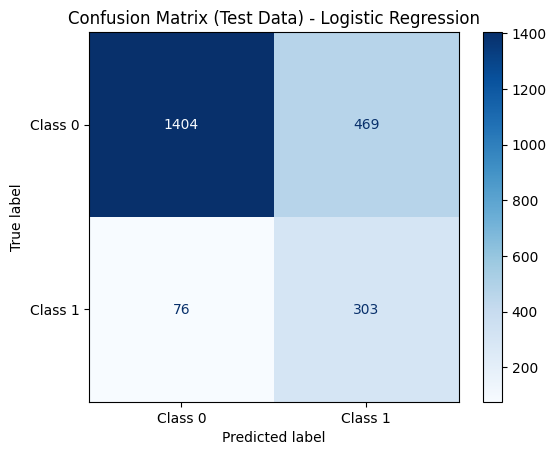

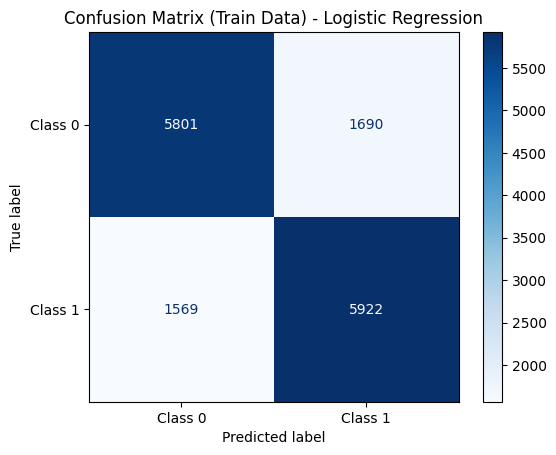

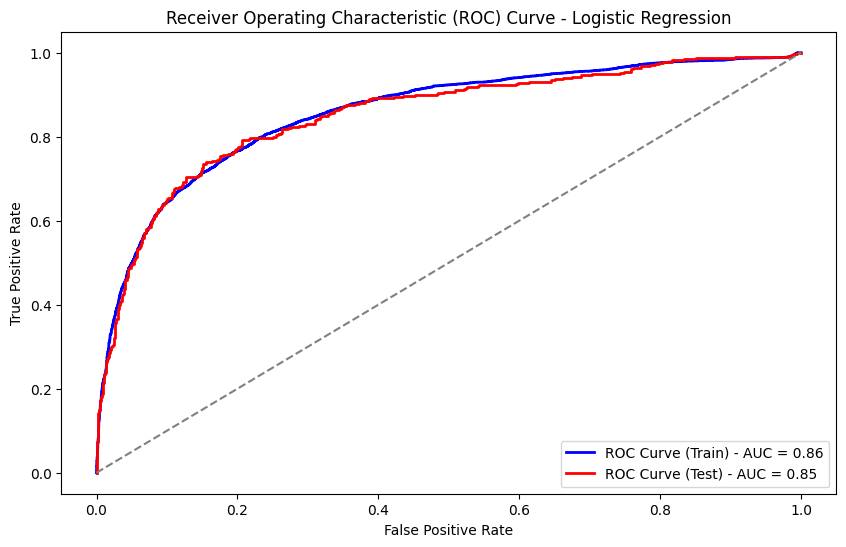


KNN Results:


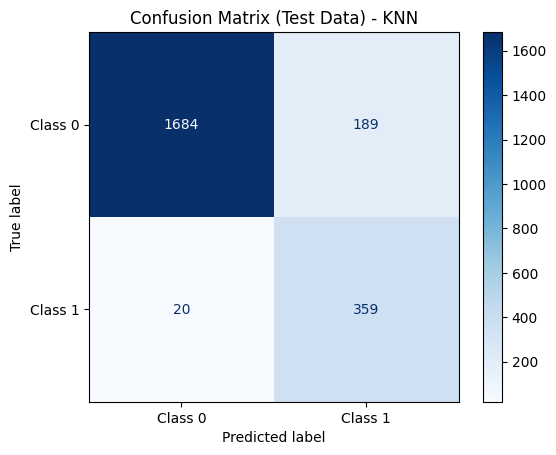

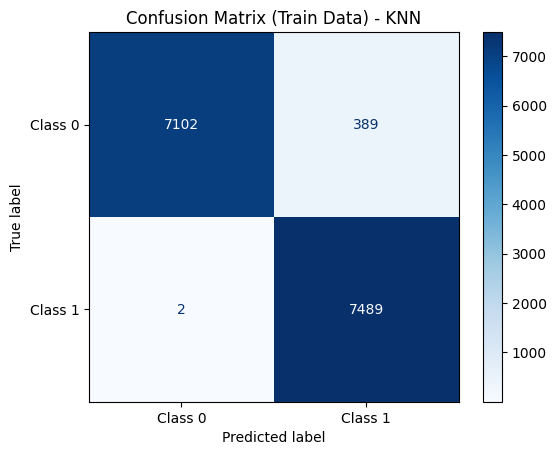

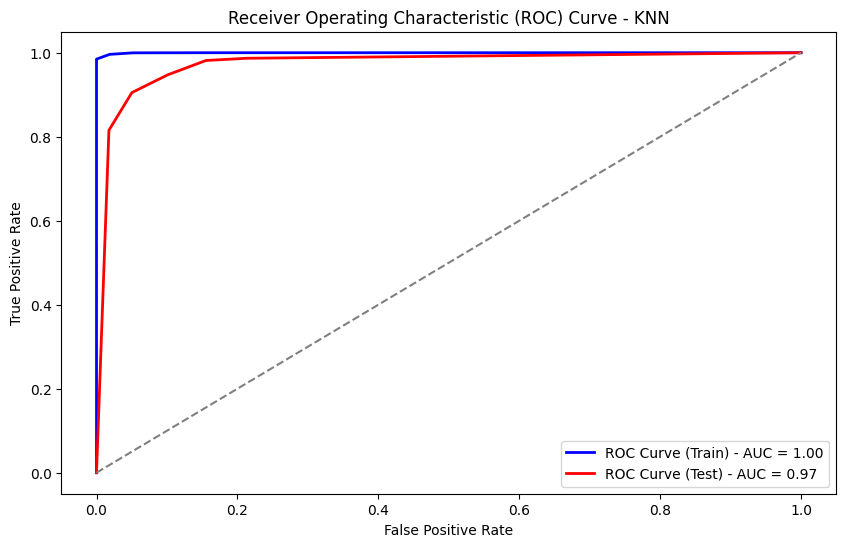


SVM Results:


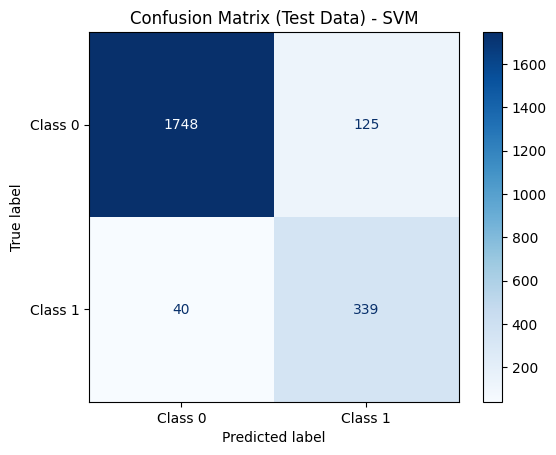

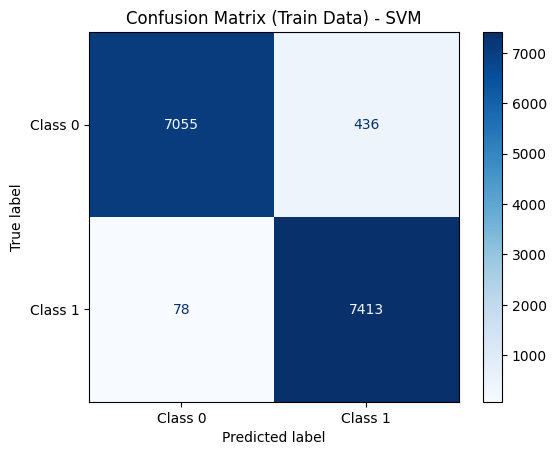

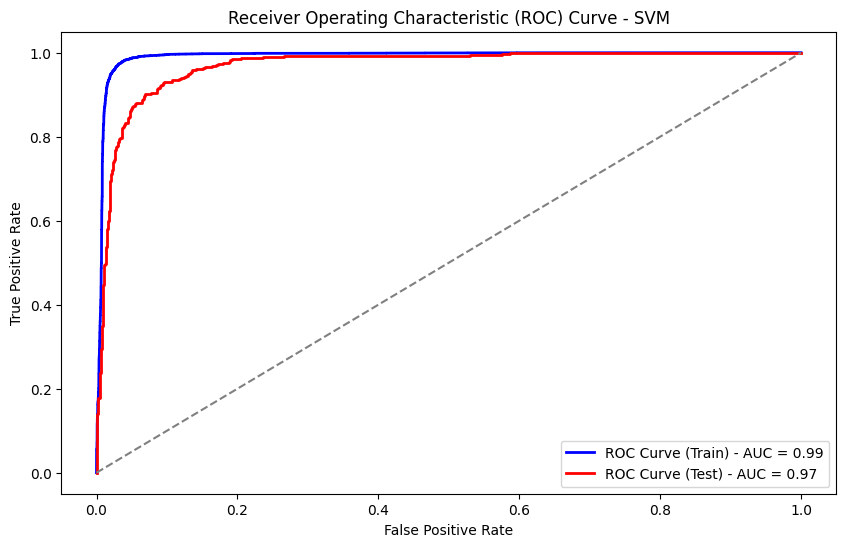


Decision Tree Results:


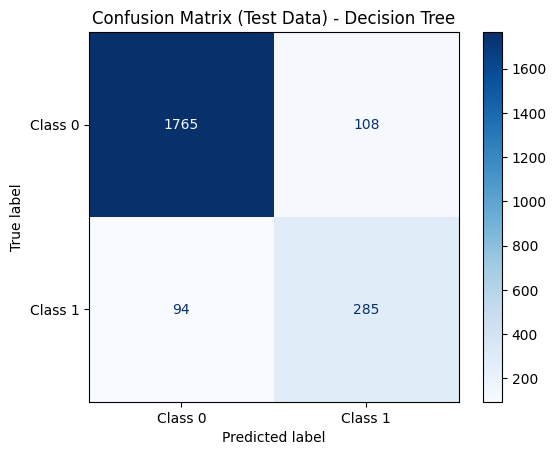

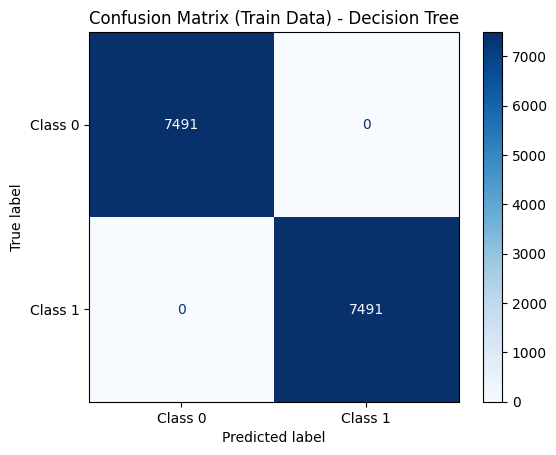

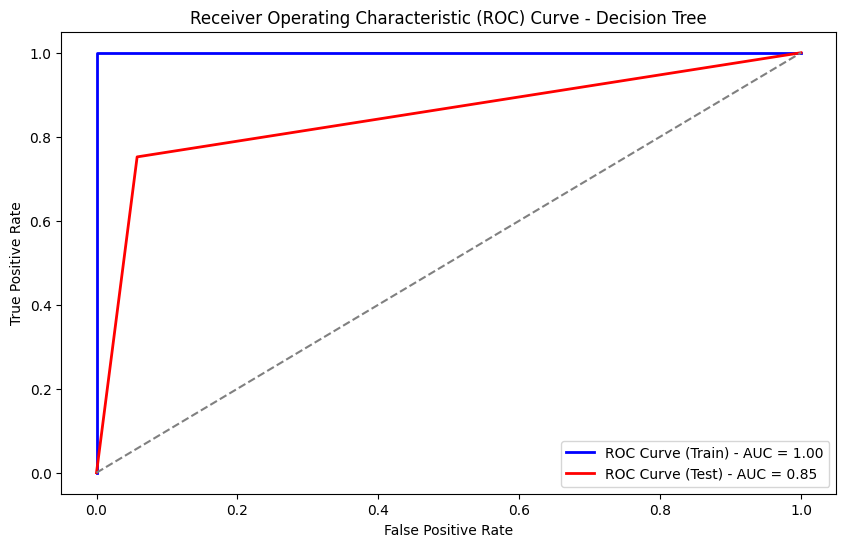


Random Forest Results:


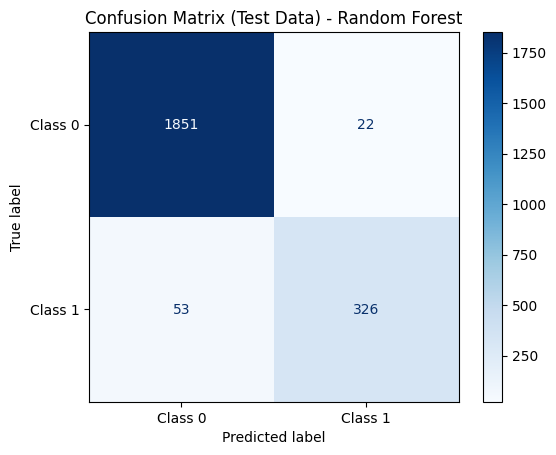

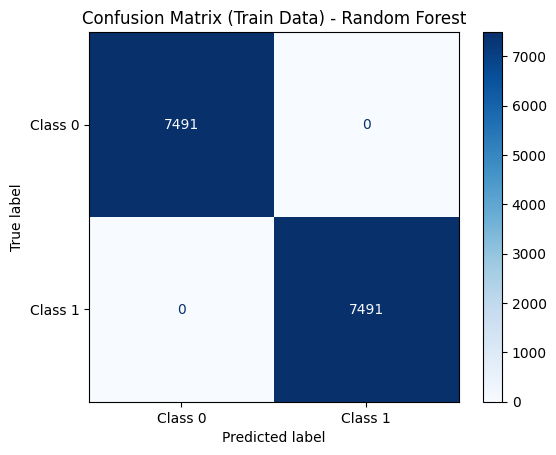

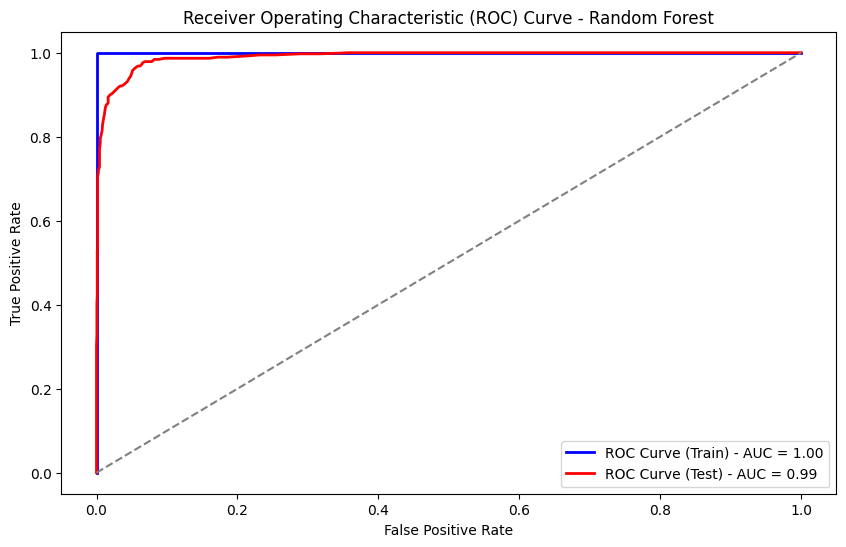


AdaBoost Results:


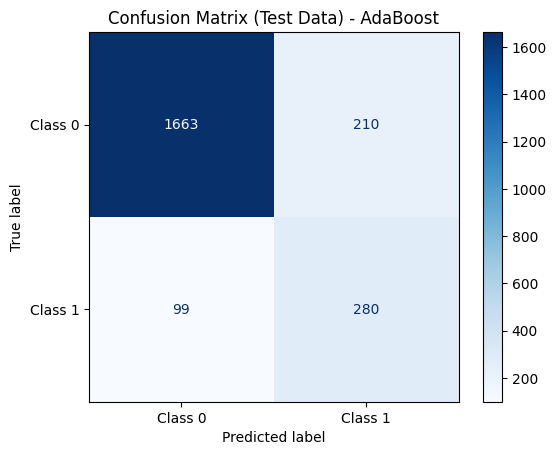

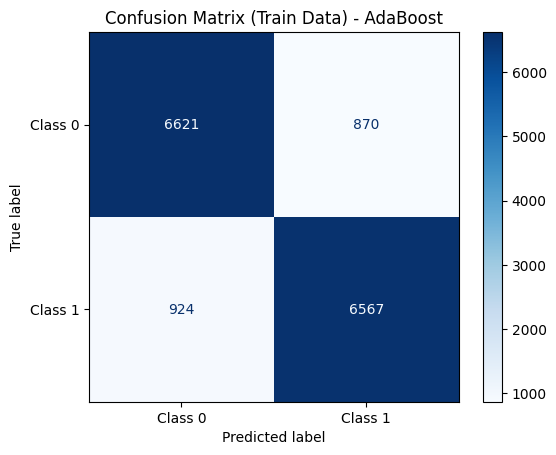

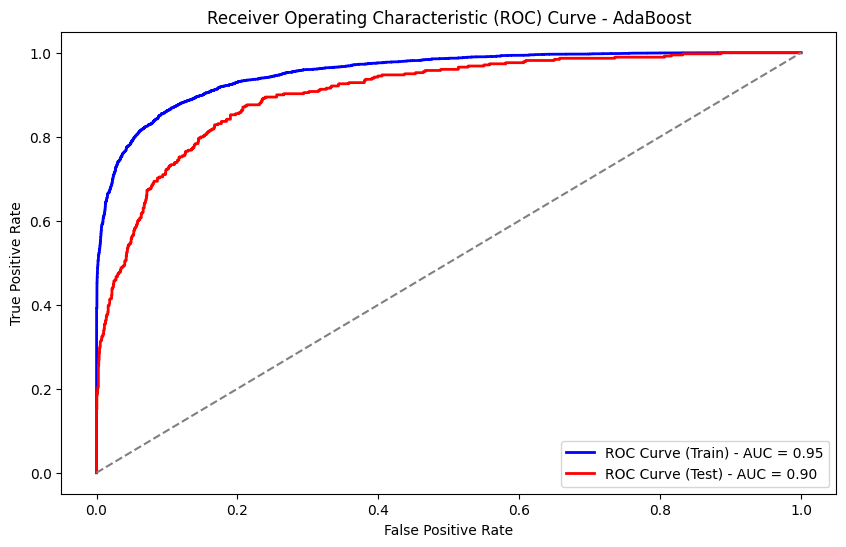


XGBoost Results:


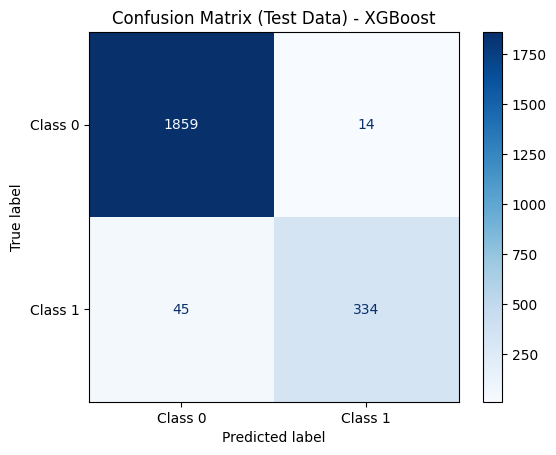

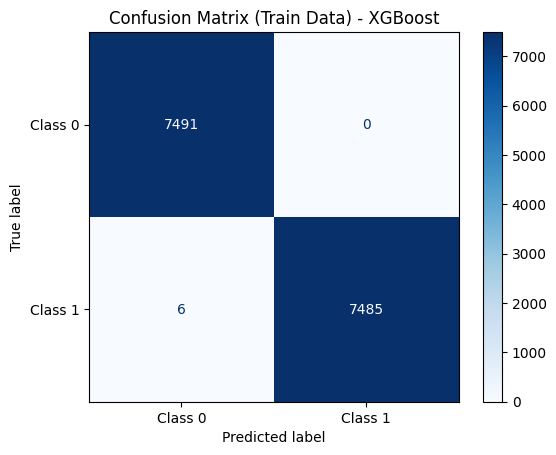

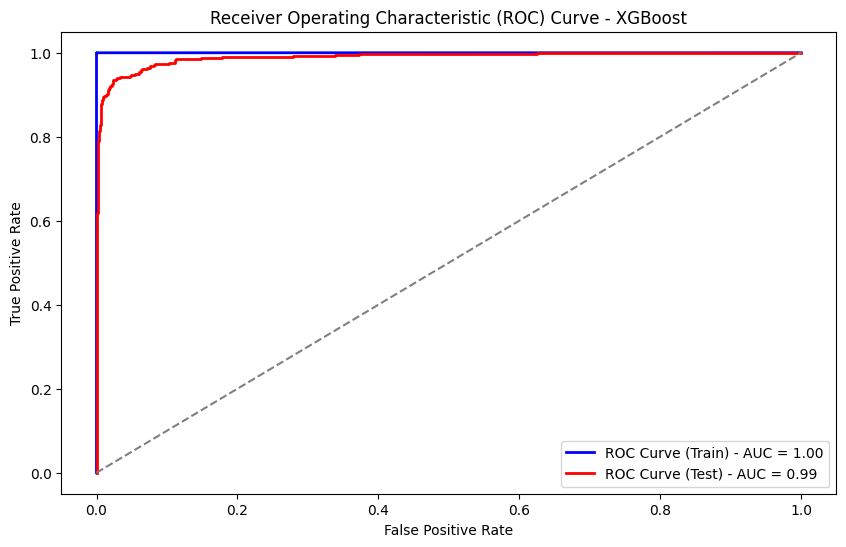


Naive Bayes Results:


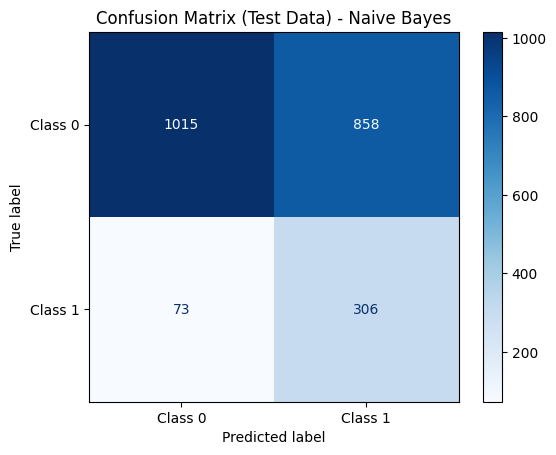

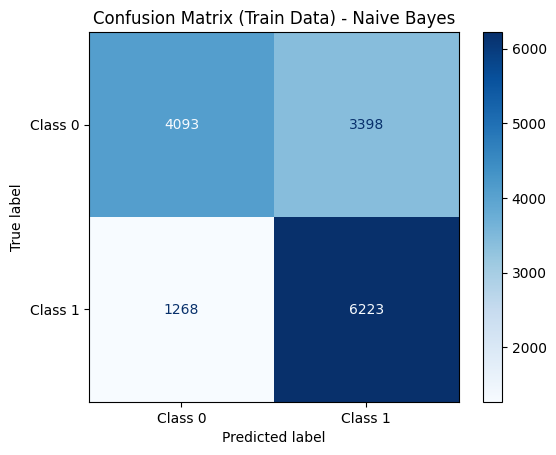

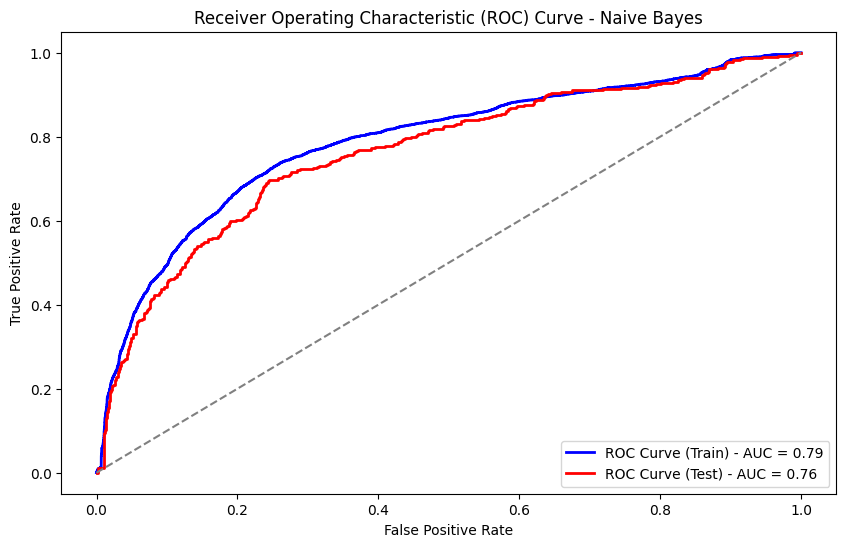


Model Comparison Metrics:
                 Model  Accuracy (Test)  Precision (Test)  Recall (Test)  \
0  Logistic Regression         0.757993          0.392487       0.799472   
1                  KNN         0.907194          0.655109       0.947230   
2                  SVM         0.926732          0.730603       0.894459   
3        Decision Tree         0.910302          0.725191       0.751979   
4        Random Forest         0.966696          0.936782       0.860158   
5             AdaBoost         0.862789          0.571429       0.738786   
6              XGBoost         0.973801          0.959770       0.881266   
7          Naive Bayes         0.586590          0.262887       0.807388   

   F1-Score (Test)  ROC-AUC (Test)  Accuracy (Train)  Precision (Train)  \
0         0.526499        0.852854          0.782472           0.777982   
1         0.774542        0.973218          0.973902           0.950622   
2         0.804270        0.969656          0.965692           

In [65]:
import pandas as pd
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, auc
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Apply SMOTE and scale the data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train_scaled)

# Initialize models
models = {
    'Logistic Regression': LogisticRegression(),
    'KNN': KNeighborsClassifier(),
    'SVM': SVC(probability=True),  # Ensure probability=True for ROC
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
    'Naive Bayes': GaussianNB()
}

# Initialize a list to store all model metrics
model_metrics = []

# Loop through each model and calculate metrics
for model_name, model in models.items():
    print(f"\n{model_name} Results:")
    
    # Fit the model on the SMOTE data
    model.fit(X_train_smote, y_train_smote)
    
    # Make predictions
    y_pred_test = model.predict(X_test_scaled)
    y_pred_train = model.predict(X_train_smote)  # Use resampled train set
    
    # Ensure y_true and y_pred are integers
    y_test_int = y_test_scaled.astype(int)
    y_train_int = y_train_smote.astype(int)
    
    # Convert y_pred to integers if necessary (this is crucial)
    y_pred_test = y_pred_test.astype(int)
    y_pred_train = y_pred_train.astype(int)
    
    # Store classification report in a dictionary
    classification_metrics = {
        'Model': model_name,
        'Accuracy (Test)': accuracy_score(y_test_int, y_pred_test),
        'Precision (Test)': precision_score(y_test_int, y_pred_test),
        'Recall (Test)': recall_score(y_test_int, y_pred_test),
        'F1-Score (Test)': f1_score(y_test_int, y_pred_test),
        'ROC-AUC (Test)': roc_auc_score(y_test_int, model.predict_proba(X_test_scaled)[:, 1]),
        'Accuracy (Train)': accuracy_score(y_train_int, y_pred_train),
        'Precision (Train)': precision_score(y_train_int, y_pred_train),
        'Recall (Train)': recall_score(y_train_int, y_pred_train),
        'F1-Score (Train)': f1_score(y_train_int, y_pred_train),
        'ROC-AUC (Train)': roc_auc_score(y_train_int, model.predict_proba(X_train_smote)[:, 1]),
    }

    # Append the metrics dictionary to the list
    model_metrics.append(classification_metrics)

    # Confusion Matrix (Test and Train)
    cm_test = confusion_matrix(y_test_int, y_pred_test)
    cm_train = confusion_matrix(y_train_int, y_pred_train)
    
    # Plot Confusion Matrix (Test)
    disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Class 0', 'Class 1'])
    disp_test.plot(cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix (Test Data) - {model_name}')
    plt.show()

    # Plot Confusion Matrix (Train)
    disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=['Class 0', 'Class 1'])
    disp_train.plot(cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix (Train Data) - {model_name}')
    plt.show()

    # ROC Curve (Train and Test)
    fpr_train, tpr_train, _ = roc_curve(y_train_int, model.predict_proba(X_train_smote)[:, 1])
    fpr_test, tpr_test, _ = roc_curve(y_test_int, model.predict_proba(X_test_scaled)[:, 1])

    roc_auc_train = auc(fpr_train, tpr_train)
    roc_auc_test = auc(fpr_test, tpr_test)

    # Plot ROC Curve
    plt.figure(figsize=(10, 6))
    plt.plot(fpr_train, tpr_train, color='blue', lw=2, label=f'ROC Curve (Train) - AUC = {roc_auc_train:.2f}')
    plt.plot(fpr_test, tpr_test, color='red', lw=2, label=f'ROC Curve (Test) - AUC = {roc_auc_test:.2f}')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic (ROC) Curve - {model_name}')
    plt.legend(loc='lower right')
    plt.show()

# Convert model metrics list into a DataFrame
df_model_metrics_smote = pd.DataFrame(model_metrics)

# Display the comparison table
print("\nModel Comparison Metrics:")
print(df_model_metrics_smote)


# Model Comparision

In [66]:
import pandas as pd

# Step 1: Add Sampling column
df_model_metrics_original['Sampling'] = 'Original'
df_model_metrics_smote['Sampling'] = 'SMOTE'

# Step 2: Combine both DataFrames
comparison_df = pd.concat([df_model_metrics_original, df_model_metrics_smote], ignore_index=True)

# Step 3: Define logic for Fit Status
def get_fit_status(row):
    train_score = row['F1-Score (Train)']
    test_score = row['F1-Score (Test)']

    if train_score - test_score > 0.15:
        return 'Overfit'
    elif train_score < 0.6 and test_score < 0.6:
        return 'Underfit'
    else:
        return 'Good Fit'

# Step 4: Apply Fit Status logic
comparison_df['Fit Status'] = comparison_df.apply(get_fit_status, axis=1)

# Step 6: Optional - Display or export
print(comparison_df)

                  Model  Accuracy (Test)  Precision (Test)  Recall (Test)  \
0   Logistic Regression         0.886767          0.762712       0.474934   
1                   KNN         0.937833          0.865443       0.746702   
2                   SVM         0.928508          0.919231       0.630607   
3         Decision Tree         0.952487          0.852332       0.868074   
4         Random Forest         0.970249          0.981481       0.839050   
5              AdaBoost         0.899645          0.742857       0.617414   
6               XGBoost         0.973801          0.954545       0.886544   
7           Naive Bayes         0.749556          0.369165       0.688654   
8   Logistic Regression         0.757993          0.392487       0.799472   
9                   KNN         0.907194          0.655109       0.947230   
10                  SVM         0.926732          0.730603       0.894459   
11        Decision Tree         0.910302          0.725191       0.751979   

# Model Tuning

# Perform Hyperparameter Tuning for Each Model (Original and SMOTE Data)

Tuning models on original data...

Tuning Logistic Regression...
Best Hyperparameters: {'solver': 'liblinear', 'max_iter': 100, 'C': 10}
Best Cross-Validation Accuracy: 0.8798

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.97      0.93      1873
           1       0.76      0.47      0.58       379

    accuracy                           0.89      2252
   macro avg       0.83      0.72      0.76      2252
weighted avg       0.88      0.89      0.88      2252



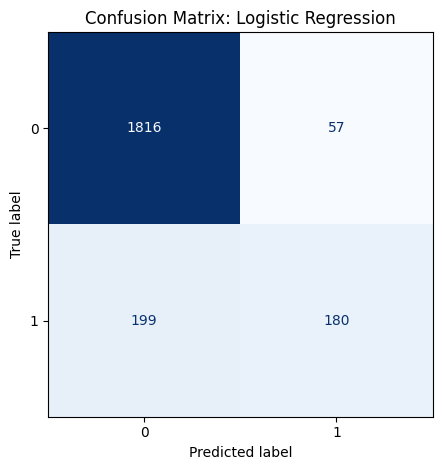


Tuning KNN...
Best Hyperparameters: {'weights': 'distance', 'n_neighbors': 3}
Best Cross-Validation Accuracy: 0.9442

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1873
           1       0.88      0.83      0.85       379

    accuracy                           0.95      2252
   macro avg       0.92      0.90      0.91      2252
weighted avg       0.95      0.95      0.95      2252



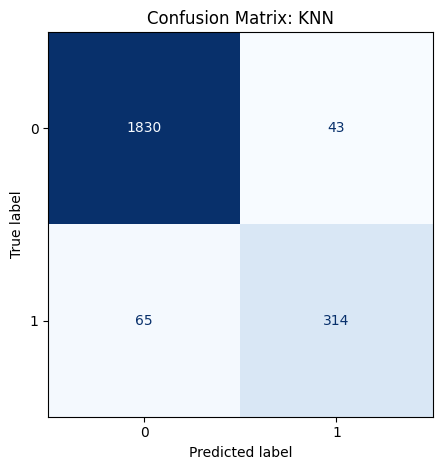


Tuning SVM...
Best Hyperparameters: {'kernel': 'rbf', 'gamma': 'scale', 'C': 1}
Best Cross-Validation Accuracy: 0.9139

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.99      0.96      1873
           1       0.92      0.63      0.75       379

    accuracy                           0.93      2252
   macro avg       0.92      0.81      0.85      2252
weighted avg       0.93      0.93      0.92      2252



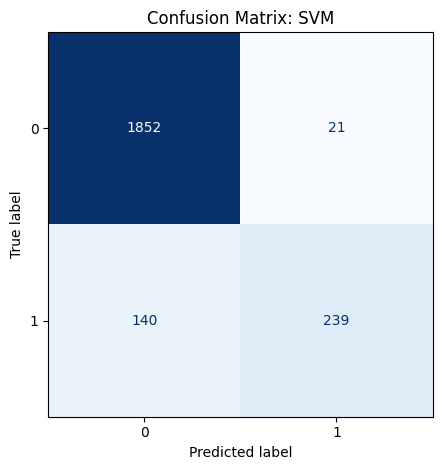


Tuning Decision Tree...
Best Hyperparameters: {'min_samples_split': 2, 'max_depth': None, 'criterion': 'gini'}
Best Cross-Validation Accuracy: 0.9151

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97      1873
           1       0.85      0.86      0.85       379

    accuracy                           0.95      2252
   macro avg       0.91      0.92      0.91      2252
weighted avg       0.95      0.95      0.95      2252



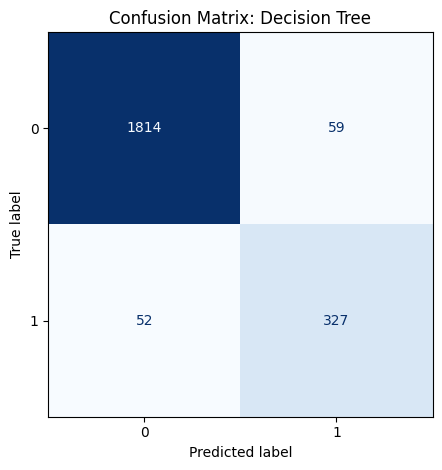


Tuning Random Forest...
Best Hyperparameters: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': None}
Best Cross-Validation Accuracy: 0.9522

Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1873
           1       0.98      0.84      0.91       379

    accuracy                           0.97      2252
   macro avg       0.98      0.92      0.94      2252
weighted avg       0.97      0.97      0.97      2252



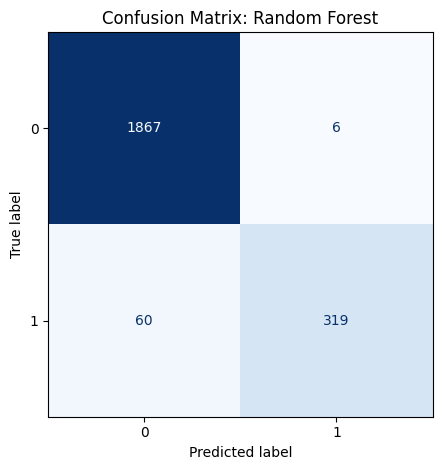


Tuning AdaBoost...
Best Hyperparameters: {'n_estimators': 50, 'learning_rate': 1}
Best Cross-Validation Accuracy: 0.8932

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.96      0.94      1873
           1       0.74      0.62      0.67       379

    accuracy                           0.90      2252
   macro avg       0.83      0.79      0.81      2252
weighted avg       0.89      0.90      0.90      2252



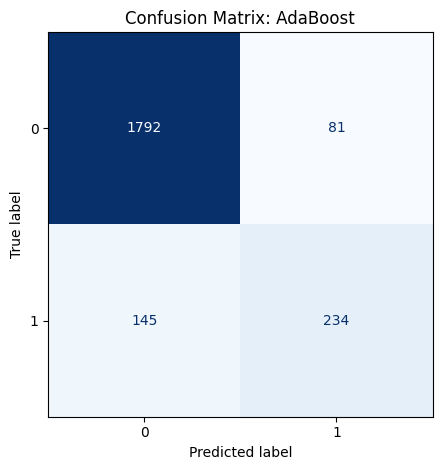


Tuning XGBoost...
Best Hyperparameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.5}
Best Cross-Validation Accuracy: 0.9513

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1873
           1       0.94      0.86      0.90       379

    accuracy                           0.97      2252
   macro avg       0.96      0.92      0.94      2252
weighted avg       0.97      0.97      0.97      2252



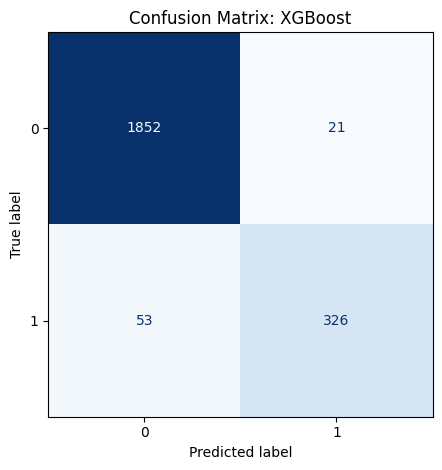


Tuning Naive Bayes...
Best Hyperparameters: {'var_smoothing': 1e-09}
Best Cross-Validation Accuracy: 0.7620

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.76      0.83      1873
           1       0.37      0.69      0.48       379

    accuracy                           0.75      2252
   macro avg       0.65      0.73      0.66      2252
weighted avg       0.83      0.75      0.78      2252



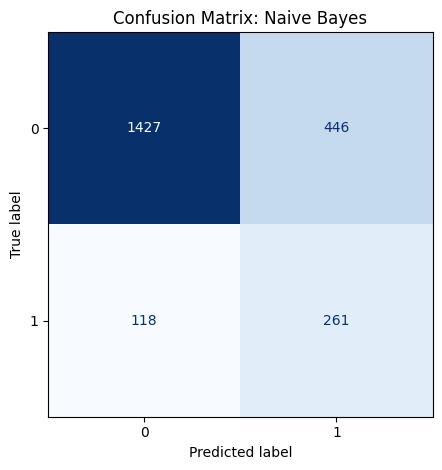


Tuning models on SMOTE data...

Tuning Logistic Regression...
Best Hyperparameters: {'solver': 'liblinear', 'max_iter': 100, 'C': 10}
Best Cross-Validation Accuracy: 0.7797

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.75      0.84      1873
           1       0.39      0.80      0.52       379

    accuracy                           0.76      2252
   macro avg       0.67      0.77      0.68      2252
weighted avg       0.85      0.76      0.78      2252



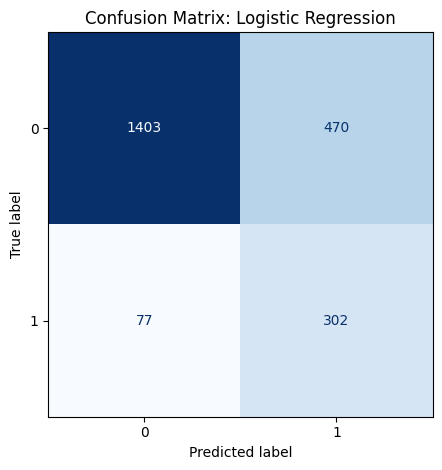


Tuning KNN...
Best Hyperparameters: {'weights': 'distance', 'n_neighbors': 3}
Best Cross-Validation Accuracy: 0.9622

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.94      0.96      1873
           1       0.76      0.94      0.84       379

    accuracy                           0.94      2252
   macro avg       0.87      0.94      0.90      2252
weighted avg       0.95      0.94      0.94      2252



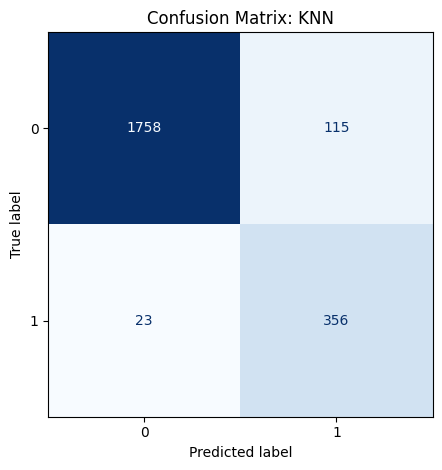


Tuning SVM...
Best Hyperparameters: {'kernel': 'rbf', 'gamma': 'scale', 'C': 1}
Best Cross-Validation Accuracy: 0.9429

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.93      0.95      1873
           1       0.73      0.89      0.80       379

    accuracy                           0.93      2252
   macro avg       0.85      0.91      0.88      2252
weighted avg       0.94      0.93      0.93      2252



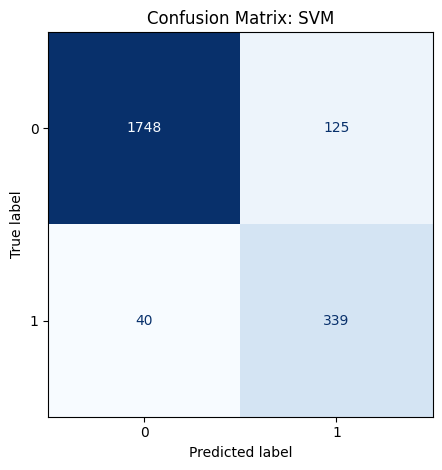


Tuning Decision Tree...
Best Hyperparameters: {'min_samples_split': 2, 'max_depth': None, 'criterion': 'gini'}
Best Cross-Validation Accuracy: 0.9287

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      1873
           1       0.74      0.77      0.75       379

    accuracy                           0.92      2252
   macro avg       0.85      0.86      0.85      2252
weighted avg       0.92      0.92      0.92      2252



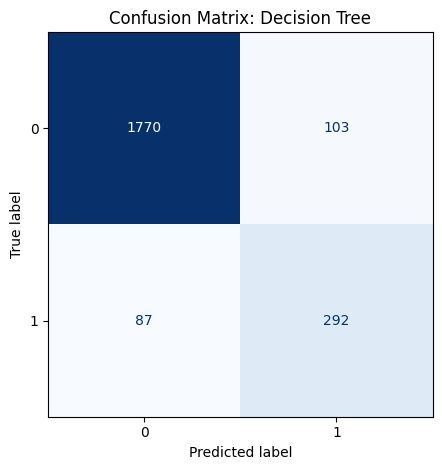


Tuning Random Forest...
Best Hyperparameters: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': None}
Best Cross-Validation Accuracy: 0.9748

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      1873
           1       0.95      0.88      0.91       379

    accuracy                           0.97      2252
   macro avg       0.96      0.93      0.95      2252
weighted avg       0.97      0.97      0.97      2252



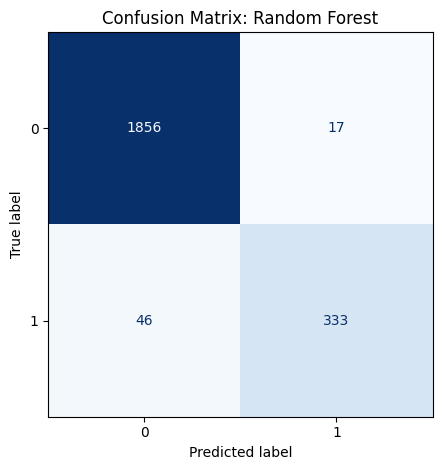


Tuning AdaBoost...
Best Hyperparameters: {'n_estimators': 100, 'learning_rate': 1}
Best Cross-Validation Accuracy: 0.8823

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.90      0.92      1873
           1       0.60      0.73      0.66       379

    accuracy                           0.87      2252
   macro avg       0.77      0.82      0.79      2252
weighted avg       0.89      0.87      0.88      2252



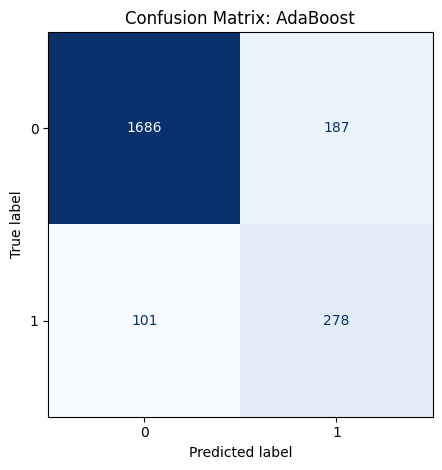


Tuning XGBoost...
Best Hyperparameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.5}
Best Cross-Validation Accuracy: 0.9468

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1873
           1       0.92      0.86      0.89       379

    accuracy                           0.96      2252
   macro avg       0.95      0.92      0.93      2252
weighted avg       0.96      0.96      0.96      2252



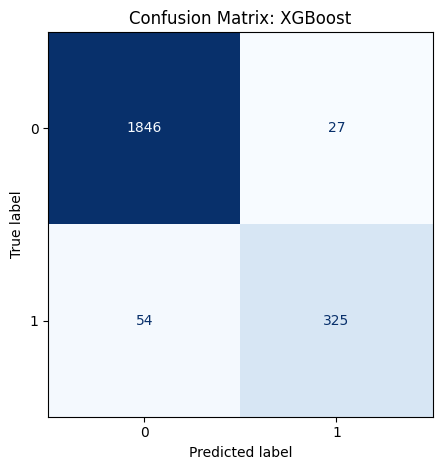


Tuning Naive Bayes...
Best Hyperparameters: {'var_smoothing': 1e-09}
Best Cross-Validation Accuracy: 0.6865

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.54      0.69      1873
           1       0.26      0.81      0.40       379

    accuracy                           0.59      2252
   macro avg       0.60      0.67      0.54      2252
weighted avg       0.82      0.59      0.64      2252



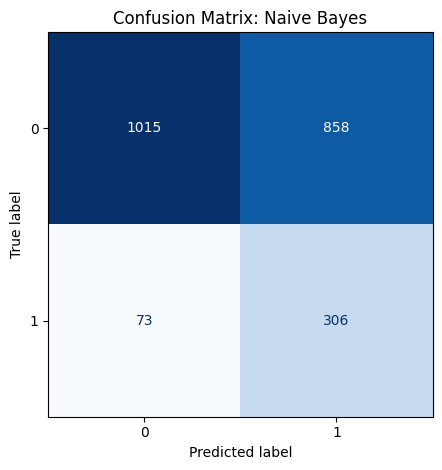


Model Performance on Original Data:
                 Model  Train Accuracy  Train Precision  Train Recall  \
4        Random Forest        1.000000         1.000000      1.000000   
6              XGBoost        0.999778         1.000000      0.998682   
3        Decision Tree        1.000000         1.000000      1.000000   
1                  KNN        1.000000         1.000000      1.000000   
2                  SVM        0.940386         0.948718      0.682927   
5             AdaBoost        0.897202         0.746045      0.590639   
0  Logistic Regression        0.882549         0.771598      0.429796   
7          Naive Bayes        0.766319         0.390706      0.692815   

   Train F1 Score  Test Accuracy  Test Precision  Test Recall  Test F1 Score  
4        1.000000       0.970693        0.981538     0.841689       0.906250  
6        0.999340       0.967140        0.939481     0.860158       0.898072  
3        1.000000       0.950710        0.847150     0.862797       

In [69]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB

# Define parameter grids (reduced ranges for speed)
param_grid_lr = {
    'C': [0.1, 1, 10],
    'solver': ['liblinear'],
    'max_iter': [100, 200]
}

param_grid_knn = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance']
}

param_grid_svm = {
    'C': [0.1, 1],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale']
}

param_grid_dt = {
    'max_depth': [3, 5, None],
    'min_samples_split': [2, 5],
    'criterion': ['gini']
}

param_grid_rf = {
    'n_estimators': [50, 100],
    'max_depth': [None, 10],
    'min_samples_split': [2],
    'min_samples_leaf': [1]
}

param_grid_ada = {
    'n_estimators': [50, 100],
    'learning_rate': [0.1, 1]
}

param_grid_xgb = {
    'n_estimators': [50, 100],
    'learning_rate': [0.1, 0.5],
    'max_depth': [3, 5],
    'subsample': [0.8, 1.0]
}

param_grid_nb = {
    'var_smoothing': [1e-9, 1e-8]
}

# Define models
models = {
    'Logistic Regression': LogisticRegression(),
    'KNN': KNeighborsClassifier(),
    'SVM': SVC(probability=True),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
    'Naive Bayes': GaussianNB()
}

param_grids = {
    'Logistic Regression': param_grid_lr,
    'KNN': param_grid_knn,
    'SVM': param_grid_svm,
    'Decision Tree': param_grid_dt,
    'Random Forest': param_grid_rf,
    'AdaBoost': param_grid_ada,
    'XGBoost': param_grid_xgb,
    'Naive Bayes': param_grid_nb
}

def tune_models(X_train, y_train, X_test, y_test, X_train_smote=None, y_train_smote=None):
    best_models = {}

    # Fix: Ensure consistent label types
    y_train = y_train.astype(int)
    y_test = y_test.astype(int)
    if y_train_smote is not None:
        y_train_smote = y_train_smote.astype(int)

    for model_name, model in models.items():
        print(f"\nTuning {model_name}...")

        param_grid = param_grids[model_name]
        search = RandomizedSearchCV(
            estimator=model,
            param_distributions=param_grid,
            n_iter=8,
            cv=3,
            n_jobs=-1,
            verbose=0,
            scoring='accuracy',
            random_state=42
        )

        if X_train_smote is not None and y_train_smote is not None:
            search.fit(X_train_smote, y_train_smote)
        else:
            search.fit(X_train, y_train)

        best_models[model_name] = search.best_estimator_

        print(f"Best Hyperparameters: {search.best_params_}")
        print(f"Best Cross-Validation Accuracy: {search.best_score_:.4f}")

        y_pred = search.best_estimator_.predict(X_test)

        print("\nClassification Report:")
        print(classification_report(y_test, y_pred))

        # Confusion Matrix
        ConfusionMatrixDisplay.from_estimator(
            search.best_estimator_,
            X_test,
            y_test,
            cmap=plt.cm.Blues,
            colorbar=False
        )
        plt.title(f"Confusion Matrix: {model_name}")
        plt.tight_layout()
        plt.show()

    return best_models
# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.transform(X_test)

# Apply SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train_scaled)

# Run tuning on original and SMOTE data
print("Tuning models on original data...")
best_models_original = tune_models(X_train_scaled, y_train_scaled, X_test_scaled, y_test_scaled)

print("\nTuning models on SMOTE data...")
best_models_smote = tune_models(X_train_scaled, y_train_scaled, X_test_scaled, y_test_scaled,
                                X_train_smote, y_train_smote)
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def evaluate_models(models_dict, X_train, y_train, X_test, y_test):
    results = []
    
    for name, model in models_dict.items():
        train_pred = model.predict(X_train)
        test_pred = model.predict(X_test)

        results.append({
            'Model': name,
            'Train Accuracy': accuracy_score(y_train, train_pred),
            'Train Precision': precision_score(y_train, train_pred, zero_division=0),
            'Train Recall': recall_score(y_train, train_pred, zero_division=0),
            'Train F1 Score': f1_score(y_train, train_pred, zero_division=0),
            'Test Accuracy': accuracy_score(y_test, test_pred),
            'Test Precision': precision_score(y_test, test_pred, zero_division=0),
            'Test Recall': recall_score(y_test, test_pred, zero_division=0),
            'Test F1 Score': f1_score(y_test, test_pred, zero_division=0)
        })
    
    return pd.DataFrame(results)
# Evaluate and store model performance metrics
df_metrics_original = evaluate_models(best_models_original, X_train_scaled, y_train_scaled, X_test_scaled, y_test_scaled)
df_metrics_smote = evaluate_models(best_models_smote, X_train_smote, y_train_smote, X_test_scaled, y_test_scaled)
print("\nModel Performance on Original Data:")
print(df_metrics_original.sort_values(by='Test F1 Score', ascending=False))

print("\nModel Performance on SMOTE Data:")
print(df_metrics_smote.sort_values(by='Test F1 Score', ascending=False))

df_metrics_original['Sampling'] = 'Original'
df_metrics_smote['Sampling'] = 'SMOTE'
df_combined_metrics = pd.concat([df_metrics_original, df_metrics_smote], ignore_index=True)
# Sort by Test F1 Score for comparison
df_combined_metrics_sorted = df_combined_metrics.sort_values(by='Test F1 Score', ascending=False)

# Display all 16 rows
print("\nCombined Model Performance (Original + SMOTE):")
print(df_combined_metrics_sorted)


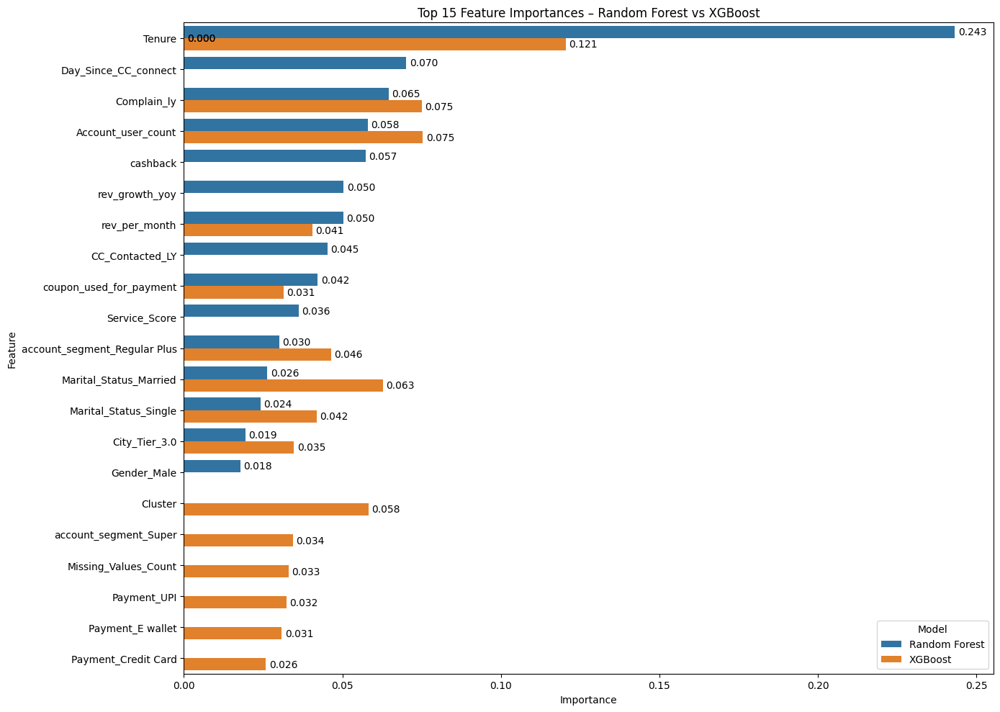

In [71]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Retrieve the tuned models
rf_model = best_models_smote['Random Forest']  # or best_models_original_tuned['Random Forest']
xgb_model = best_models_smote['XGBoost']       # or best_models_original_tuned['XGBoost']

# Use the correct feature names (same for both if same training set used)
feature_names = X_train.columns  # or X_train_smote.columns depending on what you used

# Create DataFrames of feature importances
rf_importances = pd.DataFrame({
    'Feature': feature_names,
    'Importance': rf_model.feature_importances_,
    'Model': 'Random Forest'
})

xgb_importances = pd.DataFrame({
    'Feature': feature_names,
    'Importance': xgb_model.feature_importances_,
    'Model': 'XGBoost'
})

# Combine both DataFrames
combined_importances = pd.concat([rf_importances, xgb_importances])

# Sort and take top 15 for each model
top_rf = rf_importances.sort_values(by='Importance', ascending=False).head(15)
top_xgb = xgb_importances.sort_values(by='Importance', ascending=False).head(15)
top_combined = pd.concat([top_rf, top_xgb])

plt.figure(figsize=(14, 10))
ax = sns.barplot(data=top_combined, x='Importance', y='Feature', hue='Model')

# Add labels on each bar
for p in ax.patches:
    width = p.get_width()
    ax.text(width + 0.001,               # X position (slightly outside the bar)
            p.get_y() + p.get_height()/2,  # Y position (center of the bar)
            f'{width:.3f}',                # Text (rounded to 3 decimals)
            va='center')

plt.title('Top 15 Feature Importances – Random Forest vs XGBoost')
plt.tight_layout()
plt.show()



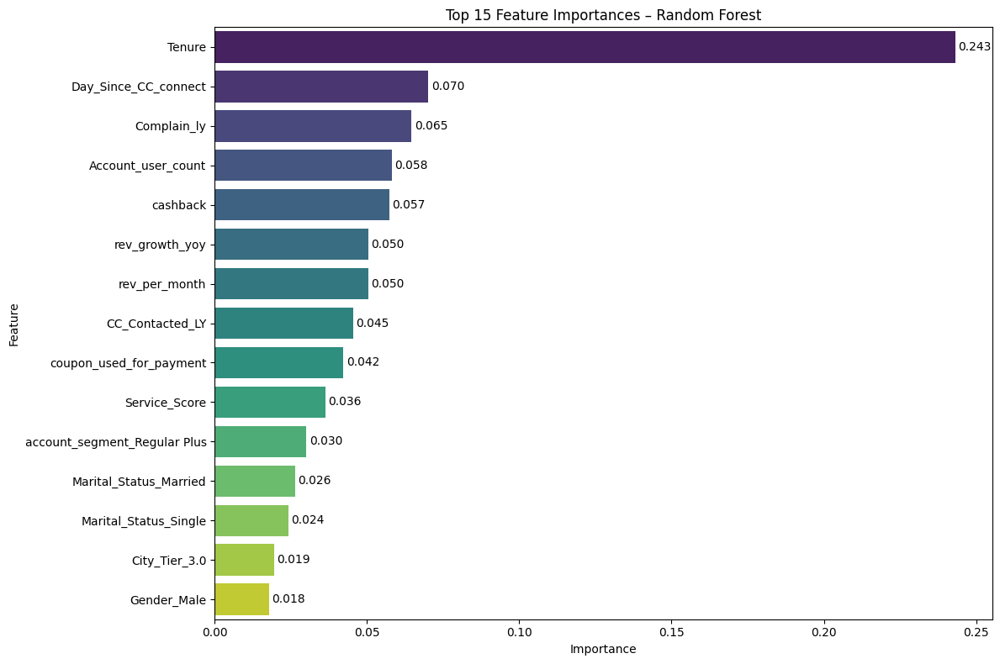

In [72]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Retrieve the tuned Random Forest model
rf_model = best_models_smote['Random Forest']  # or best_models_original_tuned['Random Forest']

# Use the correct feature names
feature_names = X_train.columns  # or X_train_smote.columns depending on what you used

# Create DataFrame for Random Forest feature importances
rf_importances = pd.DataFrame({
    'Feature': feature_names,
    'Importance': rf_model.feature_importances_,
    'Model': 'Random Forest'
})

# Sort and take top 15 features
top_rf = rf_importances.sort_values(by='Importance', ascending=False).head(15)

# Plot
plt.figure(figsize=(12, 8))
ax = sns.barplot(data=top_rf, x='Importance', y='Feature', palette='viridis')

# Add labels on each bar
for p in ax.patches:
    width = p.get_width()
    ax.text(width + 0.001, p.get_y() + p.get_height()/2,
            f'{width:.3f}', va='center')

plt.title('Top 15 Feature Importances – Random Forest')
plt.tight_layout()
plt.show()


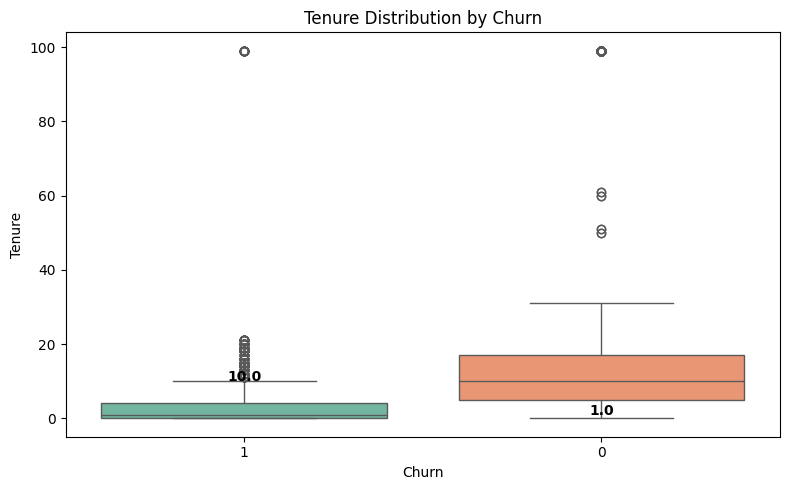

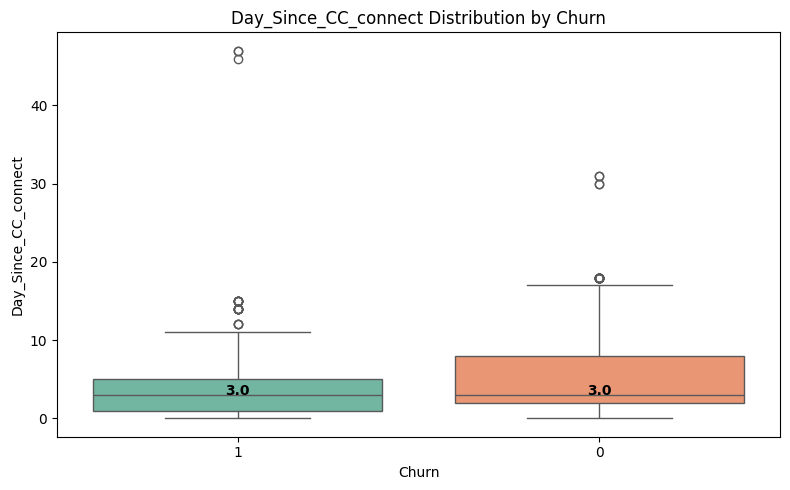

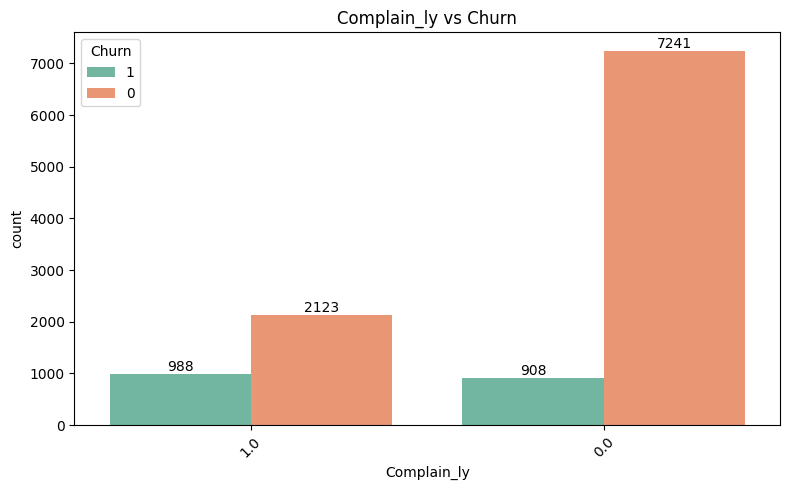

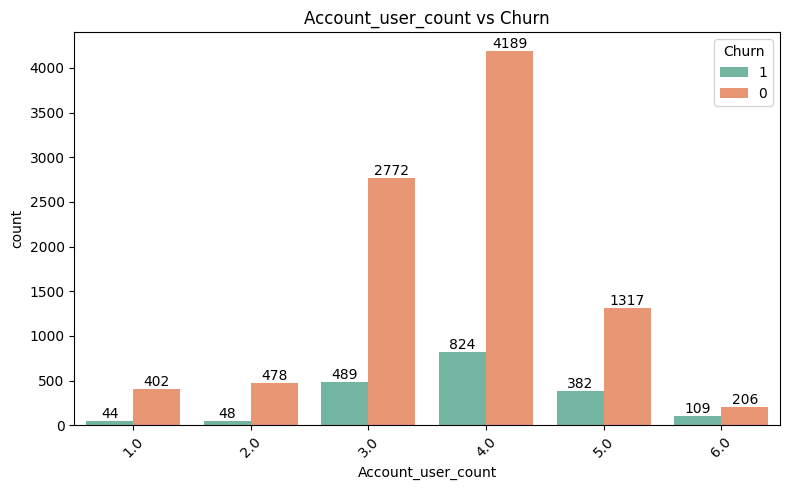

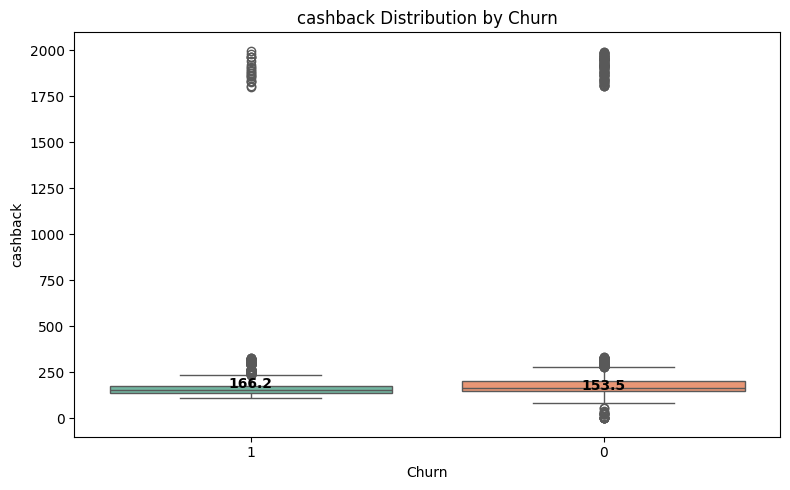

In [77]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Retrieve the tuned Random Forest model
rf_model = best_models_smote['Random Forest']

# Use the correct feature names
feature_names = X_train.columns

# Create DataFrame for Random Forest feature importances
rf_importances = pd.DataFrame({
    'Feature': feature_names,
    'Importance': rf_model.feature_importances_,
    'Model': 'Random Forest'
})

# Sort and take top 5 features
top_rf = rf_importances.sort_values(by='Importance', ascending=False).head(5)
top_features = top_rf['Feature'].values

# Plot bivariate plots for each top feature
for feature in top_features:
    plt.figure(figsize=(8, 5))
    
    if df[feature].dtype == 'object' or df[feature].nunique() < 10:
        ax = sns.countplot(data=df, x=feature, hue='Churn', palette='Set2')
        plt.title(f'{feature} vs Churn')
        plt.xticks(rotation=45)

        # Add count labels
        for container in ax.containers:
            ax.bar_label(container, label_type='edge', fontsize=10)
    
    else:
        ax = sns.boxplot(data=df, x='Churn', y=feature, palette='Set2')
        plt.title(f'{feature} Distribution by Churn')

        # Optionally add median values
        medians = df.groupby('Churn')[feature].median()
        for i, median in enumerate(medians):
            ax.text(i, median, f'{median:.1f}', horizontalalignment='center', color='black', weight='bold')

    plt.tight_layout()
    plt.show()

